# CIS 6800 Project: VAE and Diffusion Transformer

Instructions:

*  In this HW you will implement a patch-based VAE and train a Diffusion model using the pre-trained VAE checkpoint.
*  We provided you with a zipfile that contains a subset of 10,000 images from the CelebA dataset.
*  The Diffusion training session lasts a couple hours, so you should start part (b) as early as you can!
*  **Please submit your ipynb notebook as well as a pdf version of it. Include all visualizations and answers to the questions.**
*   Part A is due Wed 10/28, and Part B is due Wed 11/4.






Diffusion Transformer Paper: [https://arxiv.org/pdf/2212.09748](https://arxiv.org/pdf/2212.09748)


In [3]:
from google.colab import drive
drive.mount('/content/gdrive')
%cd /content/gdrive/MyDrive/CIS6800HW4

Mounted at /content/gdrive
/content/gdrive/MyDrive/CIS6800HW4


In [4]:
!pip install -q torch torchvision numpy tqdm datasets torch-ema pytorch-lightning timm

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 33.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 51.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 18.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 926.4/926.4 kB 59.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 20.2 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


In [5]:
import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, Subset
from torchvision import transforms as tf
from torchvision.datasets import FashionMNIST
from torchvision.utils import make_grid, save_image
from torch_ema import ExponentialMovingAverage as EMA
import pytorch_lightning as pl

import math
import random
import numpy as np
from tqdm import tqdm
from einops import rearrange, repeat  # You can learn about einops at https://einops.rocks
from itertools import pairwise
from accelerate import Accelerator
from types import SimpleNamespace
from typing import Optional
import matplotlib.pyplot as plt
import torch.optim as optim

import zipfile
import io
from PIL import Image
from torchvision import transforms
from torchvision.utils import save_image, make_grid


In [6]:
# Set the seed for reproducibility

def set_seed(seed: int):
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    random.seed(seed)

set_seed(42)

# Part A

# Variational Autoencoder (VAE)


In this part of the project you will train a Patch-based VAE to capture key facial features on on a subset of the CelebA dataset, consisting of 10000 face images. You can use the code below to load images from the given zipfile. We recommend resizing the images to (32, 32) for the following tasks but you're welcome to experiment with different sizes.

In [7]:
class CelebADataset(Dataset):
    def __init__(self, zip_file, transform=None):
        self.zip_file = zip_file
        self.transform = transform

        # Open the zip file and get the list of images
        self.zip = zipfile.ZipFile(self.zip_file, 'r')
        self.image_list = [file for file in self.zip.namelist() if file.endswith(('.jpg', '.png'))]

    def __len__(self):
        return len(self.image_list)

    def __getitem__(self, idx):
        # Get image name from the list
        img_name = self.image_list[idx]
        try:
            # Read image data from the zip file
            with self.zip.open(img_name) as img_file:
                img_data = img_file.read()
                img = Image.open(io.BytesIO(img_data)).convert('RGB')

            if self.transform:
                img = self.transform(img)

        except zipfile.BadZipFile:
            # print(f"BadZipFile error encountered with image {img_name}. Skipping this file.")
            return None

        return img

def collate_fn(batch):
    # Filter out None values (e.g., images that couldn't be loaded)
    batch = [b for b in batch if b is not None]
    # If the batch is empty after filtering, return None (can be skipped by DataLoader)
    if len(batch) == 0:
        return None

    return torch.utils.data.dataloader.default_collate(batch)

# Usage of the dataset and dataloader
def get_celeba_dataloader(zip_path, batch_size=32, image_size=(32, 32)):
    transform = transforms.Compose([
        transforms.Resize(image_size),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
    ])
    dataset = CelebADataset(zip_path, transform=transform)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=4, collate_fn=collate_fn)

    return dataloader

# Function to display original and reconstructed images (4 images only)
def show_original_reconstructed(orig_images, recon_images, epoch):
    # Move the images back to CPU and denormalize
    orig_images = orig_images.cpu().numpy()
    recon_images = recon_images.cpu().numpy()

    # Clip the values to the valid range [0, 1] for display
    orig_images = np.clip(orig_images * 0.5 + 0.5, 0, 1)  # Denormalize and clip
    recon_images = np.clip(recon_images * 0.5 + 0.5, 0, 1)  # Denormalize and clip

    # Plot images side by side (4 images)
    fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(10, 4))
    for i in range(4):
        # Original image
        axes[0, i].imshow(orig_images[i].transpose(1, 2, 0))  # Correct shape for imshow
        axes[0, i].axis('off')
        axes[0, i].set_title("Original")

        # Reconstructed image
        axes[1, i].imshow(recon_images[i].transpose(1, 2, 0))  # Correct shape for imshow
        axes[1, i].axis('off')
        axes[1, i].set_title("Reconstructed")

    plt.suptitle(f'Epoch {epoch}: Original vs Reconstructed')
    plt.show()

In [8]:
#Initialize your dataloaders here
zip_file_path = "celeba_10000_images.zip"
dataloader = get_celeba_dataloader(zip_file_path, batch_size=128, image_size=(32, 32))

### Patch-based Variational Autoencoder

PatchVAE divides an input image into smaller patches and operates on these patches rather than the entire image at once. By processing images in patches, the PatchVAE learns to capture fine-grained (local) and high-level (global) patterns, depending on the patch size. In this section you should:

1.   Implement the PatchEmbed Class. This class is designed to create overlapping patches from an image, embed those patches into a latent space, and provide a method to reconstruct the image from the latent representations.

2.   Implement the PatchVAE model.

    *   The `encode` method convert patch embeddings into latent variables (mu and logvar) through a convolutional encoder. Rearrange patches to treat them as channels before passing them through the encoder.
    *   The `reparameterize` method applied the reparameterization trick `z = mu + eps * std` where `eps` is sampled from a standard normal distribution.
    *  The `decode` method convert the latent variable z back into patch embeddings, then reconstruct the original image from these patches
    *  The `forward` method first patchifies the image, encode, reparameterize, decode, and finally reconstruct the image
    *  The `compute_loss` calculates the reconstruction loss (Mean Squared Error) and the KL divergence loss to encourage the latent space to follow a normal distribution. Combine these losses to get the total VAE loss.
    *  The `sample` method generates new random images from the learned latent space. Random latent vector `z` are sampled, decoded into patches, and reconstructed into full images.


3.   Train the model on the faces dataset. **Experiment with different patch sizes and report the patch size with the best tradeoff between low-level details and high-level texture. Plot the training and validation loss and visualize a couple reconstructed images during training.**

4. After training, generate sample images from the latent space. Specifically, you need to sample latent vectors from a normal distribution, decode the latent varaibles, and reconstruct the images. **Visualize 4 generated examples. Do the generated images resemble realistic human faces? Explain in a couple sentences.**

In [9]:
class PatchEmbed(nn.Module):
    def __init__(self, img_size=128, patch_size=32, stride=8, channels=3, embed_dim=128, bias=True):
        super().__init__()
        """
        Use Conv2D to create image patches of size (patch_size, patch_size) with overlapping regions.

        Each patch should have embedding size embed_dim.
        """
        self.patch_size = patch_size
        self.stride = stride
        self.embed_dim = embed_dim
        self.img_size = img_size

        # Conv2d to generate overlapping patches (from image to latent space)
        self.proj = nn.Conv2d(channels, embed_dim, kernel_size=patch_size, stride=stride, bias=bias)

        # Transposed Conv2d to reconstruct patches from latent space to RGB (from latent to image space)
        self.deconv = nn.ConvTranspose2d(embed_dim, channels, kernel_size=patch_size, stride=stride, bias=bias)

        H_out = (img_size - self.patch_size) // self.stride + 1
        W_out = (img_size - self.patch_size) // self.stride + 1
        self.num_patches = H_out * W_out

    def forward(self, x):
        """
        Input x is an image of size [B, C, img_size, img_size]

        Return patches of size [B, num_patches, embed_dim]
        """
        ######## BEGIN TODO ########
        patches = self.proj(x)
        patches = patches.flatten(2)
        patches = patches.transpose(-1, -2)
        ######## END TODO ########

        return patches

    def reconstruct(self, patches, img_size):
        """
        Reconstruct the image from the patches by averaging overlapping regions.
        Input patches: [B, num_patches, embed_dim]
        img_size: (img_size, img_size)  # original size of the input image

        Output images: [B, img_size, img_size]
        """
        ######## BEGIN TODO ########
        patches = patches.transpose(-1, -2)
        patches = patches.reshape(patches.shape[0], patches.shape[1], int(np.sqrt(self.num_patches)), int(np.sqrt(self.num_patches)))
        reconstructed_image = self.deconv(patches)
        ######## END TODO ########

        return reconstructed_image

In [10]:
class PatchVAE(nn.Module):
    def __init__(self, patch_size, img_channels, img_size,
                  embed_dim=1024, latent_dim=512, stride=8):
        super(PatchVAE, self).__init__()
        self.patch_size = patch_size
        self.img_size = img_size
        self.embed_dim = embed_dim
        self.latent_dim = latent_dim
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

        # Patch embedding layer (Patchify the image)
        self.patch_embed = PatchEmbed(img_size=img_size, patch_size=patch_size, stride=stride, channels=img_channels, embed_dim=embed_dim)
        self.num_patches = self.patch_embed.num_patches

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(embed_dim, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.Conv2d(256, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
        )
        self.conv_mu = nn.Conv2d(128, latent_dim, kernel_size=3, stride=1, padding=1)
        self.conv_logvar = nn.Conv2d(128, latent_dim, kernel_size=3, stride=1, padding=1)

        # Decoder
        self.decoder_input = nn.Conv2d(latent_dim, 128, kernel_size=3, stride=1, padding=1)
        self.decoder = nn.Sequential(
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.ConvTranspose2d(256, embed_dim, kernel_size=3, stride=1, padding=1),
        )

    def encode(self, patches):
        """
        Encode the patch embeddings into latent space (mu and logvar).
        Args:
            patches: Patch embeddings of shape [B, num_patches, embed_dim].
        """
        ######## BEGIN TODO ########
        patches = patches.transpose(-1, -2).unsqueeze(2)
        encoded_patches = self.encoder(patches)
        mu = self.conv_mu(encoded_patches)
        logvar = self.conv_logvar(encoded_patches)
        ######## END TODO ########
        return mu, logvar

    def reparameterize(self, mu, logvar):
        """
        Reparameterization trick to sample from N(mu, var) using N(0,1).
        Args:
            mu: Mean of the latent distribution.
            logvar: Log variance of the latent distribution.
        """
        ######## BEGIN TODO ########
        eps = torch.normal(mean=torch.zeros_like(mu), std=torch.ones_like(mu))
        std = torch.exp(0.5 * logvar) # Putting 0.5 in the exponent is a more efficient alternative to taking the square root outside the log
        ######## END TODO ########
        return mu + eps * std

    def decode(self, z):
        """
        Decode the latent variable z back to patch embeddings.
        Args:
            z: Latent variable of shape [B, latent_dim, 1, num_patches].
        """
        ######## BEGIN TODO ########
        patch_recon = self.decoder_input(z)
        patch_recon = self.decoder(patch_recon)
        ######## END TODO ########
        return rearrange(patch_recon, 'b c 1 p -> b p c')  # Back to (B, num_patches, embed_dim)

    def forward(self, x):
        """
        Forward pass through the VAE. Patchify the input, encode into latent space, reparameterize, and decode.
        Args:
            x: Input image of shape [B, C, img_size, img_size].
        """
        ######## BEGIN TODO ########
        patches = self.patch_embed.forward(x)
        mu, logvar = self.encode(patches)
        z = self.reparameterize(mu, logvar)
        recon_patches = self.decode(z)
        recon_image = self.patch_embed.reconstruct(recon_patches, self.img_size)
        ######## END TODO ########

        return recon_image, mu, logvar

    def compute_loss(self, recon_image, original_image, mu, logvar):
        """
        Compute the VAE loss, which consists of the reconstruction loss and KL divergence.
        Args:
            recon_image: Reconstructed image. (ERIK NOTE: Should be (batch_size, 3, img_size, img_size))
            original_image: Original input image. (ERIK NOTE: Should be (batch_size, 3, img_size, img_size))
            mu: Mean of the latent distribution. (ERIK NOTE: Should be (batch_size, latent_dim))
            logvar: Log variance of the latent distribution. (ERIK NOTE: Should be (batch_size, latent_dim))
        Returns:
            loss (Tensor): Total loss (reconstruction loss + KL divergence). (ERIK NOTE: Should be (batch_size))
        """
        ######## BEGIN TODO ########
        var = torch.exp(logvar)
        recon_loss = F.mse_loss(recon_image, original_image)
        kl_loss = -0.5 * torch.sum(1 + torch.log(var**2) - mu**2 - var**2)
        ######## END TODO ########
        return recon_loss, kl_loss

    def sample(self, num_samples):
        """
        Generate random samples from the learned distribution.
        Args:
            num_samples (int): Number of samples to generate.
        Returns:
            samples (Tensor): Generated (ERIK NOTE: Should be (num_samples, 3, img_size, img_size))
        """
        ######## BEGIN TODO ########
        z = torch.normal(mean=torch.zeros((num_samples, self.latent_dim, 1, self.num_patches)), std=torch.ones((num_samples, self.latent_dim, 1, self.num_patches))).to(device)
        sample_patches = self.decode(z)
        sample_images = self.patch_embed.reconstruct(sample_patches, self.img_size)
        ######## END TODO ########
        return sample_images

In [11]:
def train_patchvae(model, dataloader, optimizer, device, epochs=10, print_interval=100, checkpoint_path='best_model.pth'):
    """
    Training loop for the PatchVAE model with visualization of reconstructed images and saving the best model checkpoint.

    Args:
        model: The PatchVAE model to be trained.
        dataloader: Dataloader for the training data.
        optimizer: Optimizer for updating the model parameters.
        device: Device (CPU or GPU) on which the training will run.
        epochs: Number of training epochs.
        print_interval: Interval at which the loss will be printed during training.
        checkpoint_path: Path to save the best model checkpoint.

    Returns:
        losses: List of training losses for each epoch.
    """
    model.train()
    model.to(device)
    losses = []
    recon_losses = []
    kl_losses = []
    best_loss = float('inf')  # Initialize with a large value
    initial_beta = 5e-8 # Start with a small KL weight
    final_beta = 5e-6 # Gradually increase to full KL weight

    for epoch in range(epochs):
        ######## BEGIN TODO ########
        running_loss = 0.0
        running_recon_loss = 0.0
        running_kl_loss = 0.0
        if epoch < 50:
            beta = np.exp(np.log(initial_beta) + (np.log(final_beta) - np.log(initial_beta)) * (epoch / (50-1)))
        else:
            beta = final_beta
        for batch_idx, original_image in enumerate(dataloader):
            original_image = original_image.to(device)
            recon_image, mu, logvar = model.forward(original_image)

            recon_loss, kl_loss = model.compute_loss(recon_image, original_image, mu, logvar)
            loss = recon_loss.mean() + beta * kl_loss.mean()

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
            running_recon_loss += recon_loss.item()
            running_kl_loss += kl_loss.item()

            if batch_idx == 0:
                if epoch == 0:
                    print(f'Beginning of Training, Loss: {loss.item()}, Reconstruction Loss: {recon_loss.item()}, KL Loss: {kl_loss.item()}')
                    losses.append(loss.item())
                    recon_losses.append(recon_loss.item())
                    kl_losses.append(kl_loss.item())

                visualize_reconstruction(original_image[:4].detach(), recon_image[:4].detach(), epoch)

        avg_loss = running_loss / len(dataloader)
        avg_recon_loss = running_recon_loss / len(dataloader)
        avg_kl_loss = running_kl_loss / len(dataloader)
        losses.append(avg_loss)
        recon_losses.append(avg_recon_loss)
        kl_losses.append(avg_kl_loss)
        print(f'Epoch: {epoch+1}/{epochs}, Avg Loss: {avg_loss}, Avg Reconstruction Loss: {running_recon_loss/len(dataloader)}, Avg KL Loss: {running_kl_loss/len(dataloader)}, Beta: {beta}')
        if loss < best_loss:
            best_loss = loss
            torch.save(model.state_dict(), '/content/' + checkpoint_path)
        ######## END TODO ########
    return losses, recon_losses, kl_losses

def visualize_reconstruction(original_images, recon_images, epoch):
    """
    Visualize original and reconstructed images side by side.

    Args:
        original_images: Batch of original images (values between 0 and 1).
        recon_images: Batch of reconstructed images (values between 0 and 1).
        epoch: Current epoch number.
    """
    num_images = min(4, original_images.size(0))  # Visualize at most 4 images
    fig, axes = plt.subplots(2, num_images, figsize=(12, 4))

    for i in range(num_images):
        # Original images (ensure values are between 0 and 1)
        orig_img = original_images[i].permute(1, 2, 0).cpu().numpy()  # Convert to (H, W, C)
        orig_img = (orig_img + 1) / 2
        orig_img = np.clip(orig_img, 0, 1)  # Clip values to [0, 1] range

        # Reconstructed images (ensure values are between 0 and 1)
        recon_img = recon_images[i].permute(1, 2, 0).cpu().numpy()  # Convert to (H, W, C)
        recon_img = (recon_img + 1) / 2
        recon_img = np.clip(recon_img, 0, 1)  # Clip values to [0, 1] range

        # Display original images
        axes[0, i].imshow(orig_img)
        axes[0, i].set_title("Original")
        axes[0, i].axis('off')

        # Display reconstructed images
        axes[1, i].imshow(recon_img)
        axes[1, i].set_title("Reconstructed")
        axes[1, i].axis('off')

    plt.suptitle(f"Reconstruction at Epoch {epoch+1}")
    plt.show()



_DISCUSSION FOR QUESTION 3:_

_The code for training the PatchVAE model, alongside example reconstructions from during training and the training loss curves, are shown below for both patch sizes of 32 and 8. As explained below, in our experimentation with different patch sizes, we found that a patch size of 32 provided both the best high-level structure and low-level detail, so our results with a patch size of 32 should be viewed as our true results, while our results with a patch size of 8 should merely be regarded as a reference point for a previous failed attempt which motivated the change to a patch size of 32._

_ASIDE: HYPERPARAMETER DISCUSSION_

_In training the PatchVAE model, we made several hyperparameter decisions in addition to experimenting with the patch size. First, we set the embedding dimension to 1024 and the latent dimension to 512 (the default values from the definition of the PatchVAE class), instead of the values of embed-dim=64 and latent-dim=128 which the provided code passed in when instantiating the vae object for training. We did this because after experimenting with training using embed-dim=64 and latent-dim=128, we found that the model with this size could not simultaneously minimize both the reconstruction loss and the KL loss. We could set the beta parameter to heavily favor minimizing one loss or the other, and that one loss could be minimized while failing to minimize the other, but no set of beta parameters allowed this smaller model to minimize both. When minimizing the reconstruction loss, the model could reconstruct faces moderately well during training, but the lack of regularization would cause the model to generate meaningless noise when sampling the latent space at test time, and when minimizing the KL loss, the model could not even reconstruct faces during training, also resulting in garbage outputs when sampling the latent space at test time._

_Seeing that the PatchVAE model at its current size was underfitting to the data, as it was unable to learn a function which simultaneously reduced both losses to an acceptable degree, we increased the model size by setting the embedding dimension to 1024 and the latent dimension to 512, their default values in the definition of the PatchVAE class. This enabled the model to sufficiently minimize both losses and produce results which exhibit both effective reconstruction (due to the minimization of the reconstruction loss) and effective generations when sampling from the latent space (since the latent space had been sufficiently regularized by minimizing the KL loss). In order to train this larger model, we trained for 50 epochs, instead of the 15 in the provided code._

_We also decreased the beta values, setting an initial beta of 5e-8 and a final beta of 5e-6. This is because the KL loss is much larger than the reconstruction loss early in training, and should be weighted much less accordingly. Even later in training, beta can increase in order to encourage the model to minimize the KL loss, but this weight cannot approach 1, as this causes the model to prioritize minimizing the KL loss too heavily, which we saw experimentally resulted in substantial decay in the reconstruction performance. The result of this beta schedule is a slightly odd set of loss curves in which the reconstruction loss quickly goes down as the model learns to effectively reconstruct its inputs at the expense of the KL loss, which initially goes up. However, once the model has nearly fully optimized its reconstruction performance, and beta increases for the already large KL loss, it begins optimizing the KL loss, which steadily decreases for the rest of training. Experimentally, we found this method delivered the best reconstruction and generation results. While our total loss curve does increase towards the end of training, this simply occurs because the KL loss is being minimized at the slight expense of the reconstruction loss, and since the weight (beta) on the KL loss is so low, the impact on the total loss of the slight increase of the reconstruction loss actually exceeds the impact of the great decreases in the KL loss. Ultimately, setting the final value of beta to be so low is a necessary engineering decision to prevent the model from overregularizing and losing its reconstruction performance, but does have this effect of making the total loss curve "increase" even as the model is overall improving as it trades off major decreases in KL loss for slight increases in reconstruction loss._

_PATCH SIZE EXPERIMENTATION:_

_To experiment with patch size, we started with a patch size of 8, which caused the image to be patched into a 4x4 grid. Notably, this causes the problem that the patches are passed through the network independently, and thus each patch does not take into account the other patches, so the patches do not form a coherent image. At training time for the model with patch size 8, we see that the reconstructed patches correspond moderately well to the original image, but are misaligned with each other. At test time, the model with patch size 8 produces meaningless noise and mostly darkness, as the model does not know which patches should be foreground and which should be background, and cannot generate anything meaningful._

_We found that this problem could be resolved by setting the patch size to 32, so as to encode the entire image into a singular patch, eliminating problems with trying to reconstruct and generate images from multiple independent patches. The model with patch size 32 performed the best both in terms of high-quality structure and low-level detail, as its reconstructions during training time and its generations at test time not only consisted of broadly-coherent images of realistic human faces, but also included all of the lower-level details of a human face, such as eyes, nose, mouth, and hair. However, the performance was still not perfect, as the model demonstrates a tendency towards female-looking faces both in generation and in reconstruction during training (possibly because female faces are overrepresented in the dataset), and the faces generated at inference time display minimal variation, only providing slight variations in head angle, background color, and skin tone._

Beginning of Training, Loss: 0.36298665404319763, Reconstruction Loss: 0.36289849877357483, KL Loss: 1763.123046875


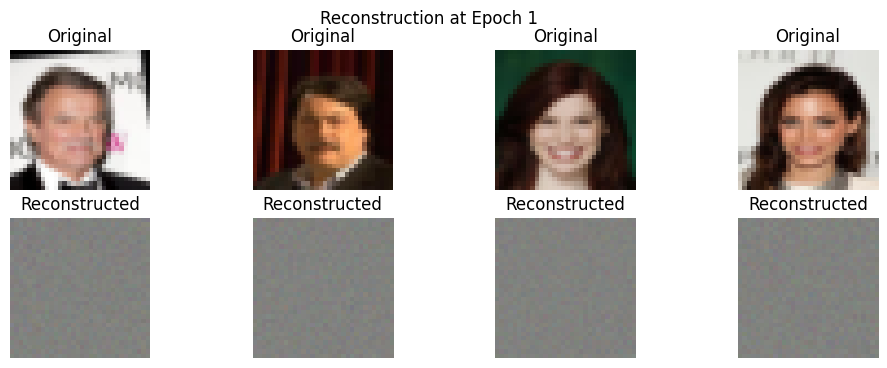

Epoch: 1/50, Avg Loss: 0.2274101712281191, Avg Reconstruction Loss: 0.2272447059048882, Avg KL Loss: 3309.3080251186707, Beta: 5.000000000000006e-08


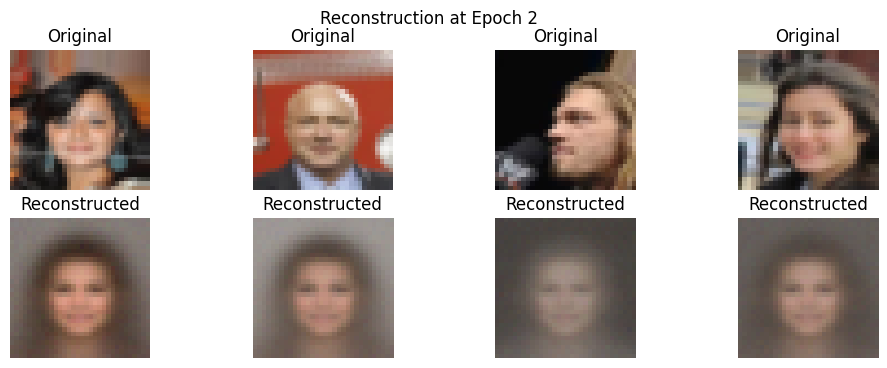

Epoch: 2/50, Avg Loss: 0.17114986007726646, Avg Reconstruction Loss: 0.1708155487534366, Avg KL Loss: 6086.458442011966, Beta: 5.492705709937796e-08


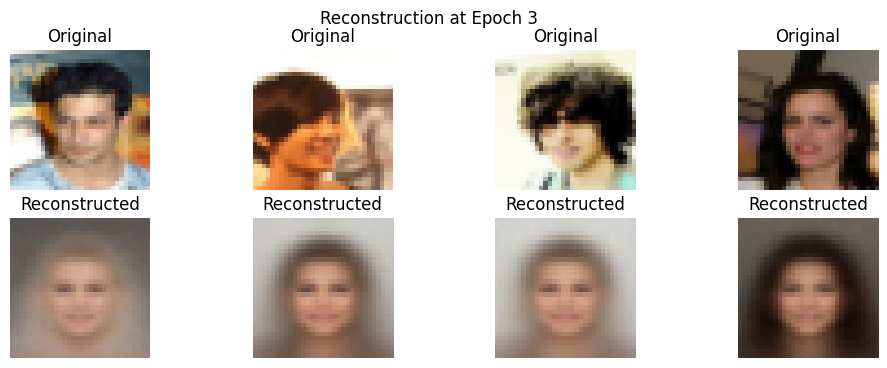

Epoch: 3/50, Avg Loss: 0.1664667203079296, Avg Reconstruction Loss: 0.16595699628697166, Avg KL Loss: 8447.583857669106, Beta: 6.033963203196648e-08


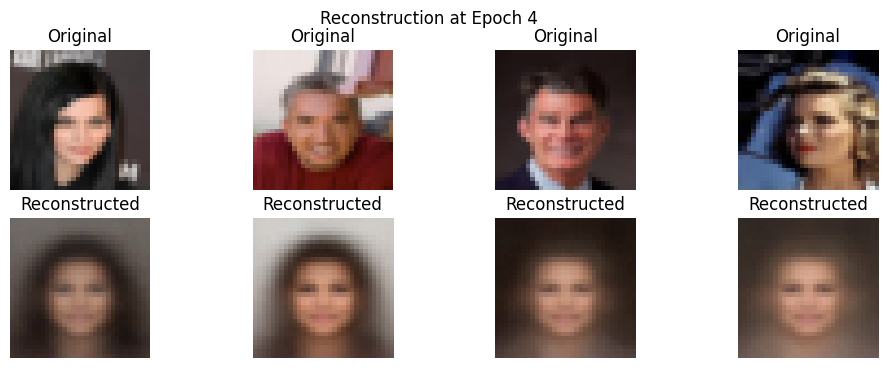

Epoch: 4/50, Avg Loss: 0.16541313578056382, Avg Reconstruction Loss: 0.16476528346538544, Avg KL Loss: 9773.652224770076, Beta: 6.628556827950549e-08


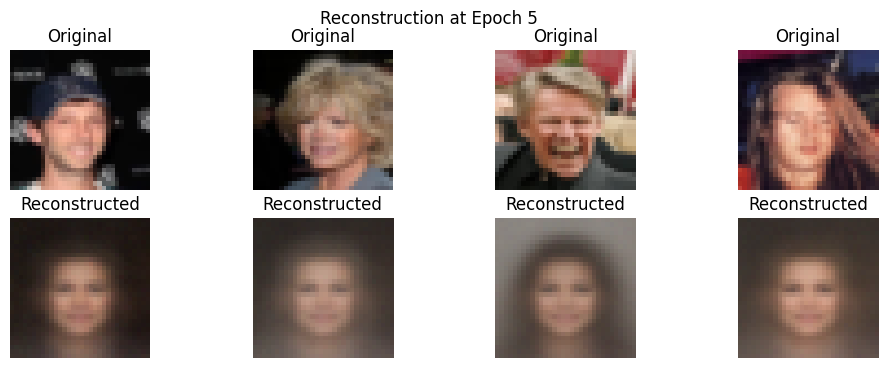

Epoch: 5/50, Avg Loss: 0.15933078489726102, Avg Reconstruction Loss: 0.1586394889068, Avg KL Loss: 9493.555290125594, Beta: 7.281742387506222e-08


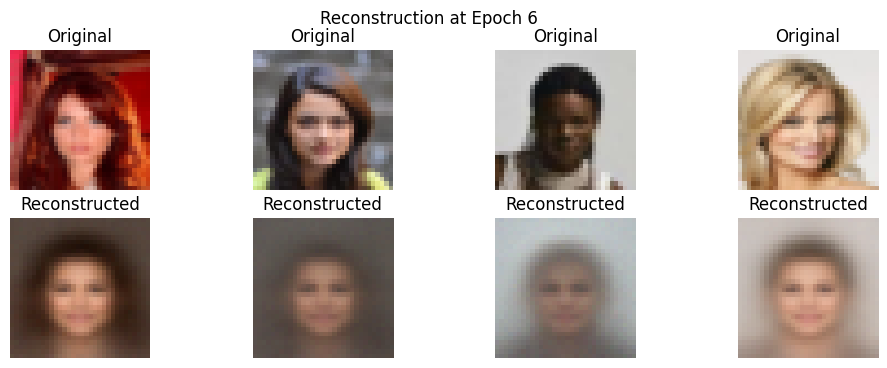

Epoch: 6/50, Avg Loss: 0.15567960976799833, Avg Reconstruction Loss: 0.15475394473045687, Avg KL Loss: 11571.831427079213, Beta: 7.999293598030292e-08


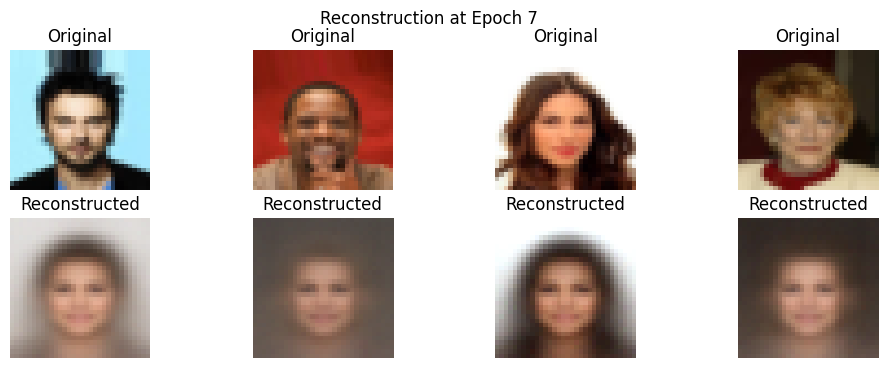

Epoch: 7/50, Avg Loss: 0.15036395795737642, Avg Reconstruction Loss: 0.14928591722929024, Avg KL Loss: 12267.813300410404, Beta: 8.787553124273961e-08


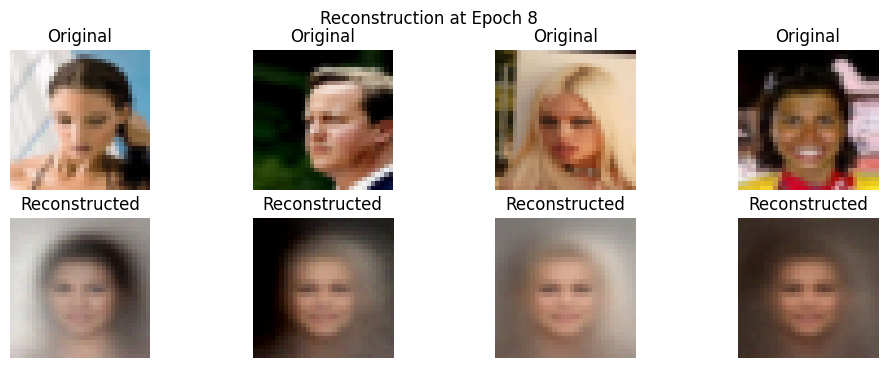

Epoch: 8/50, Avg Loss: 0.1372876277641405, Avg Reconstruction Loss: 0.13612539641842059, Avg KL Loss: 12039.49907597409, Beta: 9.65348864441625e-08


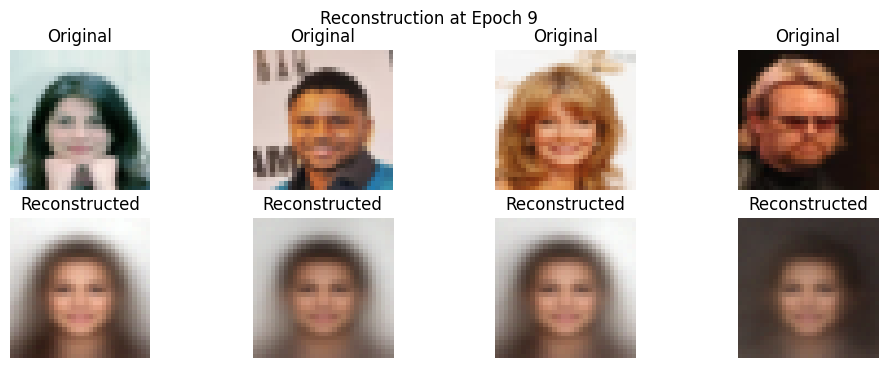

Epoch: 9/50, Avg Loss: 0.13281295731475082, Avg Reconstruction Loss: 0.13139059064508993, Avg KL Loss: 13412.53611272498, Beta: 1.060475443960095e-07


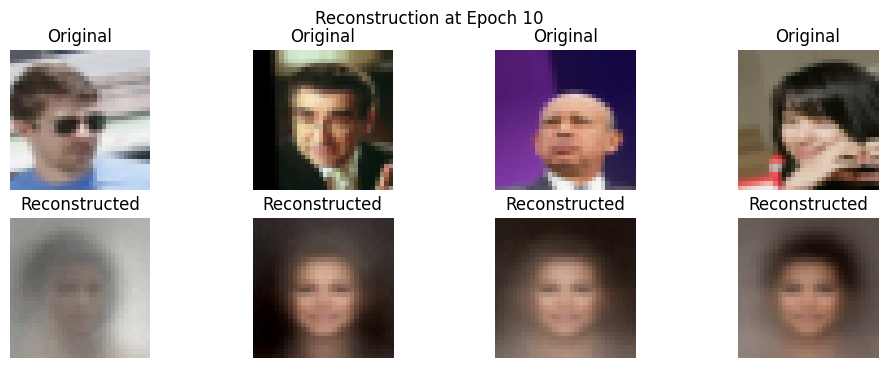

Epoch: 10/50, Avg Loss: 0.12696997755313222, Avg Reconstruction Loss: 0.1252834340439567, Avg KL Loss: 14477.066616396361, Beta: 1.1649759052576877e-07


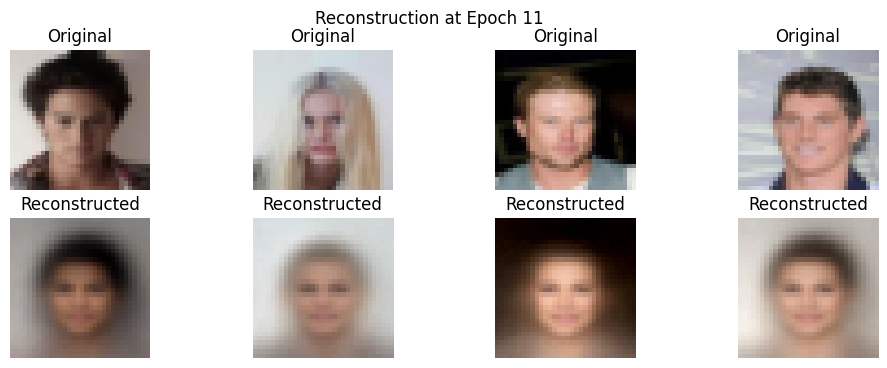

Epoch: 11/50, Avg Loss: 0.12429884245878534, Avg Reconstruction Loss: 0.12231665180076527, Avg KL Loss: 15488.597557357594, Beta: 1.279773961349769e-07


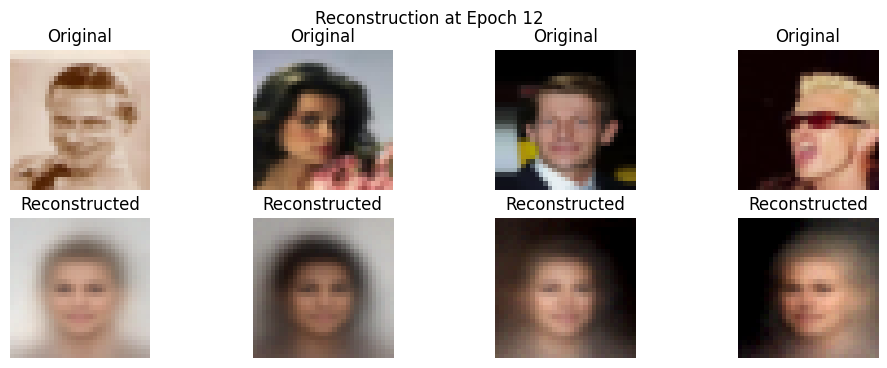

Epoch: 12/50, Avg Loss: 0.12116845716026765, Avg Reconstruction Loss: 0.11899699846023246, Avg KL Loss: 15445.501217612737, Beta: 1.4058843489871165e-07


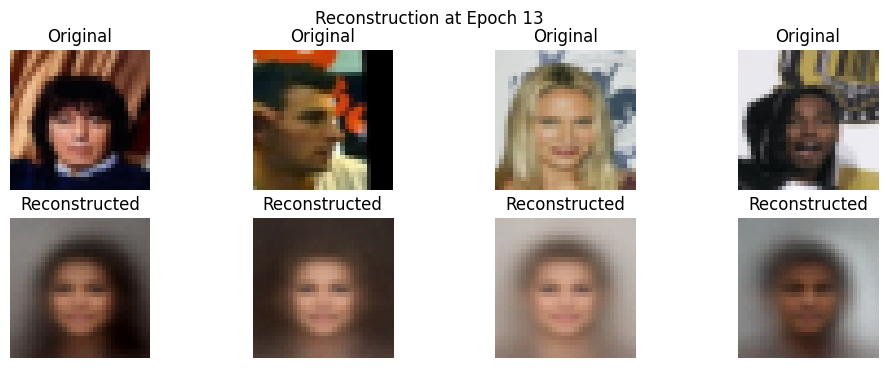

Epoch: 13/50, Avg Loss: 0.11353860597444486, Avg Reconstruction Loss: 0.11127636468485941, Avg KL Loss: 14647.818819842762, Beta: 1.5444217982387415e-07


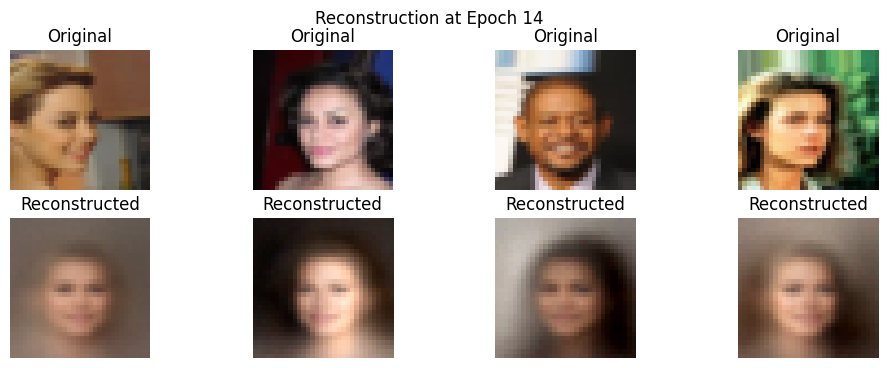

Epoch: 14/50, Avg Loss: 0.11034558430502686, Avg Reconstruction Loss: 0.10759437376562553, Avg KL Loss: 16215.918333415744, Beta: 1.6966108859476655e-07


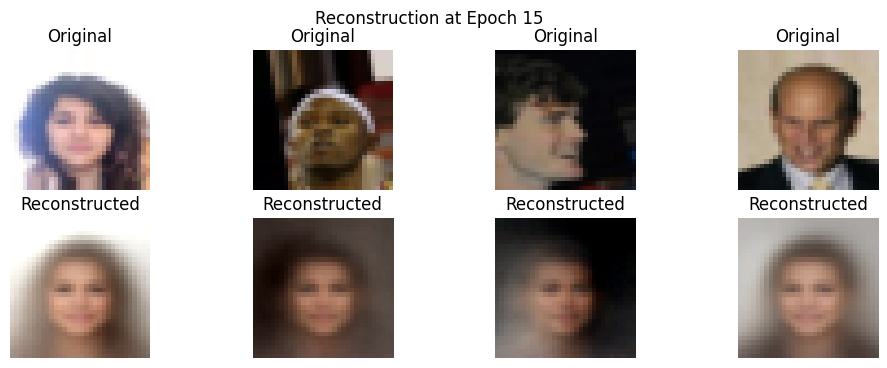

Epoch: 15/50, Avg Loss: 0.10950254403714892, Avg Reconstruction Loss: 0.106385406153866, Avg KL Loss: 16724.667860586433, Beta: 1.863796860157471e-07


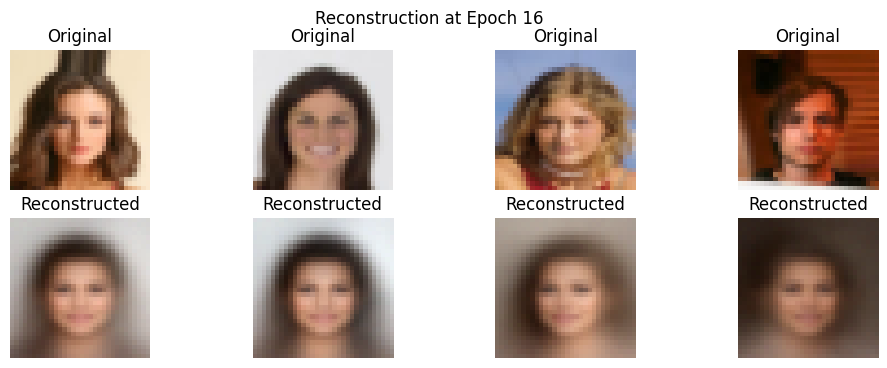

Epoch: 16/50, Avg Loss: 0.10820597994931136, Avg Reconstruction Loss: 0.10490831883647773, Avg KL Loss: 16106.127064378956, Beta: 2.0474575311902131e-07


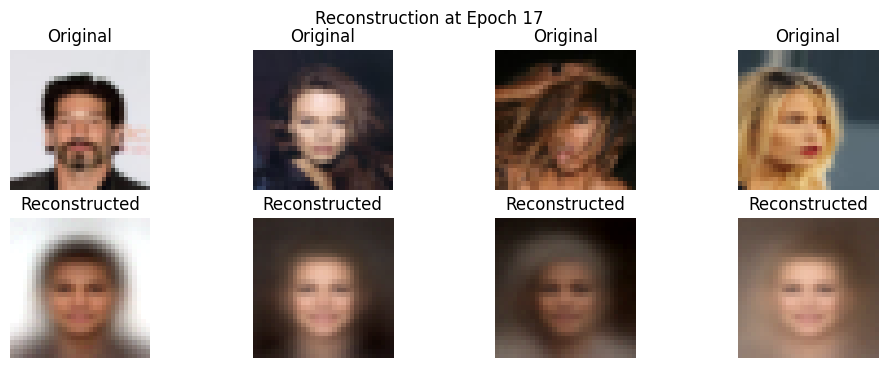

Epoch: 17/50, Avg Loss: 0.10570779772876185, Avg Reconstruction Loss: 0.10224043191233768, Avg KL Loss: 15415.88493868671, Beta: 2.249216334484723e-07


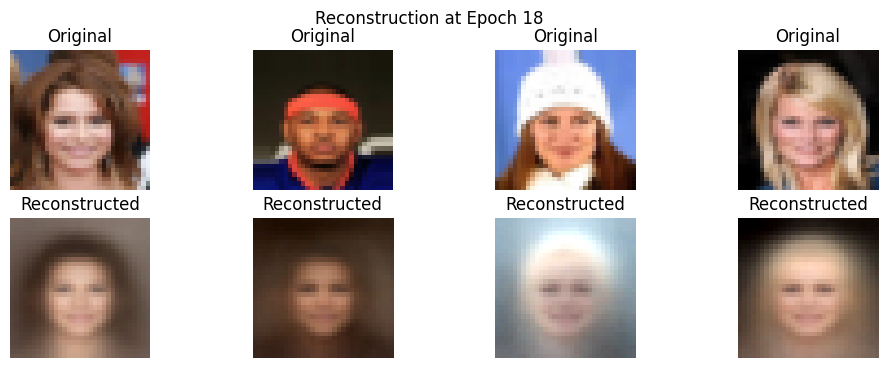

Epoch: 18/50, Avg Loss: 0.10445608585318432, Avg Reconstruction Loss: 0.1005357467109644, Avg KL Loss: 15866.315670737737, Beta: 2.470856680661917e-07


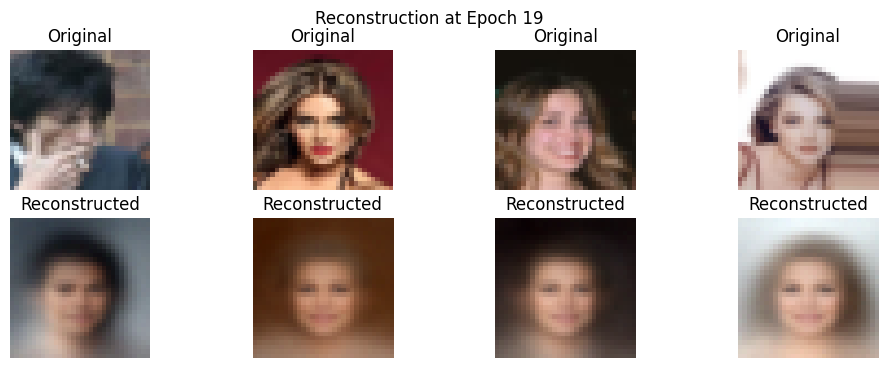

Epoch: 19/50, Avg Loss: 0.1040457023095481, Avg Reconstruction Loss: 0.09976014391153673, Avg KL Loss: 15788.595622774921, Beta: 2.7143377196619345e-07


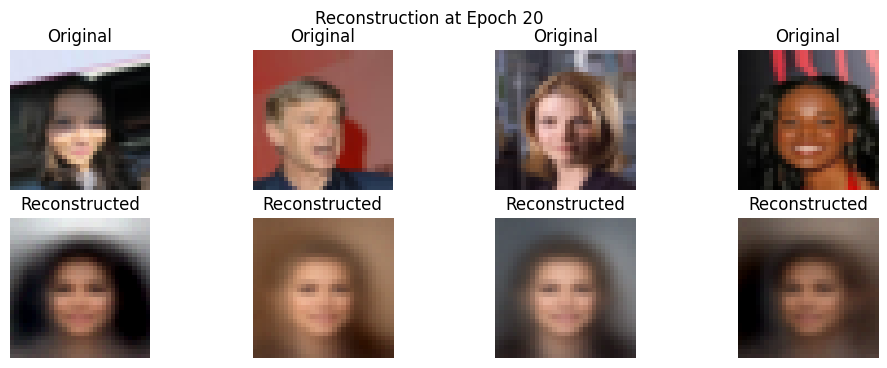

Epoch: 20/50, Avg Loss: 0.1018781650669967, Avg Reconstruction Loss: 0.0975106982867929, Avg KL Loss: 14647.024940973595, Beta: 2.9818116582973254e-07


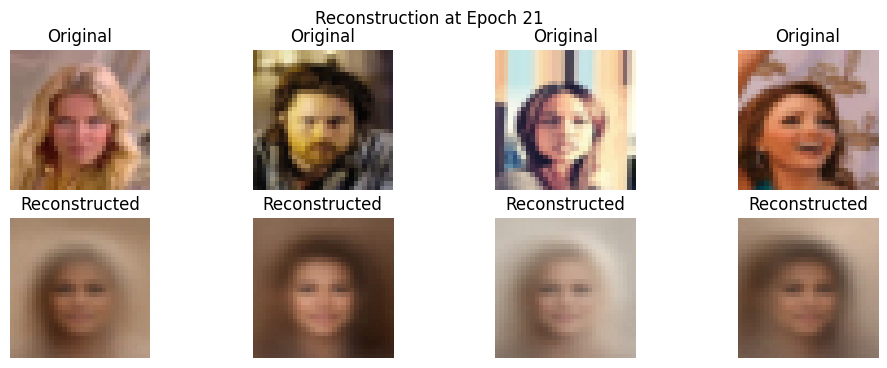

Epoch: 21/50, Avg Loss: 0.10113095944818062, Avg Reconstruction Loss: 0.09627153309462946, Avg KL Loss: 14835.032334726067, Beta: 3.275642784297758e-07


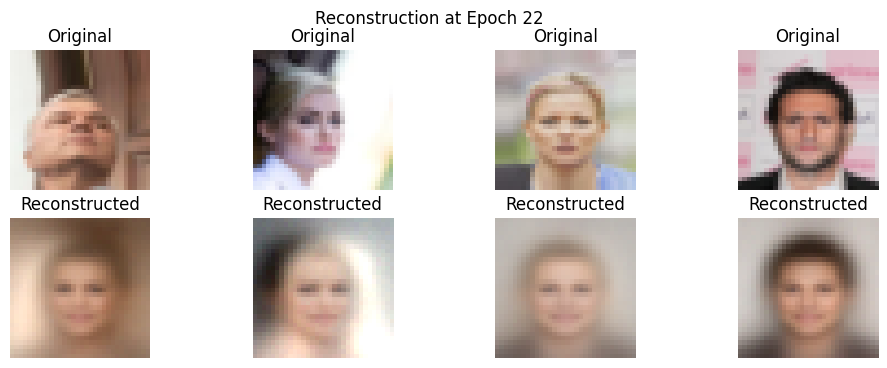

Epoch: 22/50, Avg Loss: 0.10157434548003764, Avg Reconstruction Loss: 0.09632367951960503, Avg KL Loss: 14591.55389636076, Beta: 3.598428365005764e-07


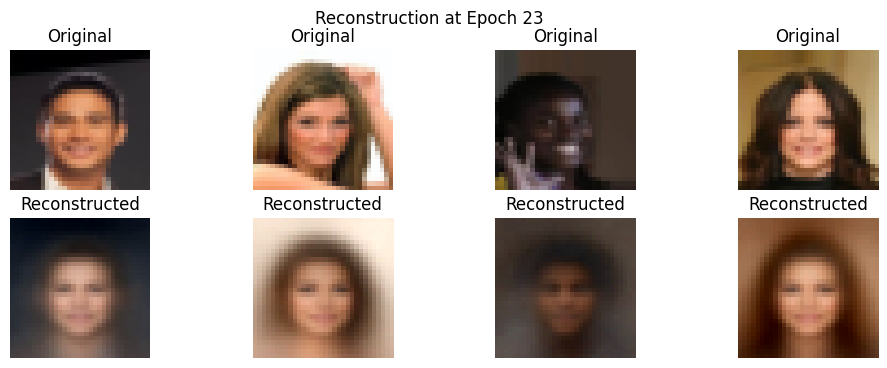

Epoch: 23/50, Avg Loss: 0.10156390778248824, Avg Reconstruction Loss: 0.09594341216585305, Avg KL Loss: 14218.225663197192, Beta: 3.953021605453853e-07


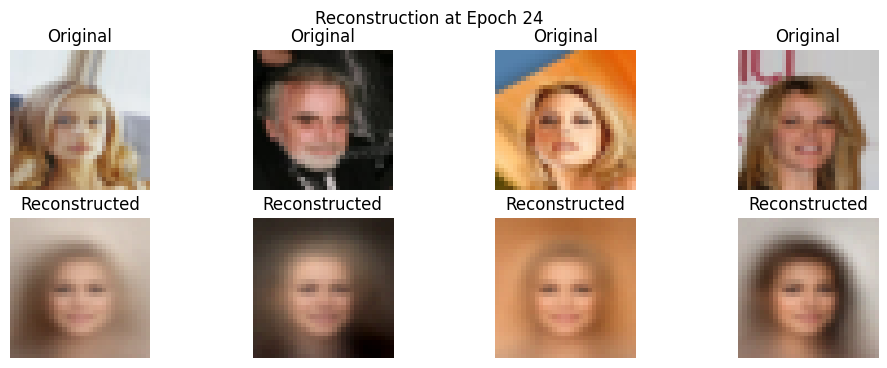

Epoch: 24/50, Avg Loss: 0.10150902114714248, Avg Reconstruction Loss: 0.09561550551200215, Avg KL Loss: 13571.533175311512, Beta: 4.342556868756766e-07


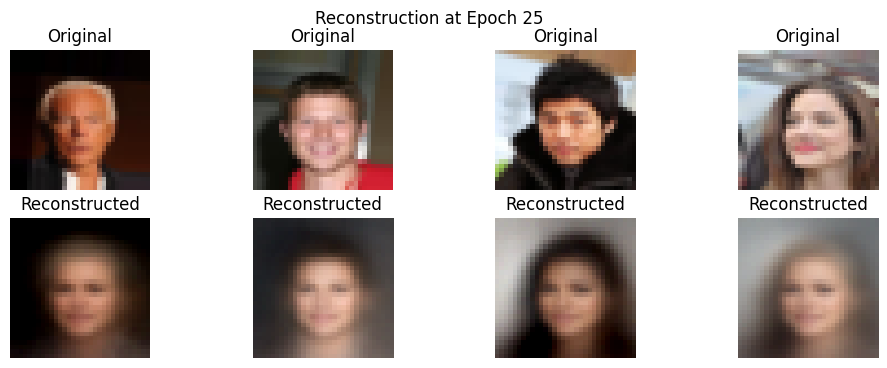

Epoch: 25/50, Avg Loss: 0.10182241557896891, Avg Reconstruction Loss: 0.09564996859695338, Avg KL Loss: 12938.844720381725, Beta: 4.770477381749972e-07


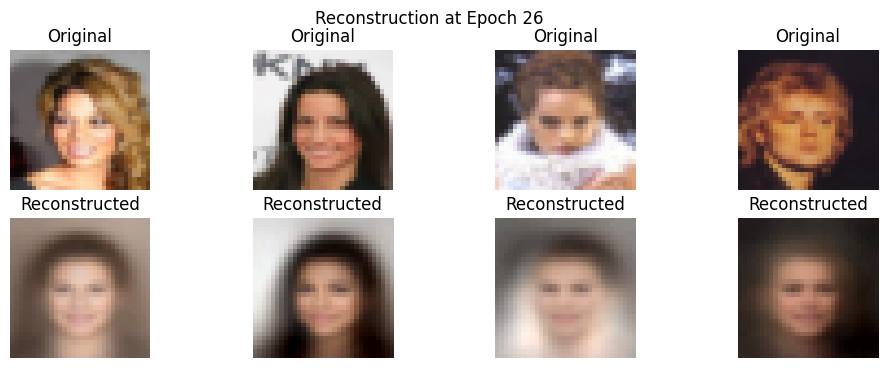

Epoch: 26/50, Avg Loss: 0.10114572781927977, Avg Reconstruction Loss: 0.0947123148207423, Avg KL Loss: 12276.180432283425, Beta: 5.240565670773431e-07


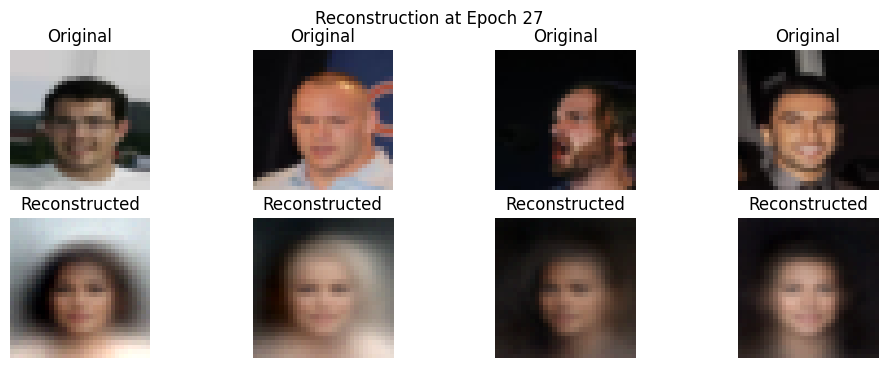

Epoch: 27/50, Avg Loss: 0.1001996603570407, Avg Reconstruction Loss: 0.09328174789117862, Avg KL Loss: 12016.571723261966, Beta: 5.756976996632237e-07


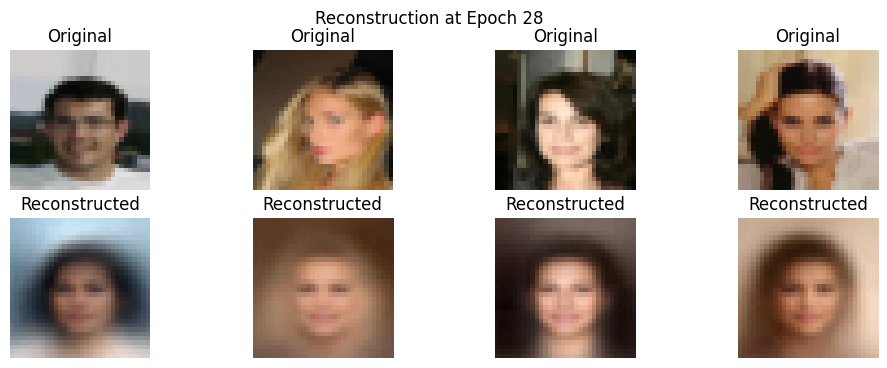

Epoch: 28/50, Avg Loss: 0.100263018208214, Avg Reconstruction Loss: 0.09299421791411654, Avg KL Loss: 11493.490157115308, Beta: 6.32427608427648e-07


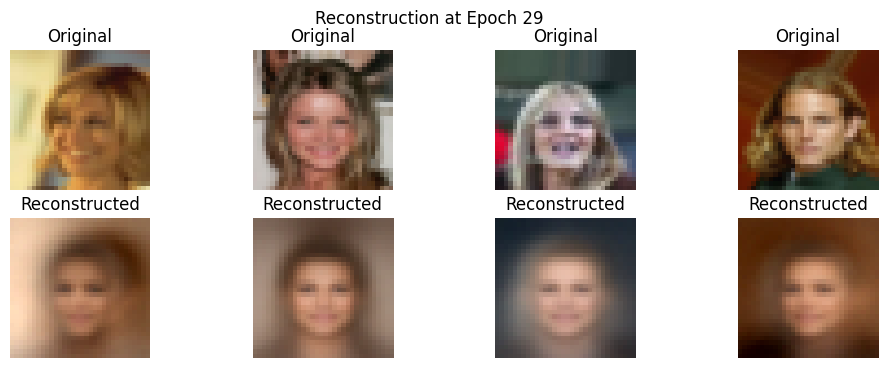

Epoch: 29/50, Avg Loss: 0.10114385857235027, Avg Reconstruction Loss: 0.09341597217547742, Avg KL Loss: 11123.297792845135, Beta: 6.947477471865687e-07


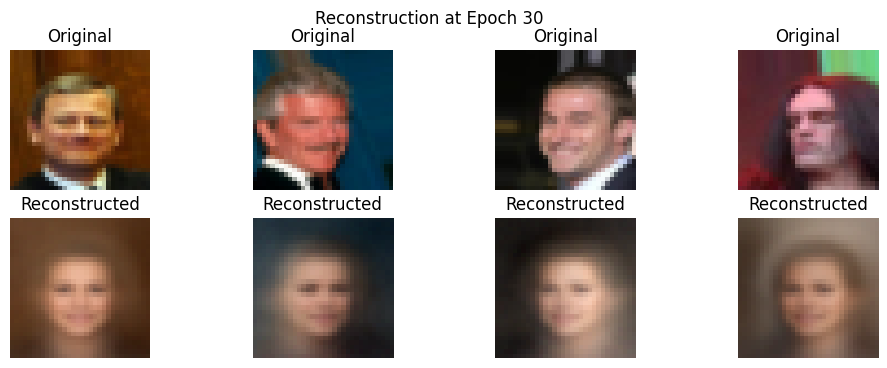

Epoch: 30/50, Avg Loss: 0.10067030212169961, Avg Reconstruction Loss: 0.09257968552882158, Avg KL Loss: 10600.78806584998, Beta: 7.632089835876164e-07


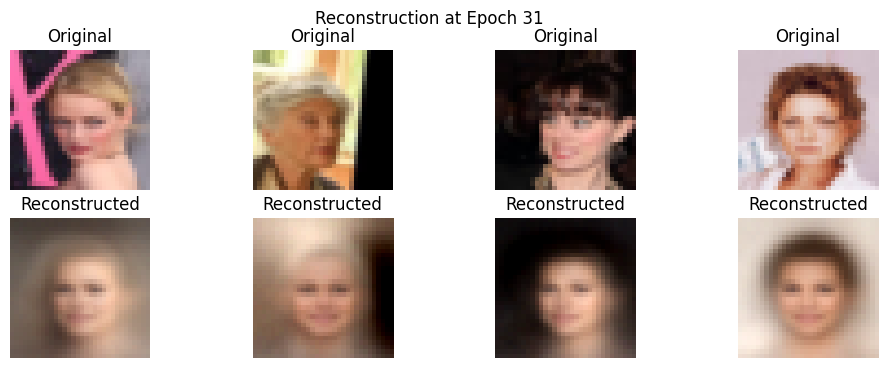

Epoch: 31/50, Avg Loss: 0.10145693998548048, Avg Reconstruction Loss: 0.09295064154305036, Avg KL Loss: 10145.672354010087, Beta: 8.384164684055036e-07


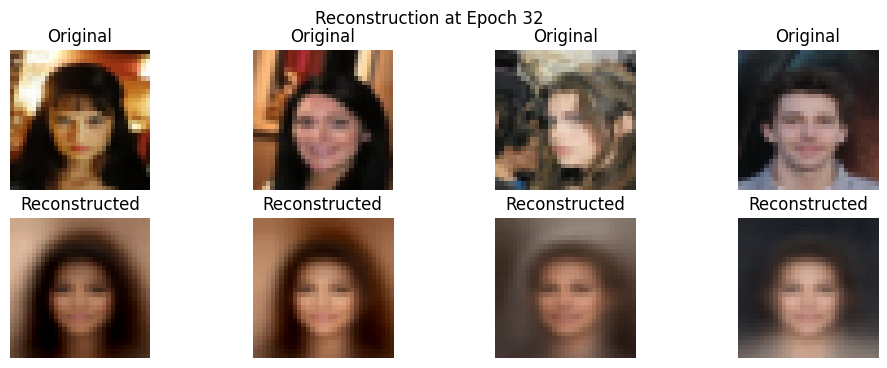

Epoch: 32/50, Avg Loss: 0.10173045542043975, Avg Reconstruction Loss: 0.09293954545938515, Avg KL Loss: 9544.59939150267, Beta: 9.210349846633574e-07


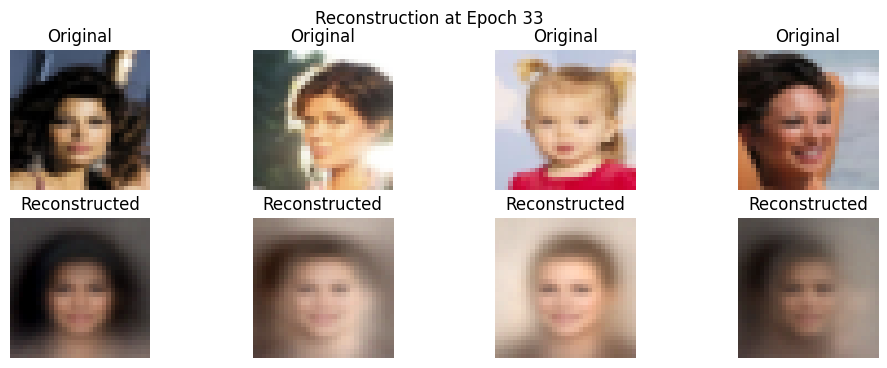

Epoch: 33/50, Avg Loss: 0.10134292186438283, Avg Reconstruction Loss: 0.09209374517579622, Avg KL Loss: 9141.356113095826, Beta: 1.0117948238625774e-06


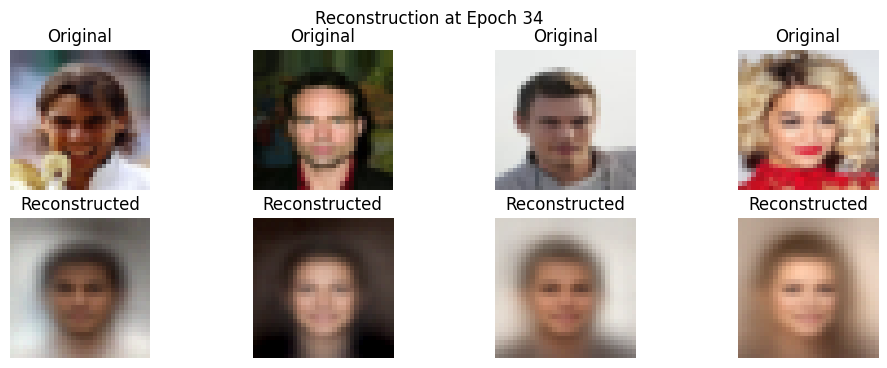

Epoch: 34/50, Avg Loss: 0.10074475388738173, Avg Reconstruction Loss: 0.09104541868348665, Avg KL Loss: 8726.361294130736, Beta: 1.1114982412630962e-06


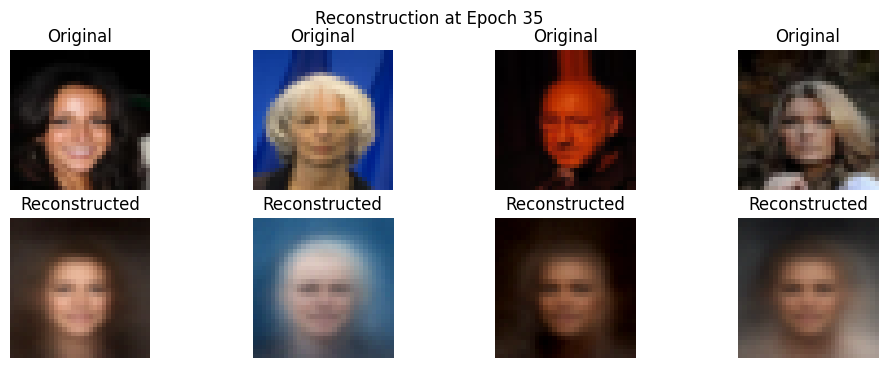

Epoch: 35/50, Avg Loss: 0.10126044723806502, Avg Reconstruction Loss: 0.09091418604307537, Avg KL Loss: 8473.412319521361, Beta: 1.2210265472743261e-06


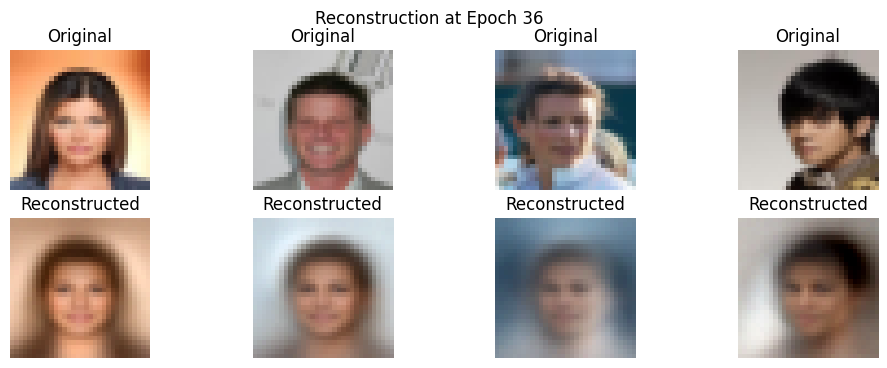

Epoch: 36/50, Avg Loss: 0.1017301759765118, Avg Reconstruction Loss: 0.09102917764383027, Avg KL Loss: 7977.7944614072385, Beta: 1.3413478976398633e-06


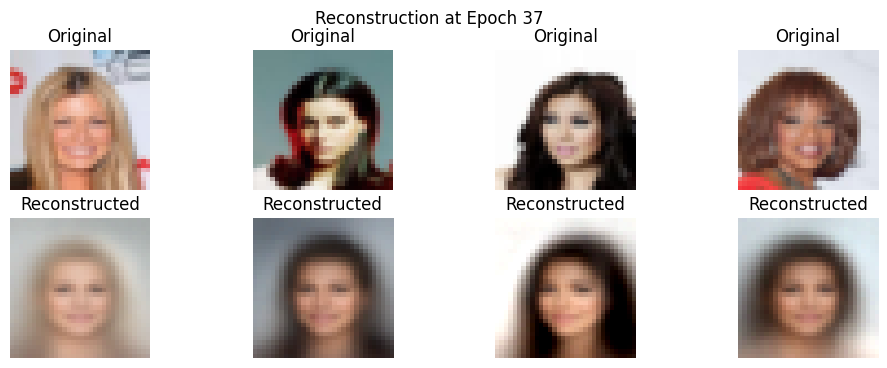

Epoch: 37/50, Avg Loss: 0.10144803201473213, Avg Reconstruction Loss: 0.0900460064788408, Avg KL Loss: 7737.920748553699, Beta: 1.4735258512759055e-06


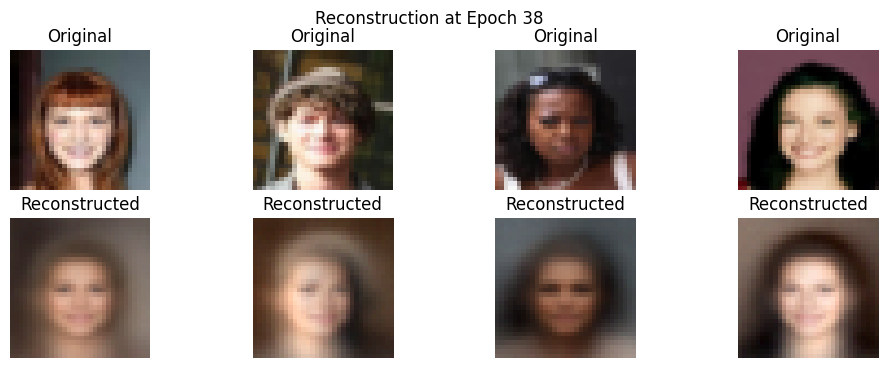

Epoch: 38/50, Avg Loss: 0.10154075524475001, Avg Reconstruction Loss: 0.08965122435666338, Avg KL Loss: 7344.980442481705, Beta: 1.6187287714088219e-06


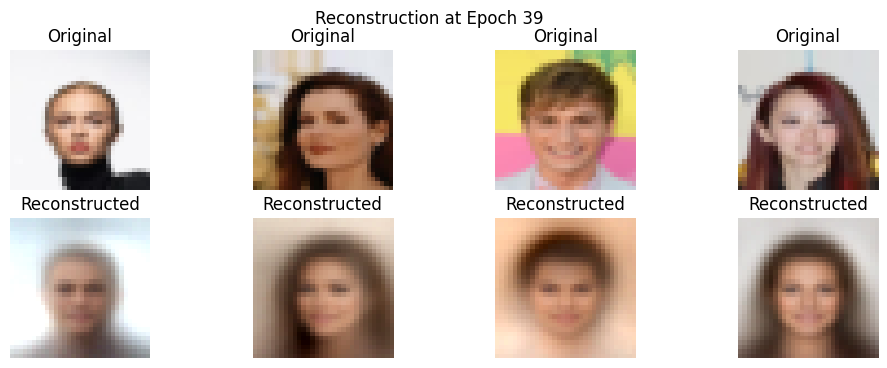

Epoch: 39/50, Avg Loss: 0.10165284262805045, Avg Reconstruction Loss: 0.08938171327868595, Avg KL Loss: 6900.715537542029, Beta: 1.7782401531115642e-06


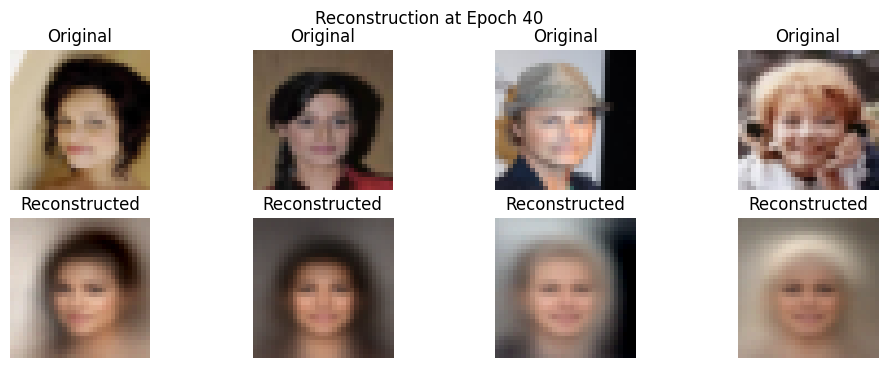

Epoch: 40/50, Avg Loss: 0.1025061663947528, Avg Reconstruction Loss: 0.08962240852887117, Avg KL Loss: 6595.318958910206, Beta: 1.953469968527308e-06


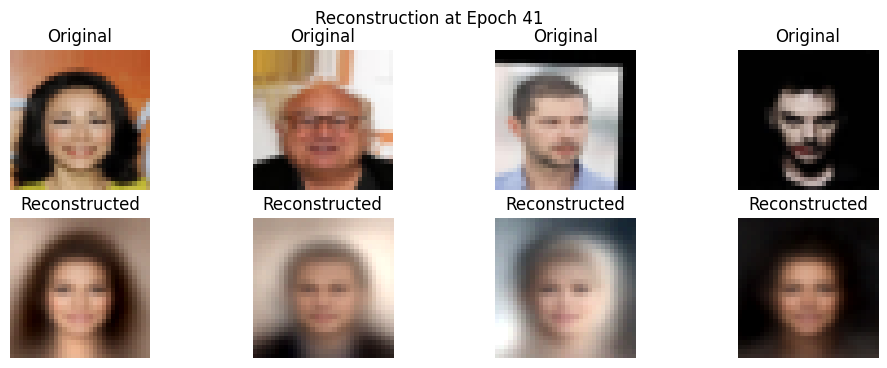

Epoch: 41/50, Avg Loss: 0.10267971738984313, Avg Reconstruction Loss: 0.08938245248945453, Avg KL Loss: 6196.397341184978, Beta: 2.145967130064388e-06


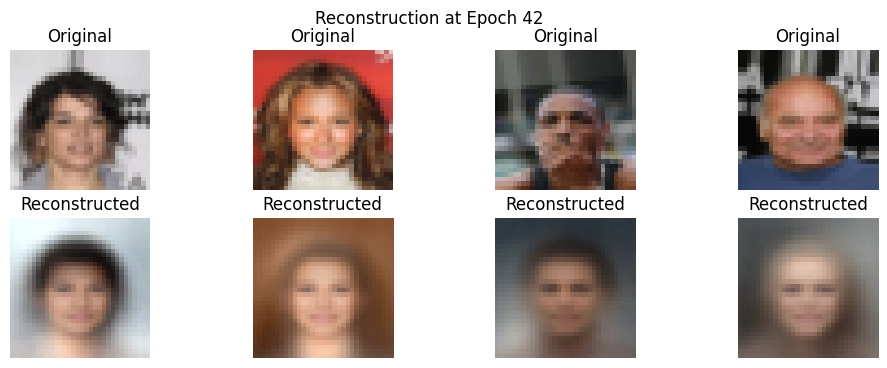

Epoch: 42/50, Avg Loss: 0.10311026710875426, Avg Reconstruction Loss: 0.08932786161386513, Avg KL Loss: 5846.360869202433, Beta: 2.3574331817286995e-06


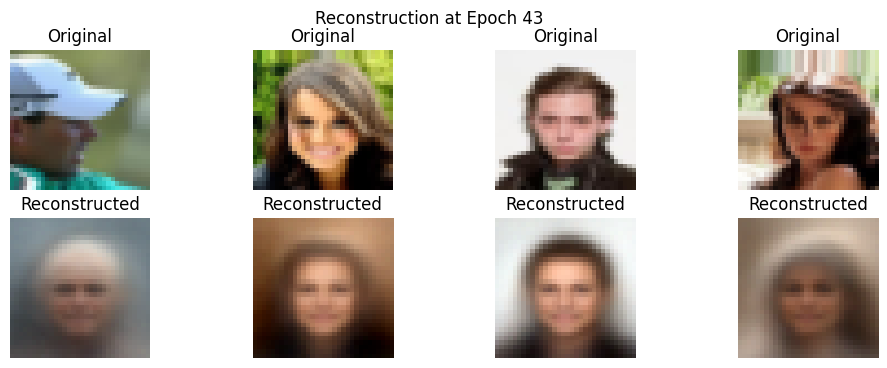

Epoch: 43/50, Avg Loss: 0.10357682406902313, Avg Reconstruction Loss: 0.08913102425351928, Avg KL Loss: 5578.09481927413, Beta: 2.589737339615603e-06


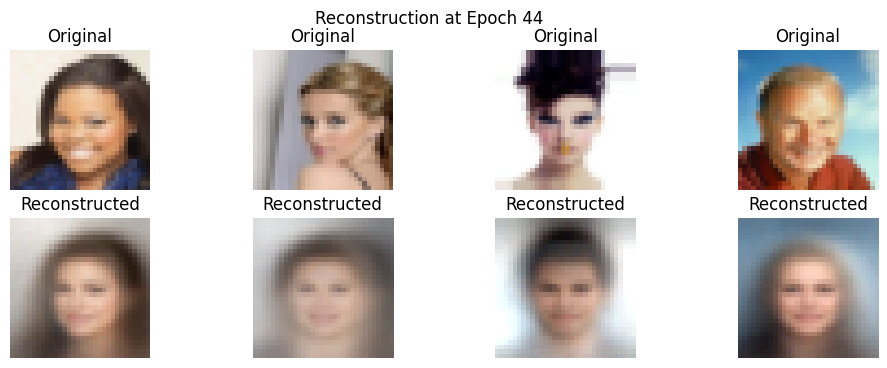

Epoch: 44/50, Avg Loss: 0.10491310512717766, Avg Reconstruction Loss: 0.09000068459706971, Avg KL Loss: 5241.747402529173, Beta: 2.8449330145091504e-06


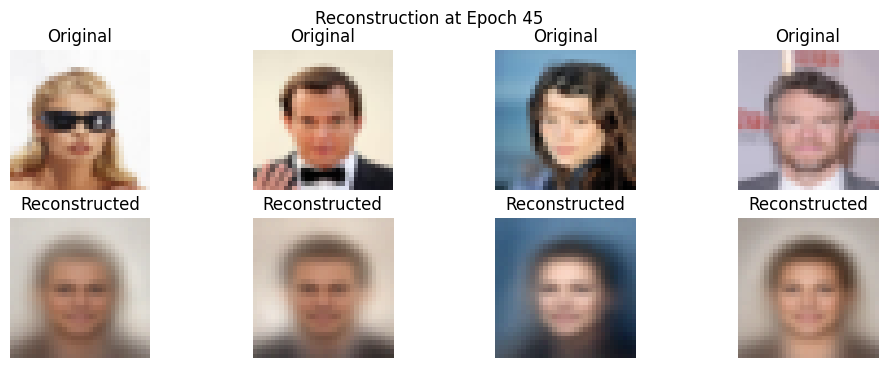

Epoch: 45/50, Avg Loss: 0.10543672844201704, Avg Reconstruction Loss: 0.0898341863781591, Avg KL Loss: 4992.37265130538, Beta: 3.1252759626369885e-06


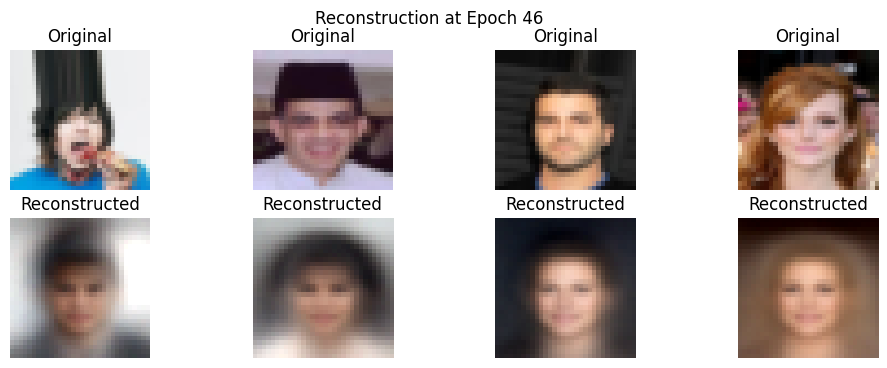

Epoch: 46/50, Avg Loss: 0.10511342549248587, Avg Reconstruction Loss: 0.08923739779599105, Avg KL Loss: 4624.205597310127, Beta: 3.433244225021502e-06


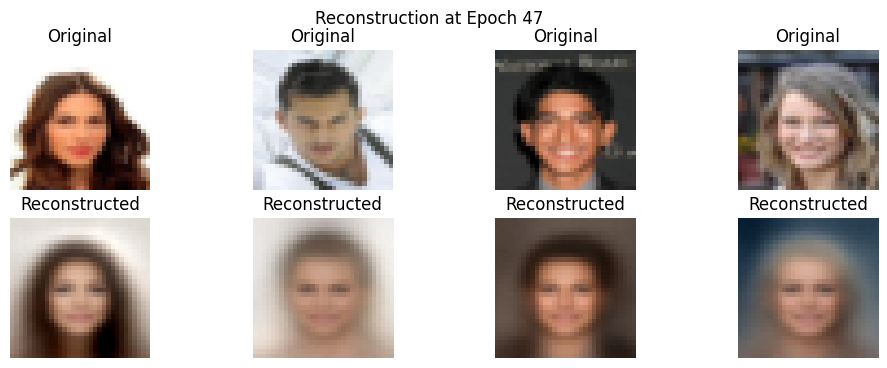

Epoch: 47/50, Avg Loss: 0.1065768726830241, Avg Reconstruction Loss: 0.08981620369455483, Avg KL Loss: 4443.96192410626, Beta: 3.7715600316773096e-06


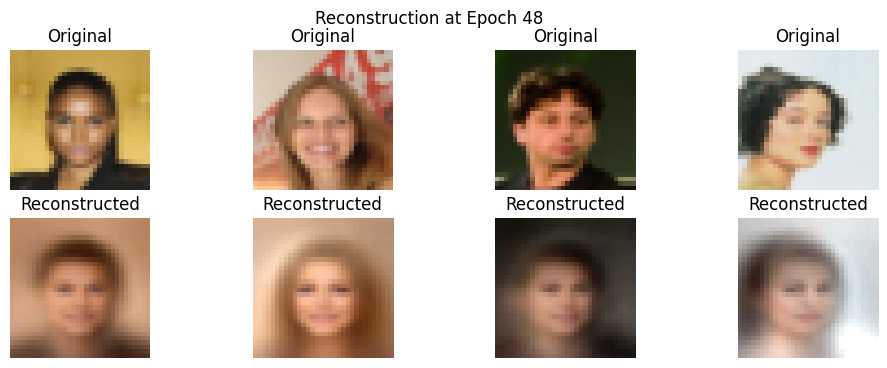

Epoch: 48/50, Avg Loss: 0.10733948185851303, Avg Reconstruction Loss: 0.08982311585281469, Avg KL Loss: 4227.72417363034, Beta: 4.143213864273422e-06


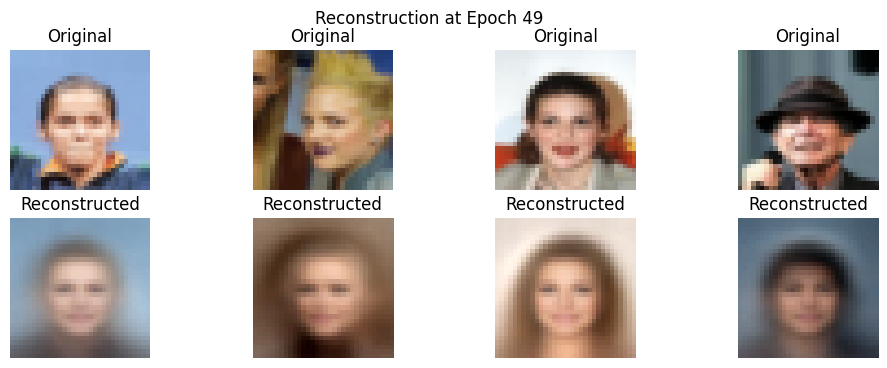

Epoch: 49/50, Avg Loss: 0.10891151560258262, Avg Reconstruction Loss: 0.09074912984159929, Avg KL Loss: 3990.4257572994957, Beta: 4.551490889957609e-06


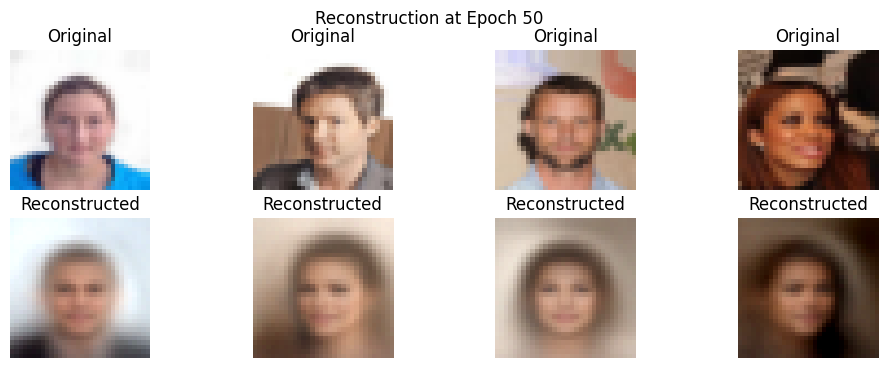

Epoch: 50/50, Avg Loss: 0.11039666595715511, Avg Reconstruction Loss: 0.09147284679774996, Avg KL Loss: 3784.7639789822733, Beta: 4.999999999999999e-06


In [ ]:
# Train PatchVAE with Patch Size 32
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
resume_training = False
checkpoint_path = 'best_vae_model.pth'
num_epochs = 50


vae = PatchVAE(patch_size=32, img_channels=3, img_size=32, embed_dim=1024, latent_dim=512).to(device)
optimizer = optim.Adam(vae.parameters(), lr=1e-4)

if resume_training:
    vae.load_state_dict(torch.load(checkpoint_path))

losses, recon_losses, kl_losses = train_patchvae(vae, dataloader, optimizer, device, epochs=num_epochs, checkpoint_path='best_vae_model.pth')

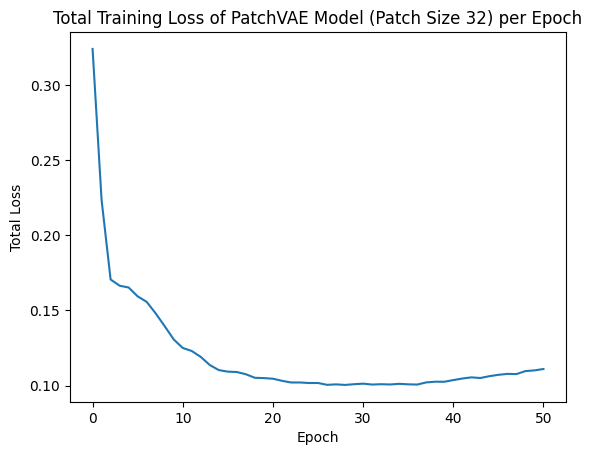

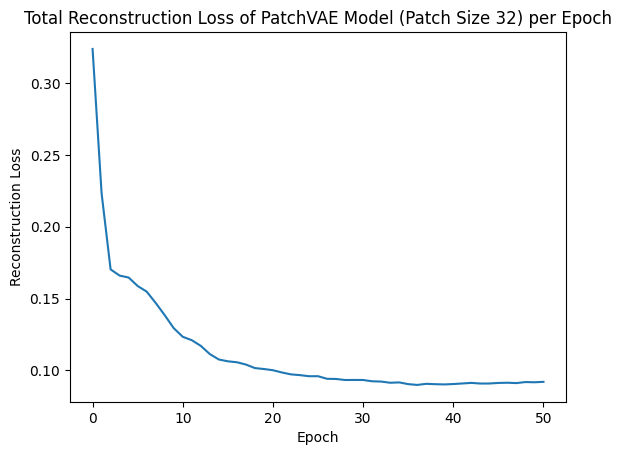

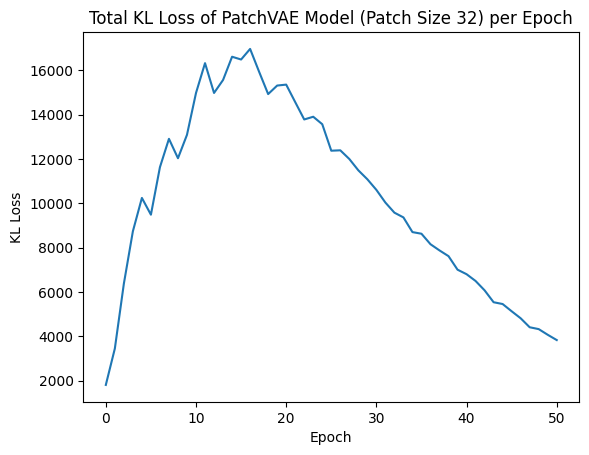

In [ ]:
# Plot Loss Curves for Patch Size 32

epoch = np.arange(0, num_epochs+1)
plt.plot(epoch, losses)
plt.xlabel('Epoch')
plt.ylabel('Total Loss')
plt.title('Total Training Loss of PatchVAE Model (Patch Size 32) per Epoch')
plt.savefig('total_loss.png')
plt.show()

plt.plot(epoch, recon_losses)
plt.xlabel('Epoch')
plt.ylabel('Reconstruction Loss')
plt.title('Total Reconstruction Loss of PatchVAE Model (Patch Size 32) per Epoch')
plt.savefig('recon_loss.png')
plt.show()

plt.plot(epoch, kl_losses)
plt.xlabel('Epoch')
plt.ylabel('KL Loss')
plt.title('Total KL Loss of PatchVAE Model (Patch Size 32) per Epoch')
plt.savefig('kl_loss.png')
plt.show()

Beginning of Training, Loss: 0.37135177850723267, Reconstruction Loss: 0.3668542802333832, KL Loss: 89950.2421875


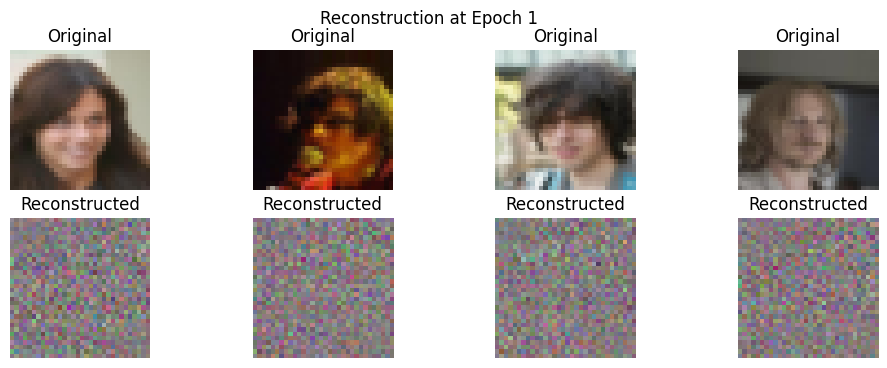

Epoch: 1/50, Avg Loss: 0.13431762602133088, Avg Reconstruction Loss: 0.13005228755594808, Avg KL Loss: 85306.77009988132, Beta: 5.000000000000006e-08


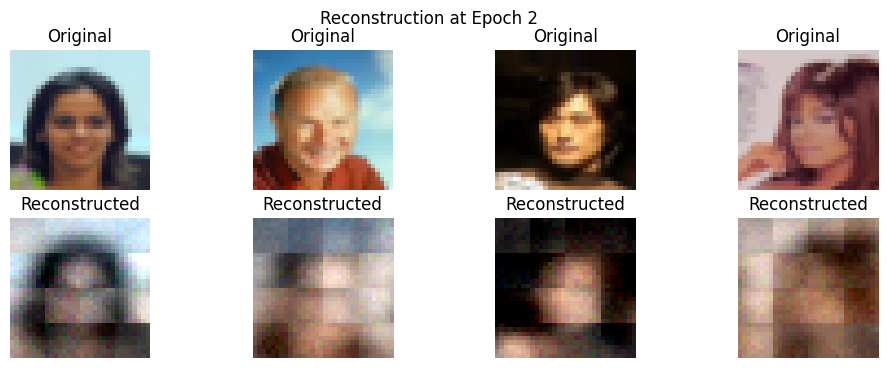

Epoch: 2/50, Avg Loss: 0.06810231912362424, Avg Reconstruction Loss: 0.0625806319751317, Avg KL Loss: 100527.63533425632, Beta: 5.492705709937796e-08


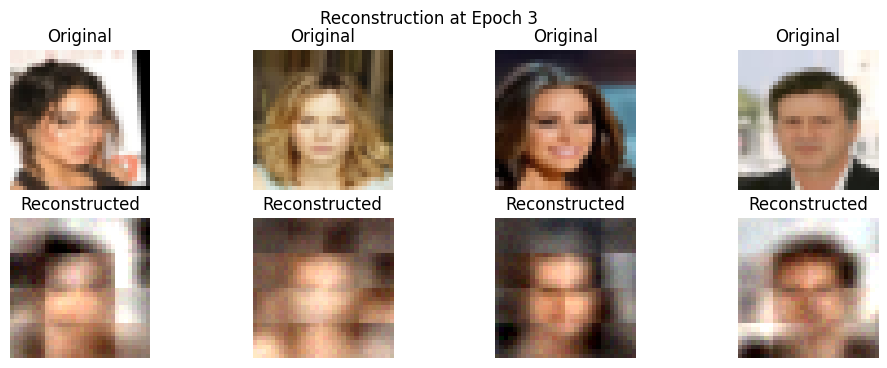

Epoch: 3/50, Avg Loss: 0.05862858226593537, Avg Reconstruction Loss: 0.05223259070440184, Avg KL Loss: 105999.84923852848, Beta: 6.033963203196648e-08


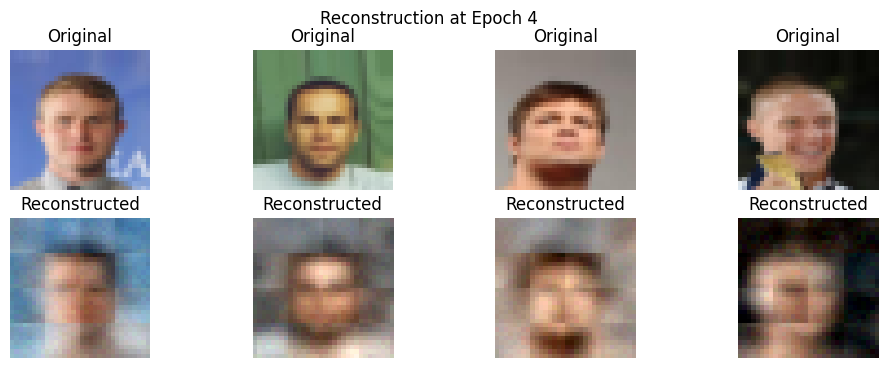

Epoch: 4/50, Avg Loss: 0.05258307346626173, Avg Reconstruction Loss: 0.045544453719748725, Avg KL Loss: 106186.31345183939, Beta: 6.628556827950549e-08


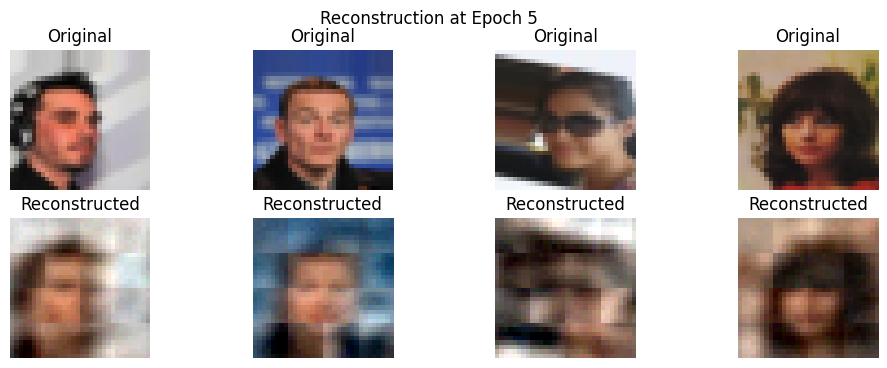

Epoch: 5/50, Avg Loss: 0.049597273899030084, Avg Reconstruction Loss: 0.04140519619553904, Avg KL Loss: 112501.61622329905, Beta: 7.281742387506222e-08


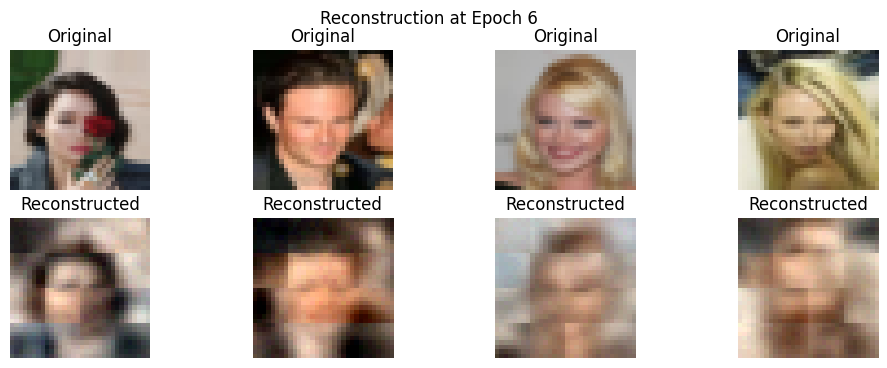

Epoch: 6/50, Avg Loss: 0.04797216858479041, Avg Reconstruction Loss: 0.03916079555697079, Avg KL Loss: 110151.88671875, Beta: 7.999293598030292e-08


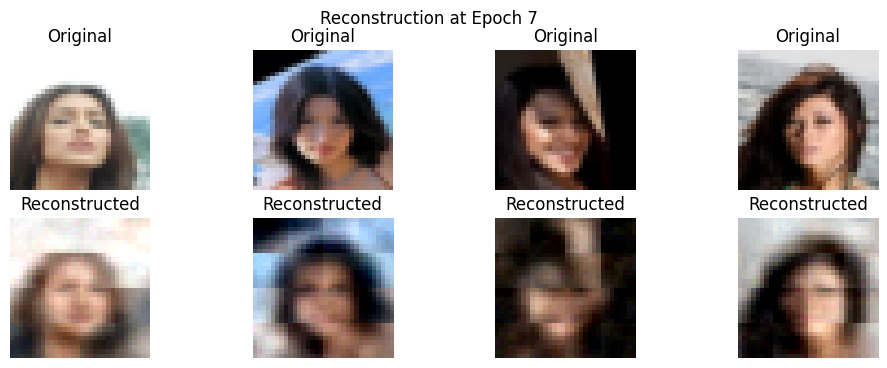

Epoch: 7/50, Avg Loss: 0.046992463260134565, Avg Reconstruction Loss: 0.037520065667885766, Avg KL Loss: 107793.34412084652, Beta: 8.787553124273961e-08


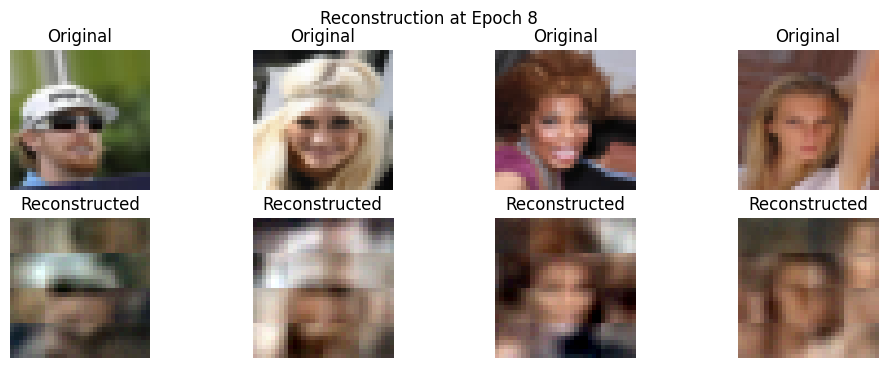

Epoch: 8/50, Avg Loss: 0.046162241951951496, Avg Reconstruction Loss: 0.036069776249837274, Avg KL Loss: 104547.34564131725, Beta: 9.65348864441625e-08


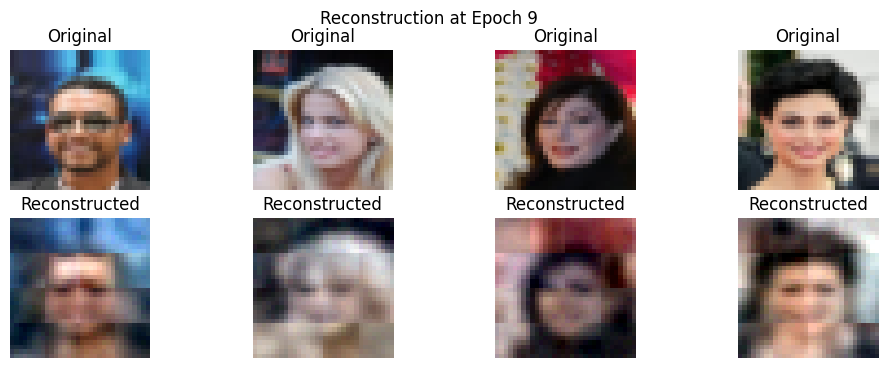

Epoch: 9/50, Avg Loss: 0.04659884885142121, Avg Reconstruction Loss: 0.03584887059051779, Avg KL Loss: 101369.42133109177, Beta: 1.060475443960095e-07


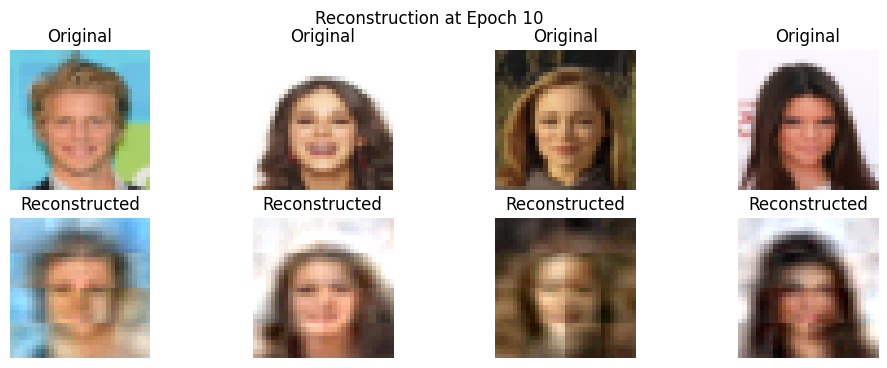

Epoch: 10/50, Avg Loss: 0.04630095134430294, Avg Reconstruction Loss: 0.03497906099957756, Avg KL Loss: 97185.62097013449, Beta: 1.1649759052576877e-07


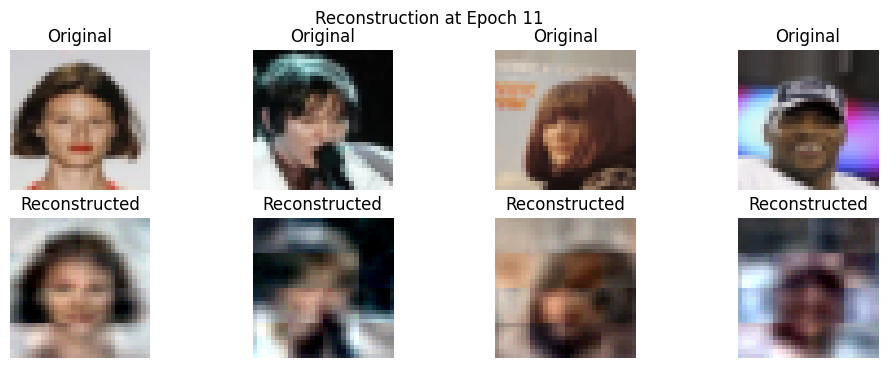

Epoch: 11/50, Avg Loss: 0.045710232203142555, Avg Reconstruction Loss: 0.03423092820787731, Avg KL Loss: 89697.9004400712, Beta: 1.279773961349769e-07


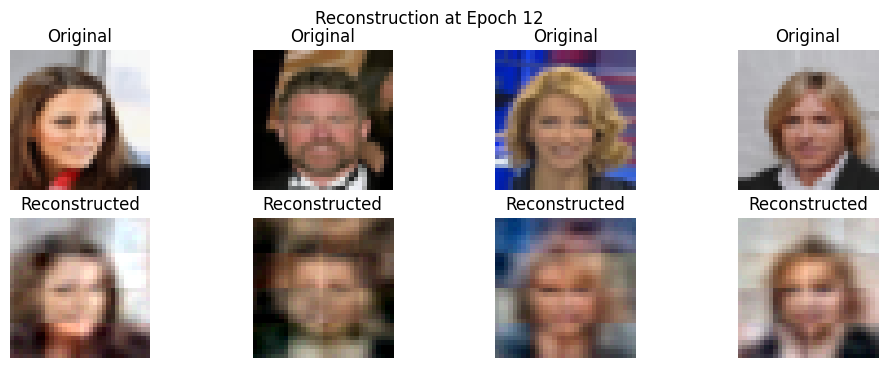

Epoch: 12/50, Avg Loss: 0.04662812406880946, Avg Reconstruction Loss: 0.03424014094509656, Avg KL Loss: 88115.2315442049, Beta: 1.4058843489871165e-07


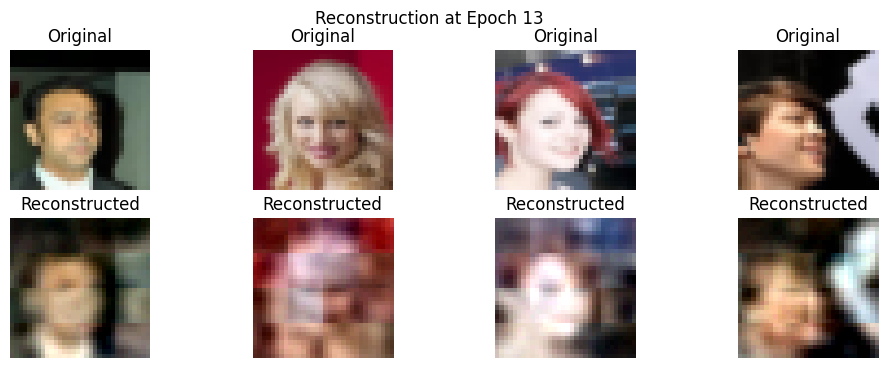

Epoch: 13/50, Avg Loss: 0.047323617706947686, Avg Reconstruction Loss: 0.034777391819825657, Avg KL Loss: 81235.74923358386, Beta: 1.5444217982387415e-07


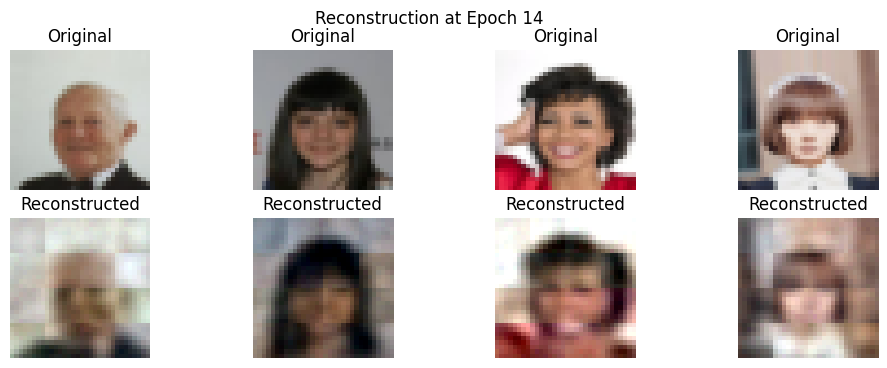

Epoch: 14/50, Avg Loss: 0.04781136444852322, Avg Reconstruction Loss: 0.034412044984630394, Avg KL Loss: 78976.97243374209, Beta: 1.6966108859476655e-07


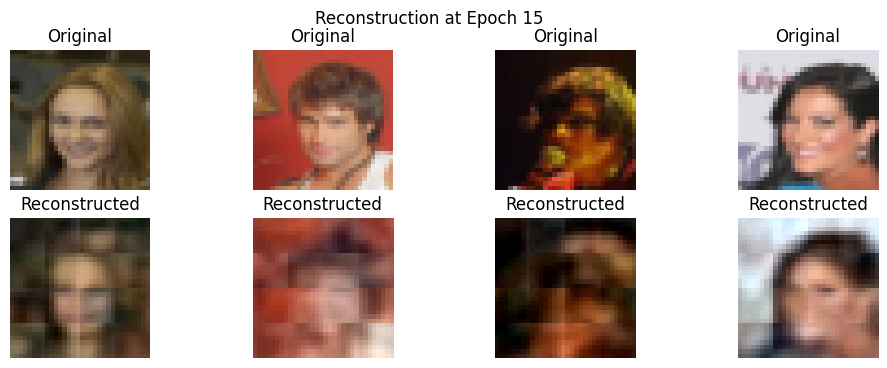

Epoch: 15/50, Avg Loss: 0.04818564785432212, Avg Reconstruction Loss: 0.03444178595761709, Avg KL Loss: 73741.20260581488, Beta: 1.863796860157471e-07


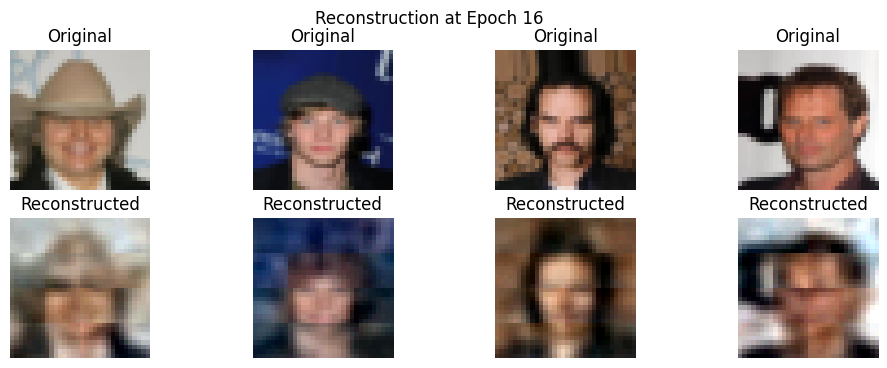

Epoch: 16/50, Avg Loss: 0.049365799968378456, Avg Reconstruction Loss: 0.03513547556498383, Avg KL Loss: 69502.41212173655, Beta: 2.0474575311902131e-07


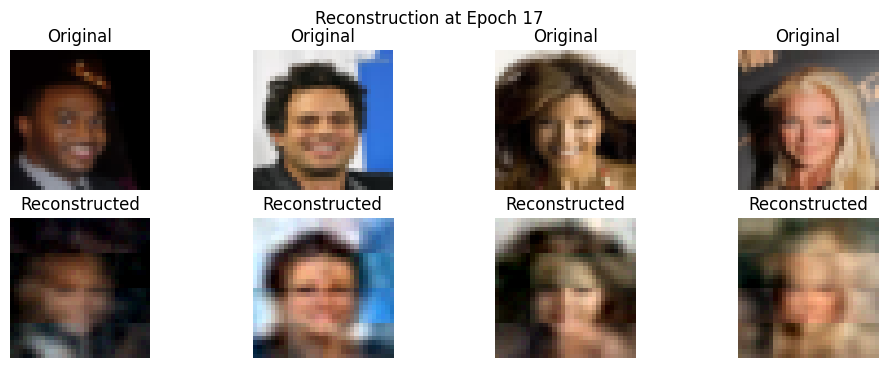

Epoch: 17/50, Avg Loss: 0.05015424761591079, Avg Reconstruction Loss: 0.035290419395211374, Avg KL Loss: 66084.47535724881, Beta: 2.249216334484723e-07


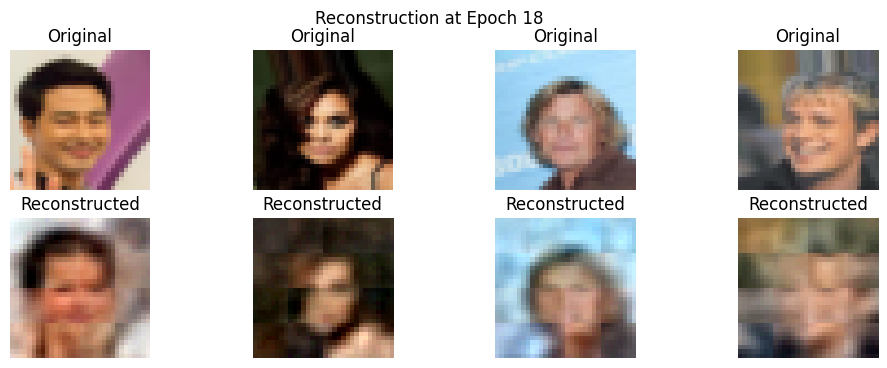

Epoch: 18/50, Avg Loss: 0.051140002010366586, Avg Reconstruction Loss: 0.03591964938501014, Avg KL Loss: 61599.495957772946, Beta: 2.470856680661917e-07


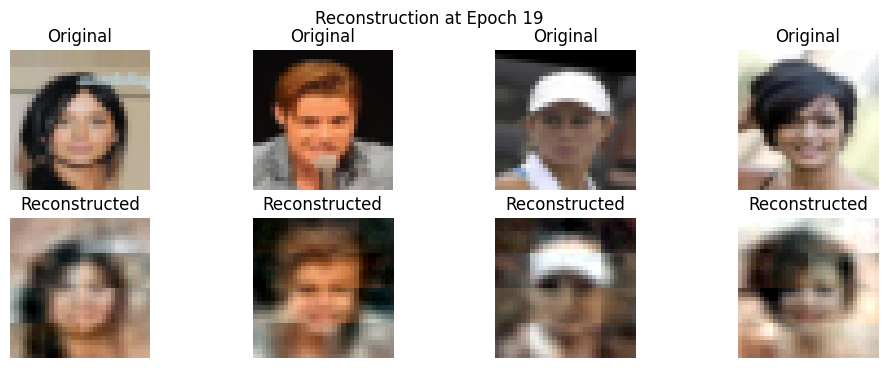

Epoch: 19/50, Avg Loss: 0.052044680601433864, Avg Reconstruction Loss: 0.03610355680501914, Avg KL Loss: 58729.33031299446, Beta: 2.7143377196619345e-07


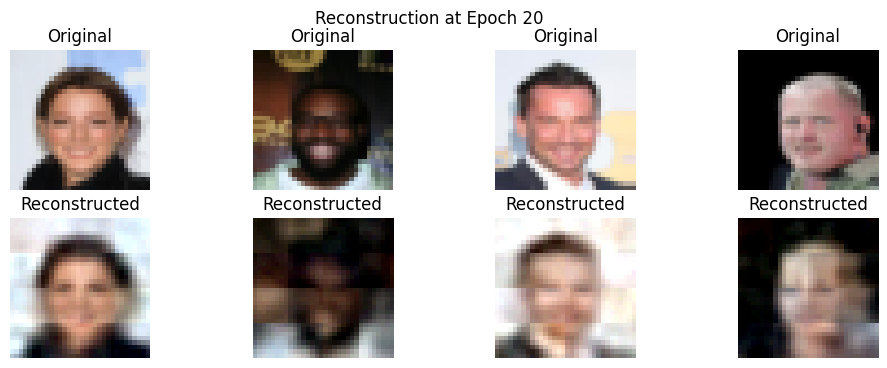

Epoch: 20/50, Avg Loss: 0.053014221636554865, Avg Reconstruction Loss: 0.03644387919125678, Avg KL Loss: 55571.391490308546, Beta: 2.9818116582973254e-07


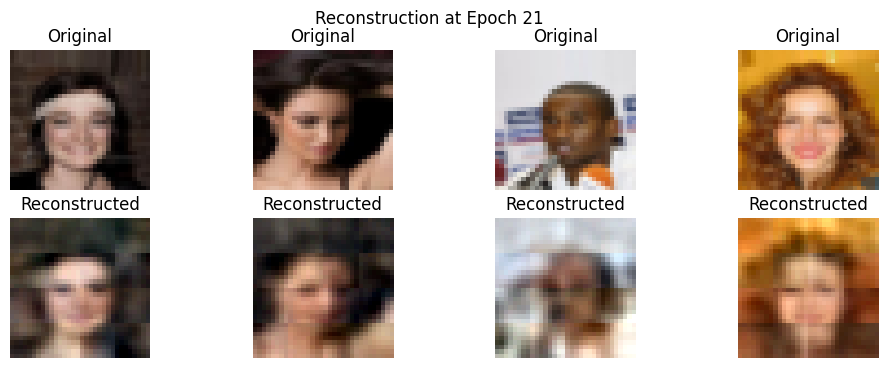

Epoch: 21/50, Avg Loss: 0.05546493474629861, Avg Reconstruction Loss: 0.03828183542701263, Avg KL Loss: 52457.18504005142, Beta: 3.275642784297758e-07


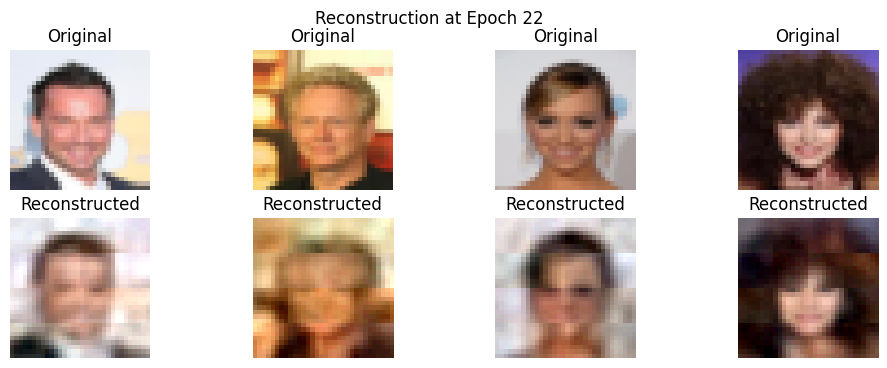

Epoch: 22/50, Avg Loss: 0.05611347595724878, Avg Reconstruction Loss: 0.03826684127502804, Avg KL Loss: 49595.63753461234, Beta: 3.598428365005764e-07


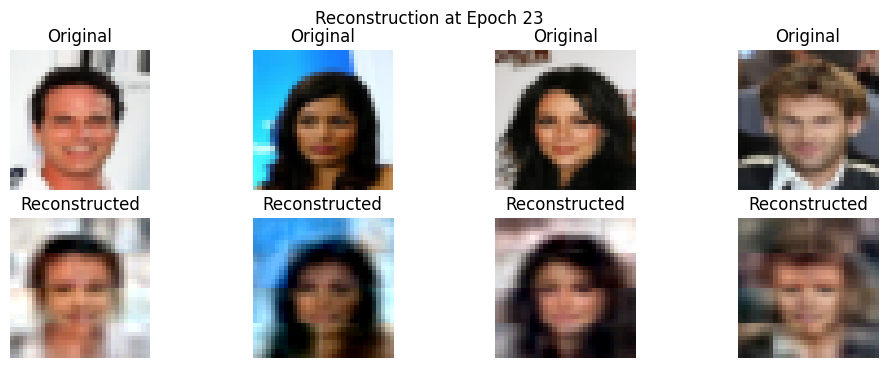

Epoch: 23/50, Avg Loss: 0.05777752729533594, Avg Reconstruction Loss: 0.03922705361737481, Avg KL Loss: 46927.32756873022, Beta: 3.953021605453853e-07


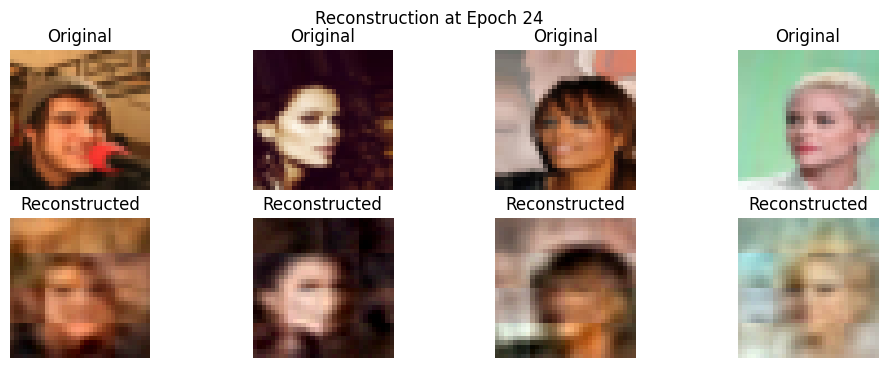

Epoch: 24/50, Avg Loss: 0.05836840431335606, Avg Reconstruction Loss: 0.03934907229452193, Avg KL Loss: 43797.54180676424, Beta: 4.342556868756766e-07


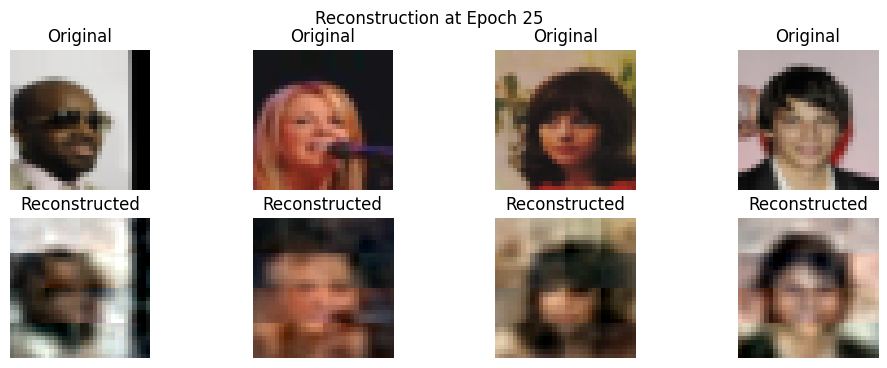

Epoch: 25/50, Avg Loss: 0.06025796284592604, Avg Reconstruction Loss: 0.04063955680290355, Avg KL Loss: 41124.61625420293, Beta: 4.770477381749972e-07


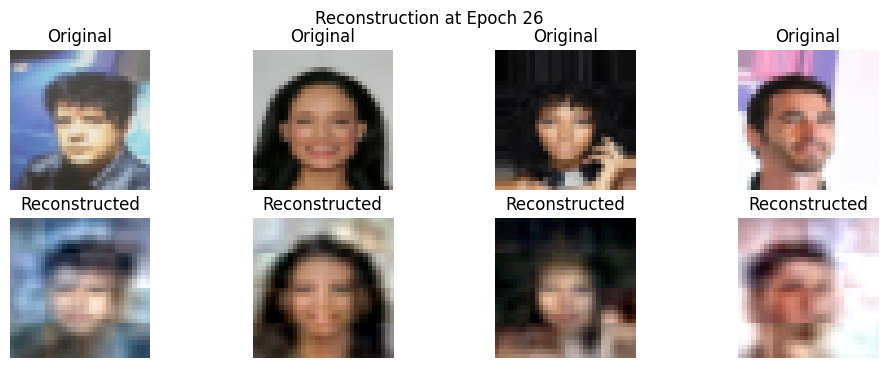

Epoch: 26/50, Avg Loss: 0.061427765773444234, Avg Reconstruction Loss: 0.04141559310351746, Avg KL Loss: 38187.044860067246, Beta: 5.240565670773431e-07


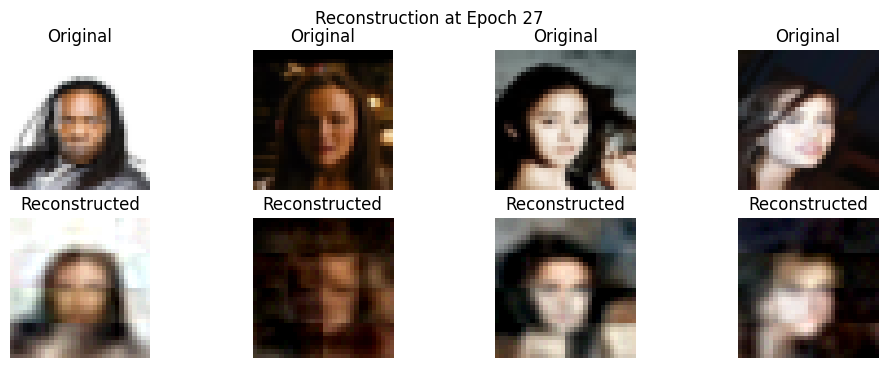

Epoch: 27/50, Avg Loss: 0.06351438617404503, Avg Reconstruction Loss: 0.042381298457142676, Avg KL Loss: 36708.65499530261, Beta: 5.756976996632237e-07


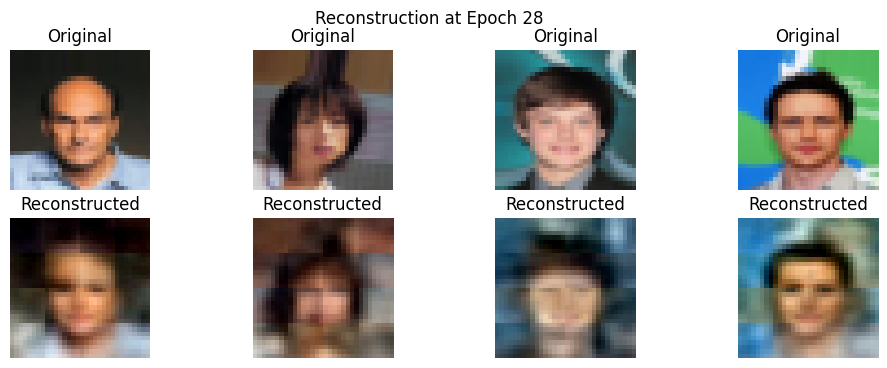

Epoch: 28/50, Avg Loss: 0.06518468109867241, Avg Reconstruction Loss: 0.043549127782447426, Avg KL Loss: 34210.32437945016, Beta: 6.32427608427648e-07


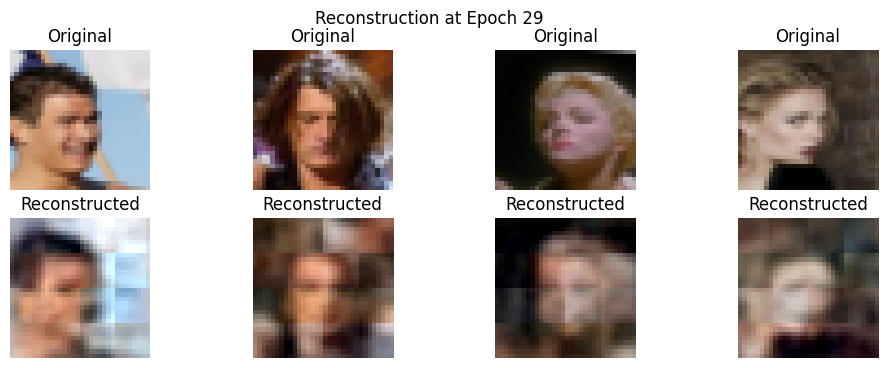

Epoch: 29/50, Avg Loss: 0.06727314066094688, Avg Reconstruction Loss: 0.04497241822979118, Avg KL Loss: 32099.01982174644, Beta: 6.947477471865687e-07


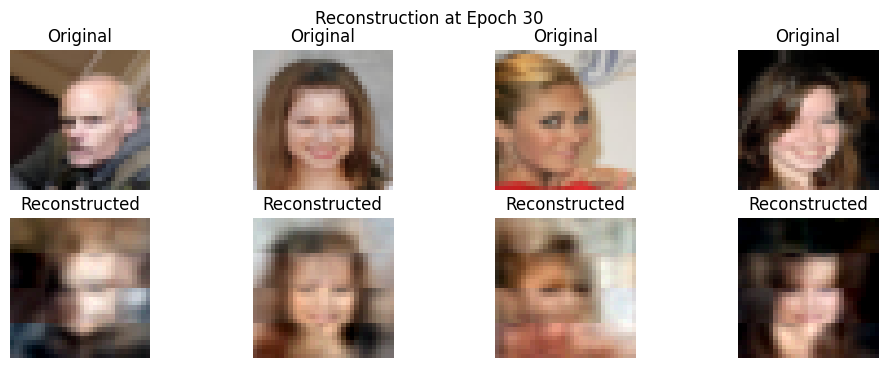

Epoch: 30/50, Avg Loss: 0.0689529870884328, Avg Reconstruction Loss: 0.04574130150147631, Avg KL Loss: 30413.277374653877, Beta: 7.632089835876164e-07


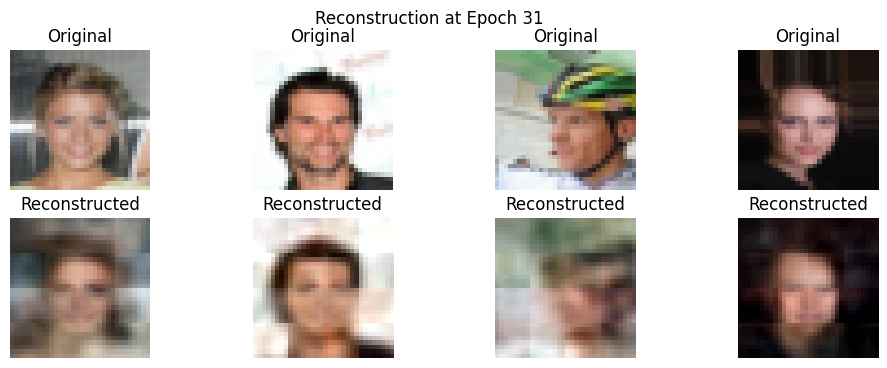

Epoch: 31/50, Avg Loss: 0.07067540651069412, Avg Reconstruction Loss: 0.04673900992809972, Avg KL Loss: 28549.531861896758, Beta: 8.384164684055036e-07


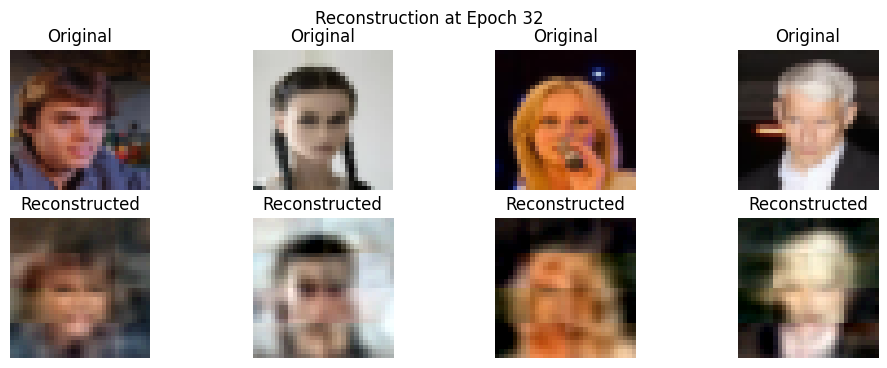

Epoch: 32/50, Avg Loss: 0.07318737999170641, Avg Reconstruction Loss: 0.04849354856753651, Avg KL Loss: 26810.959015278877, Beta: 9.210349846633574e-07


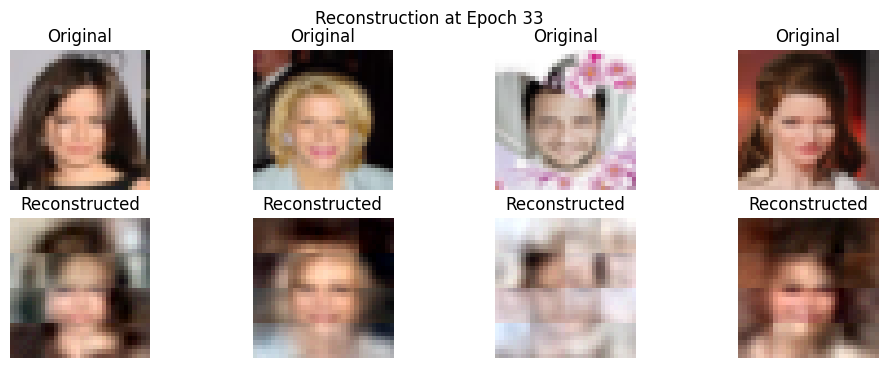

Epoch: 33/50, Avg Loss: 0.07501618979097921, Avg Reconstruction Loss: 0.049578678334438346, Avg KL Loss: 25140.978877200356, Beta: 1.0117948238625774e-06


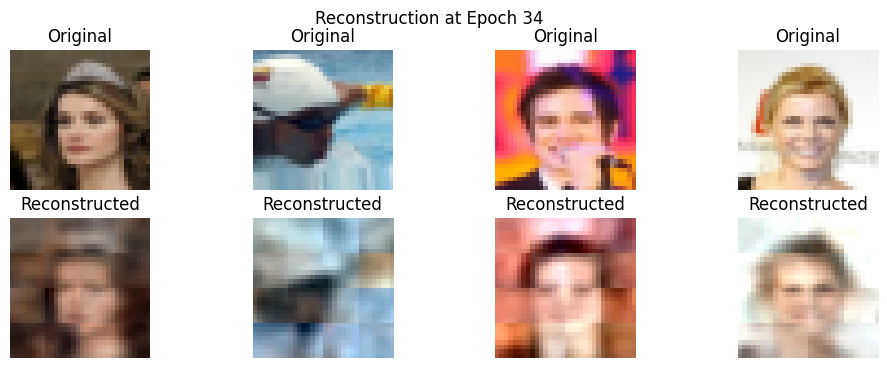

Epoch: 34/50, Avg Loss: 0.07676740566009208, Avg Reconstruction Loss: 0.05072439131857474, Avg KL Loss: 23430.54917424842, Beta: 1.1114982412630962e-06


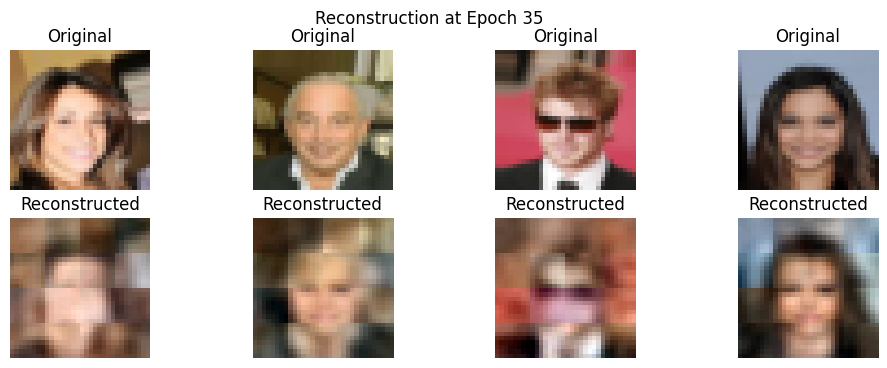

Epoch: 35/50, Avg Loss: 0.07958496494006508, Avg Reconstruction Loss: 0.05242816919956026, Avg KL Loss: 22240.954574391813, Beta: 1.2210265472743261e-06


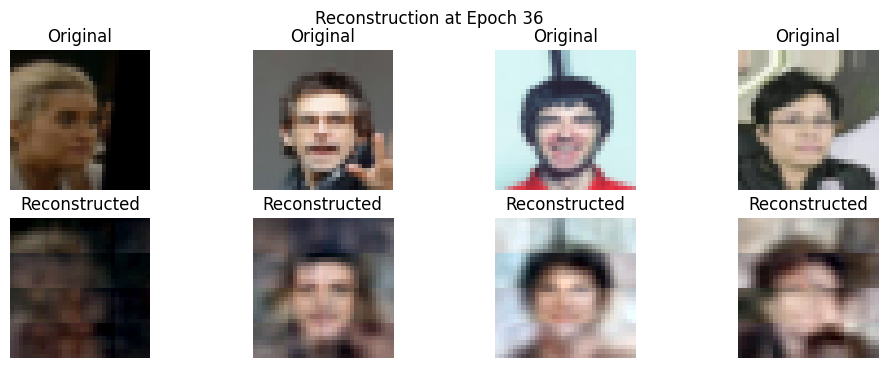

Epoch: 36/50, Avg Loss: 0.08161196268246143, Avg Reconstruction Loss: 0.05384791383071791, Avg KL Loss: 20698.618723422667, Beta: 1.3413478976398633e-06


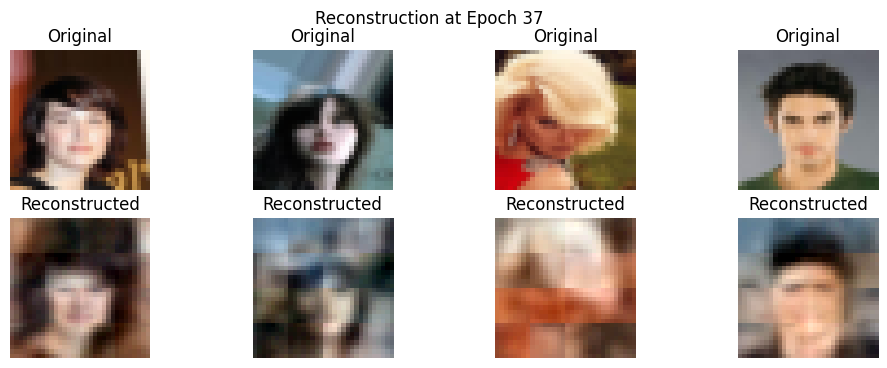

Epoch: 37/50, Avg Loss: 0.08385842793349978, Avg Reconstruction Loss: 0.055156998572093024, Avg KL Loss: 19478.063708341575, Beta: 1.4735258512759055e-06


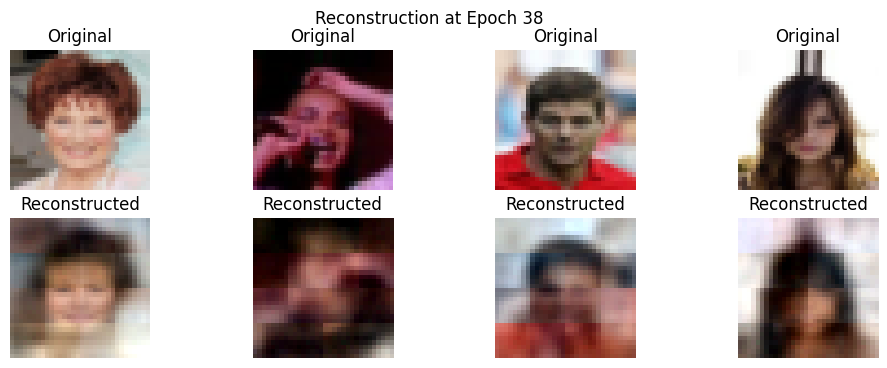

Epoch: 38/50, Avg Loss: 0.08645185757475564, Avg Reconstruction Loss: 0.05682293811365019, Avg KL Loss: 18303.81951827037, Beta: 1.6187287714088219e-06


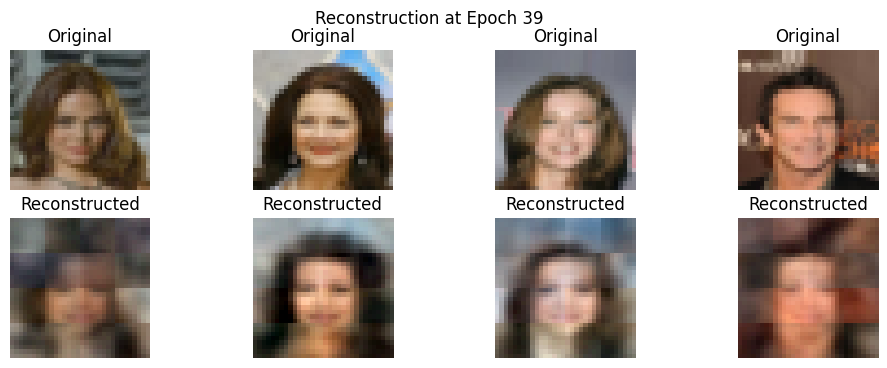

Epoch: 39/50, Avg Loss: 0.08878703151322619, Avg Reconstruction Loss: 0.05834587616256521, Avg KL Loss: 17118.697138919106, Beta: 1.7782401531115642e-06


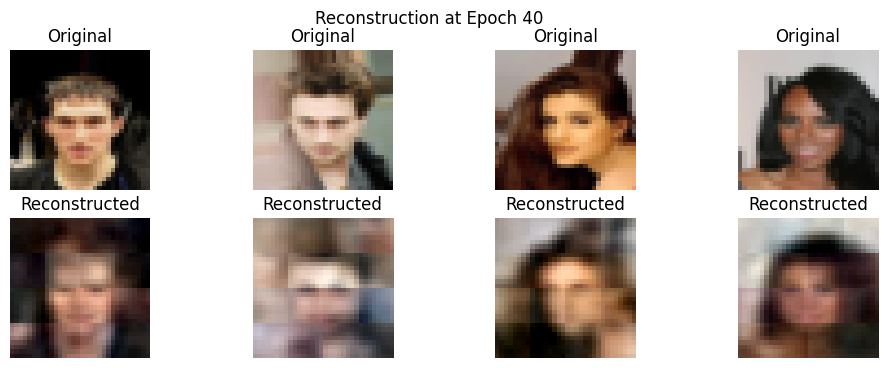

Epoch: 40/50, Avg Loss: 0.09173944903702676, Avg Reconstruction Loss: 0.060393183574646334, Avg KL Loss: 16046.45297975178, Beta: 1.953469968527308e-06


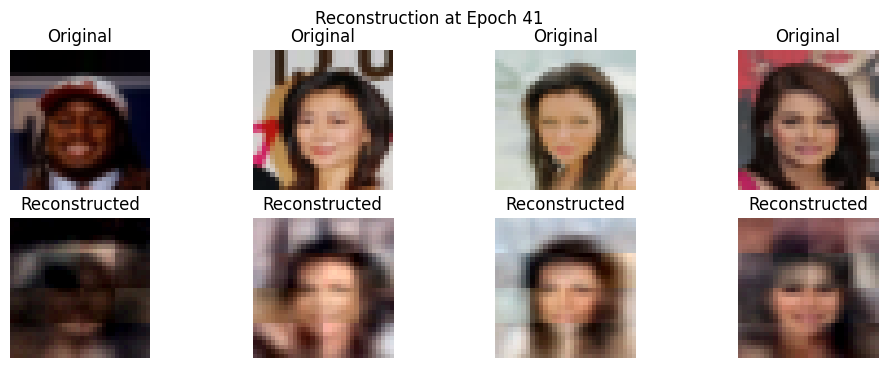

Epoch: 41/50, Avg Loss: 0.09375233391794978, Avg Reconstruction Loss: 0.061726884751380245, Avg KL Loss: 14923.550997577137, Beta: 2.145967130064388e-06


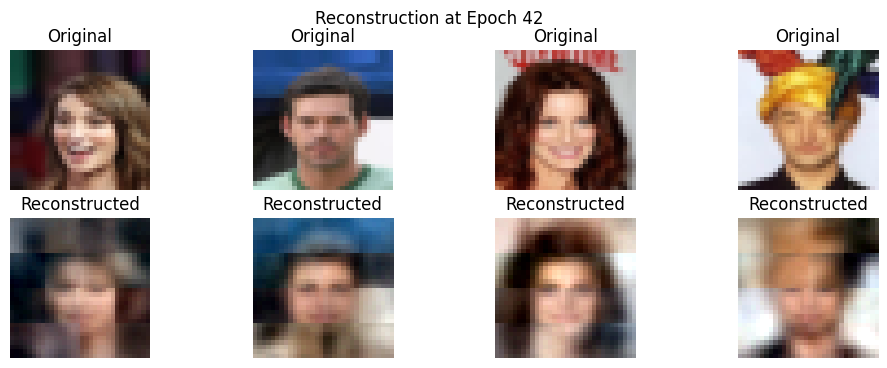

Epoch: 42/50, Avg Loss: 0.09709492919943001, Avg Reconstruction Loss: 0.06387432098765916, Avg KL Loss: 14091.855382219146, Beta: 2.3574331817286995e-06


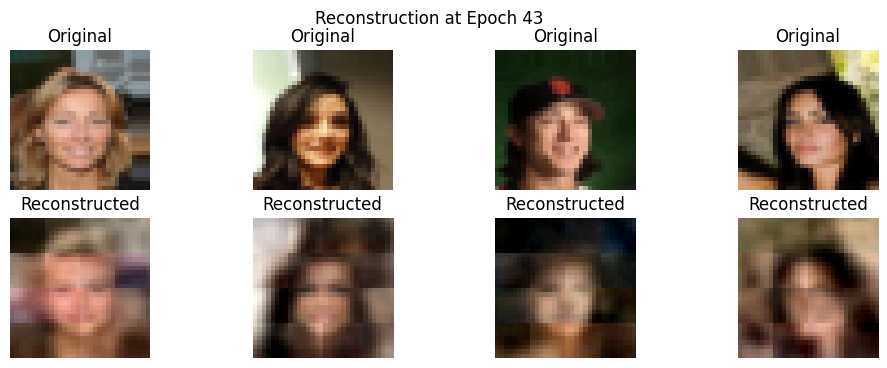

Epoch: 43/50, Avg Loss: 0.10017117923950847, Avg Reconstruction Loss: 0.06599211169383194, Avg KL Loss: 13197.890056368671, Beta: 2.589737339615603e-06


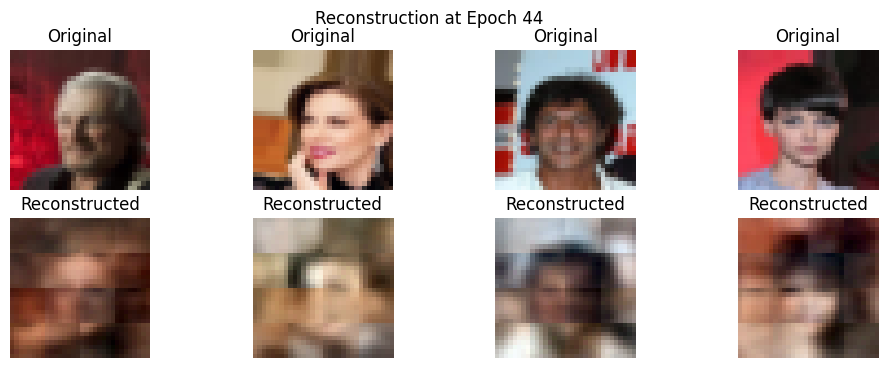

Epoch: 44/50, Avg Loss: 0.10244543756110759, Avg Reconstruction Loss: 0.06745563504062121, Avg KL Loss: 12298.98962865902, Beta: 2.8449330145091504e-06


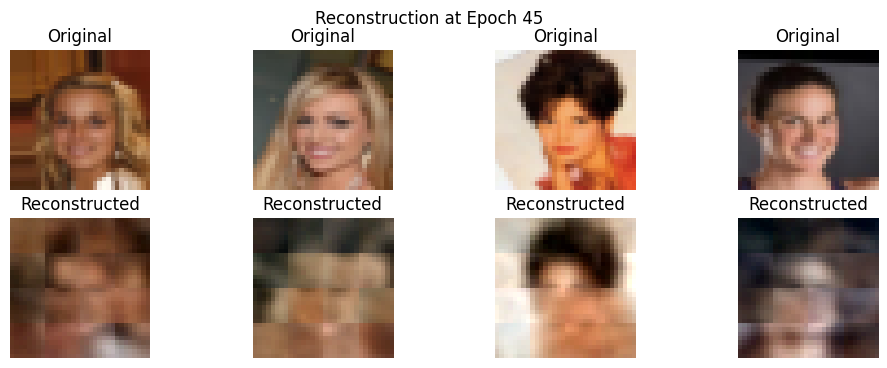

Epoch: 45/50, Avg Loss: 0.10593387663741655, Avg Reconstruction Loss: 0.06994831580904466, Avg KL Loss: 11514.36261990704, Beta: 3.1252759626369885e-06


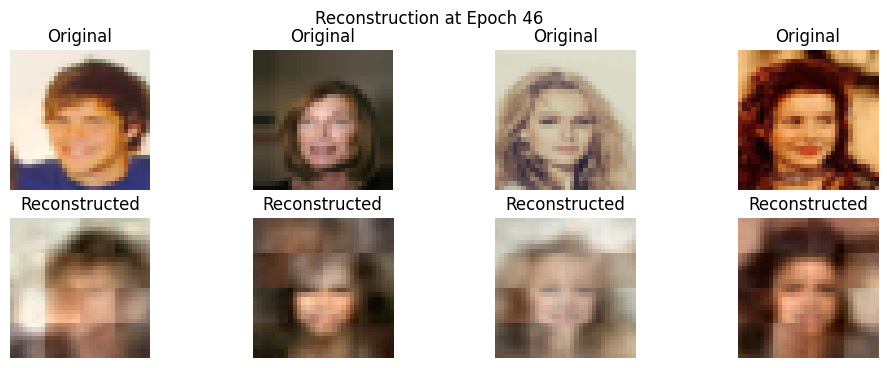

Epoch: 46/50, Avg Loss: 0.10938517409789411, Avg Reconstruction Loss: 0.07229642966125585, Avg KL Loss: 10802.827163889438, Beta: 3.433244225021502e-06


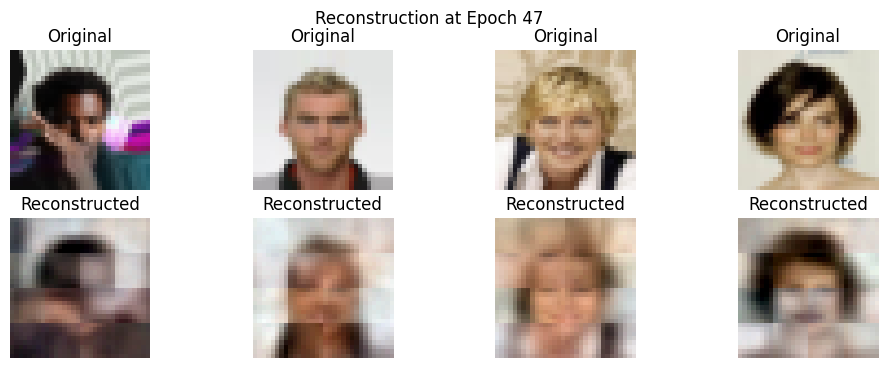

Epoch: 47/50, Avg Loss: 0.11222429054824612, Avg Reconstruction Loss: 0.07436767220497131, Avg KL Loss: 10037.390074910996, Beta: 3.7715600316773096e-06


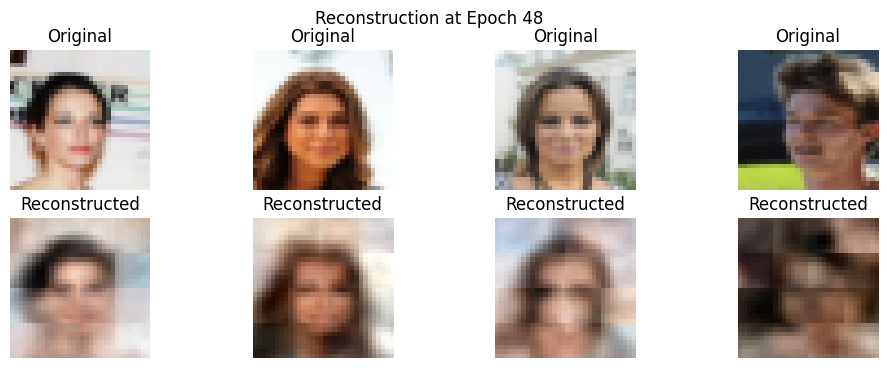

Epoch: 48/50, Avg Loss: 0.11537558104418501, Avg Reconstruction Loss: 0.07658783148361158, Avg KL Loss: 9361.753754821004, Beta: 4.143213864273422e-06


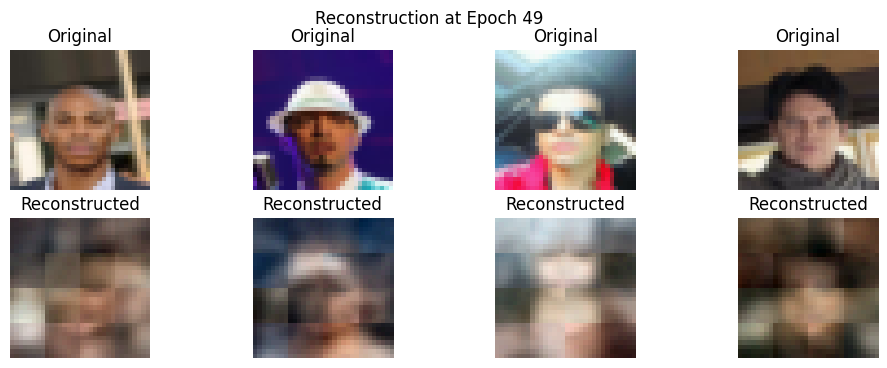

Epoch: 49/50, Avg Loss: 0.11930028047365478, Avg Reconstruction Loss: 0.07927734980100318, Avg KL Loss: 8793.367508900317, Beta: 4.551490889957609e-06


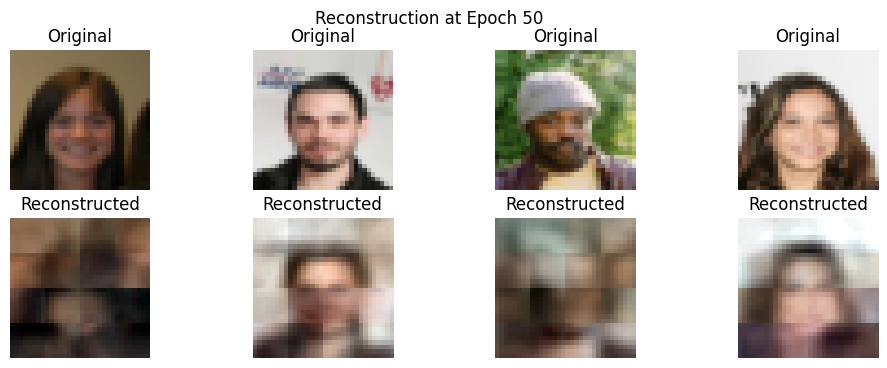

Epoch: 50/50, Avg Loss: 0.12261295035670075, Avg Reconstruction Loss: 0.08188563547556914, Avg KL Loss: 8145.463168759889, Beta: 4.999999999999999e-06


In [ ]:
# Train PatchVAE for Patch Size 8
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
resume_training = False
checkpoint_path = 'best_vae_model.pth'
num_epochs = 50


vae = PatchVAE(patch_size=8, img_channels=3, img_size=32, embed_dim=1024, latent_dim=512).to(device)
optimizer = optim.Adam(vae.parameters(), lr=1e-4)

if resume_training:
    vae.load_state_dict(torch.load(checkpoint_path))

losses, recon_losses, kl_losses = train_patchvae(vae, dataloader, optimizer, device, epochs=num_epochs, checkpoint_path='best_vae_model.pth')

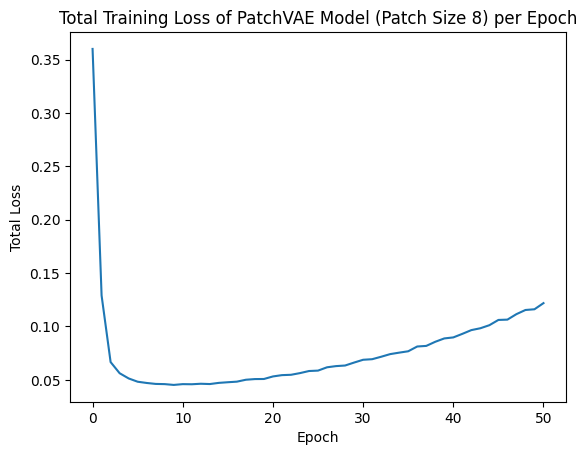

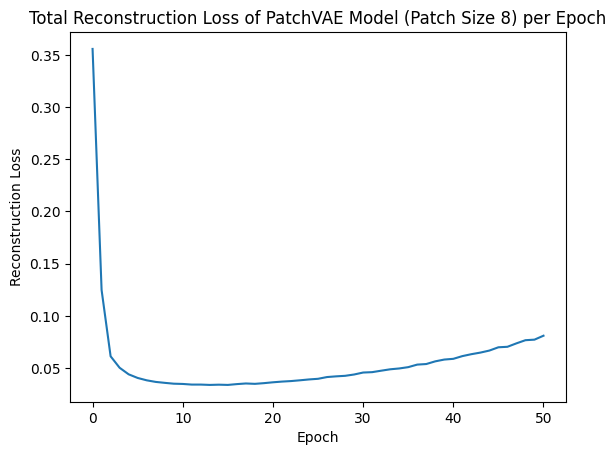

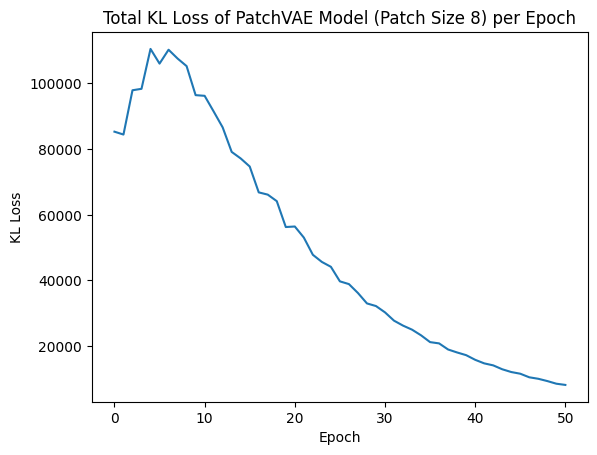

In [ ]:
# Plot Loss Curves for Patch Size 8

epoch = np.arange(0, num_epochs+1)
plt.plot(epoch, losses)
plt.xlabel('Epoch')
plt.ylabel('Total Loss')
plt.title('Total Training Loss of PatchVAE Model (Patch Size 8) per Epoch')
plt.savefig('total_loss.png')
plt.show()

plt.plot(epoch, recon_losses)
plt.xlabel('Epoch')
plt.ylabel('Reconstruction Loss')
plt.title('Total Reconstruction Loss of PatchVAE Model (Patch Size 8) per Epoch')
plt.savefig('recon_loss.png')
plt.show()

plt.plot(epoch, kl_losses)
plt.xlabel('Epoch')
plt.ylabel('KL Loss')
plt.title('Total KL Loss of PatchVAE Model (Patch Size 8) per Epoch')
plt.savefig('kl_loss.png')
plt.show()

_DISCUSSION FOR QUESTION 4:_

_The code for sampling the latent space the PatchVAE model to generate samples, alongside example generations, are shown below for both patch sizes of 32 and 8. As discussed above, in our experimentation with different patch sizes, we found that a patch size of 32 provided both the best high-level structure and low-level detail, so our results with a patch size of 32 should be viewed as our true results. We nonetheless provide our results with a patch size of 8 as a reference point for our previous failed attempt which motivated the change to a patch size of 32._

_As seen below, while the generations for a patch size of 8 are dark and do not at all resemble human faces, the generations for a patch size of 32 do indeed resemble realistic human faces. The performance is imperfect, as the model demonstrates a tendency towards female-looking faces (possibly because female faces are overrepresented in the training dataset), and the generated faces display minimal variation, only providing slight variations in head angle, background color, and skin tone. Nonetheless, they are realistic human faces, containing all of the features of a human face, such as eyes, nose, mouth, and hair._

_The fact that our model has learned to generate human faces with a high degree of structural accuracy but low variation potentially suggests that the model has not been sufficiently regularized. Specifically, the latent space may be far from the desired isotropic Gaussian, and therefore when we sample from the isotropic Gaussian, we are only sampling a small region of a much wider distribution, and thus sample very similar faces which do not represent the full variety of faces which the model can generate. This could possibly be fixed by increasing the weight on the KL loss to encourage the model to learn a distribution closer to the isotropic Gaussian. However, attempts to do this resulted in the reconstruction loss decaying too severely (due to the relatively smaller weight being placed on it in the loss function), harming the quality of the reconstructed faces to an unacceptable degree._

samples min: -0.6298083
samples max: 0.64605534


<ipython-input-30-c033bf76dcc7>:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  vae.load_state_dict(torch.load(checkpoint_path))


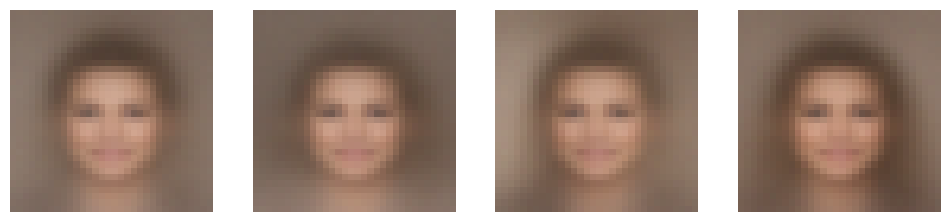

In [ ]:
# Generate images by sampling from latent space for patch size 32
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
checkpoint_path = '/content/best_vae_model.pth'
vae = PatchVAE(patch_size=32, img_channels=3, img_size=32, embed_dim=1024, latent_dim=512).to(device)
vae.load_state_dict(torch.load(checkpoint_path))
vae.eval()

samples = vae.sample(4)
samples = samples.permute(0, 2, 3, 1).detach().cpu().numpy()
print("samples min:", np.min(samples))
print("samples max:", np.max(samples))

samples = (samples + 1) / 2
samples = np.clip(samples, 0, 1)
fig, axes = plt.subplots(1, 4, figsize=(12, 4))
for i in range(4):
    axes[i].imshow(samples[i])
    axes[i].axis('off')

samples min: -0.71756774
samples max: 0.45464727


<ipython-input-27-92a9ec51e054>:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  vae.load_state_dict(torch.load(checkpoint_path))


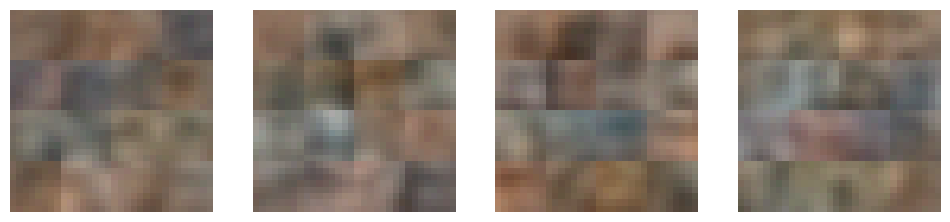

In [ ]:
# Generate images by sampling from latent space for patch size 8
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
checkpoint_path = '/content/best_vae_model.pth'
vae = PatchVAE(patch_size=8, img_channels=3, img_size=32, embed_dim=1024, latent_dim=512).to(device)
vae.load_state_dict(torch.load(checkpoint_path))
vae.eval()

samples = vae.sample(4)
samples = samples.permute(0, 2, 3, 1).detach().cpu().numpy()
print("samples min:", np.min(samples))
print("samples max:", np.max(samples))

samples = (samples + 1) / 2
samples = np.clip(samples, 0, 1)
fig, axes = plt.subplots(1, 4, figsize=(12, 4))
for i in range(4):
    axes[i].imshow(samples[i])
    axes[i].axis('off')

# Part B

# Diffusion Transformer (DiT)


We will train a DiT that operates in the patch latent space on the same dataset. The input image is decomposed into patches and processed by several DiT blocks.

_NOTE: When attempting to train the Diffusion Transformer with using the increased embedding and latent dimensions used in Part A, the Diffusion Transformer becomes excessively large and the GPU runs out of memory. Therefore, we train the Diffusion Transformer with an embedding dimension of 64 and a latent dimension of 128. This requires training a new PatchVAE with these same embedding and latent dimensions. We train this model below, using a patch size and stride of 32. The results using this model were similar to those of the PatchVAE model with patch size and stride of 32 from Part A (which had an embedding dimension of 1024 and latent dimension of 512). Specifically, both its reconstructions during training time and its generations at test time consisted of broadly-coherent images of realistic human faces, and included all of the lower-level details of a human face, such as eyes, nose, mouth, and hair. However, the model still generates faces at test time containing minimal variation, only providing slight variations in head angle, background color, and skin tone, and still demonstrates a strong tendency towards female-looking faces._

Beginning of Training, Loss: 0.35848069190979004, Reconstruction Loss: 0.35846272110939026, KL Loss: 359.2720947265625


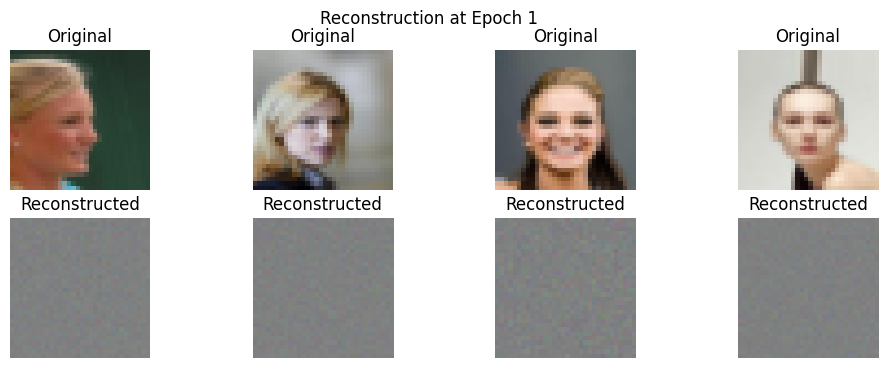

Epoch: 1/75, Avg Loss: 0.27860117543347274, Avg Reconstruction Loss: 0.27852404155308685, Avg KL Loss: 1542.7096294934236, Beta: 5.000000000000006e-08


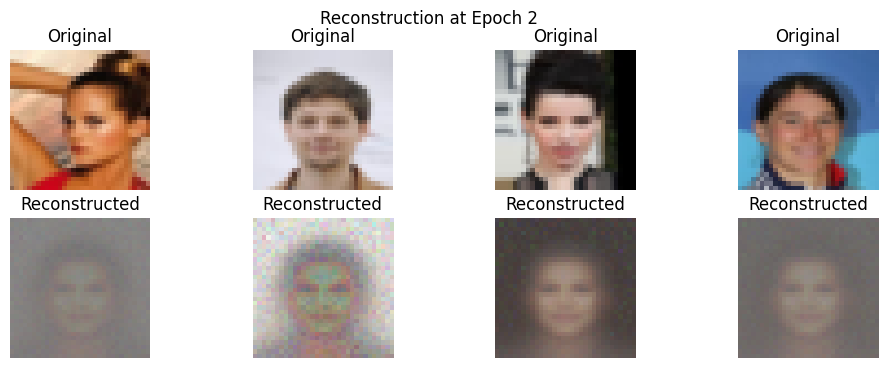

Epoch: 2/75, Avg Loss: 0.18942750707457337, Avg Reconstruction Loss: 0.18921200704725483, Avg KL Loss: 3923.390536537653, Beta: 5.492705709937796e-08


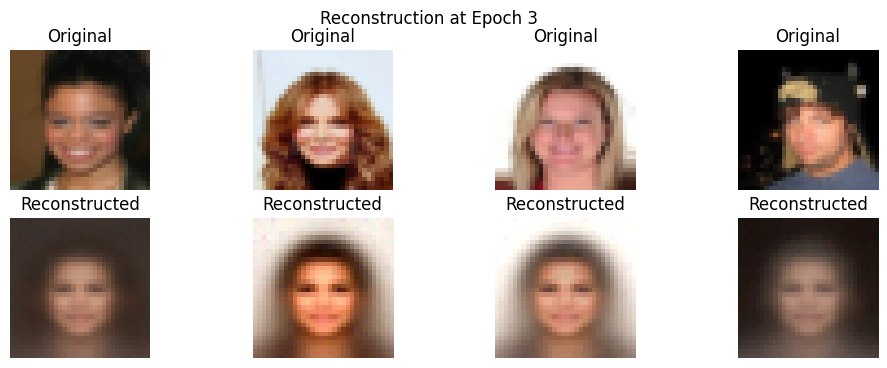

Epoch: 3/75, Avg Loss: 0.17474206131470355, Avg Reconstruction Loss: 0.1743974691327614, Avg KL Loss: 5710.871714917919, Beta: 6.033963203196648e-08


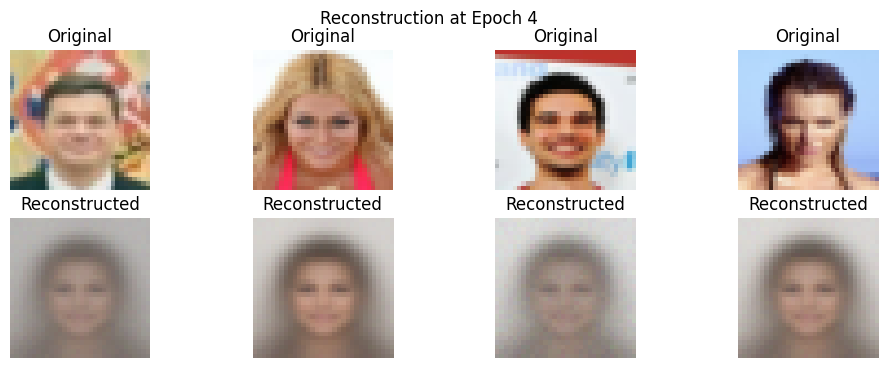

Epoch: 4/75, Avg Loss: 0.1705612962758994, Avg Reconstruction Loss: 0.17006183066700079, Avg KL Loss: 7535.055704237539, Beta: 6.628556827950549e-08


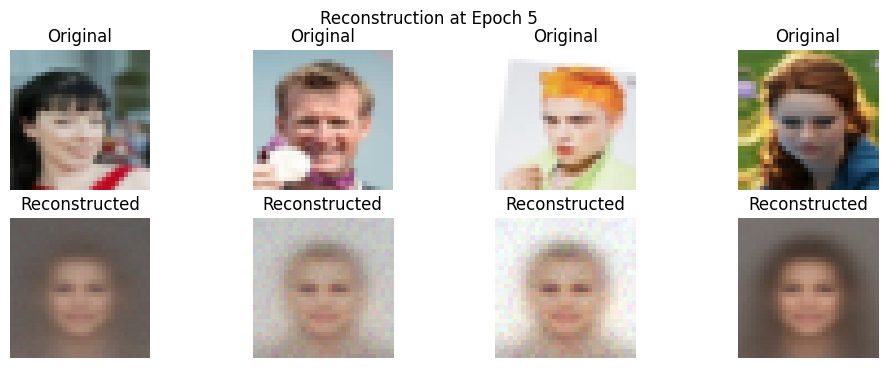

Epoch: 5/75, Avg Loss: 0.16592952873133407, Avg Reconstruction Loss: 0.16526788133609144, Avg KL Loss: 9086.389585084553, Beta: 7.281742387506222e-08


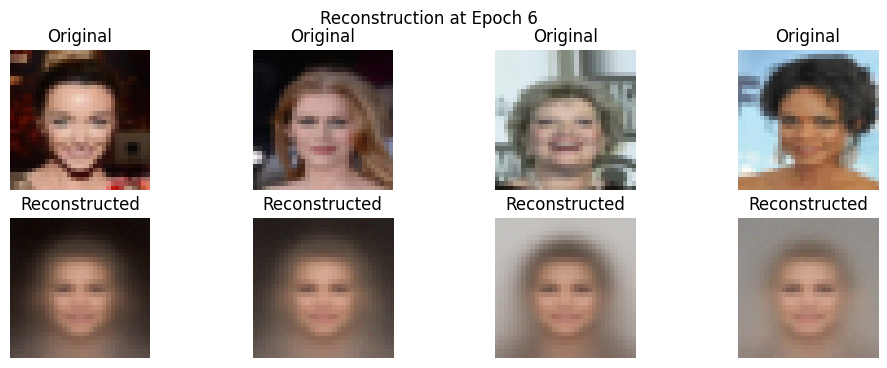

Epoch: 6/75, Avg Loss: 0.16512706536280958, Avg Reconstruction Loss: 0.16431933169877982, Avg KL Loss: 10097.567861822587, Beta: 7.999293598030292e-08


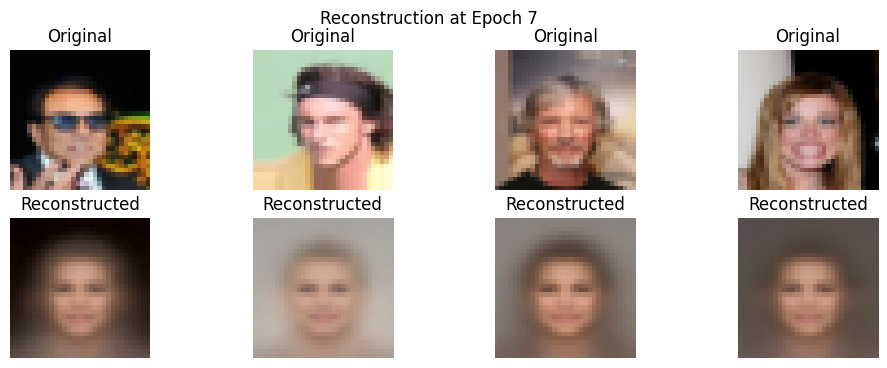

Epoch: 7/75, Avg Loss: 0.1641705007869986, Avg Reconstruction Loss: 0.16332124682921398, Avg KL Loss: 9664.282988343059, Beta: 8.787553124273961e-08


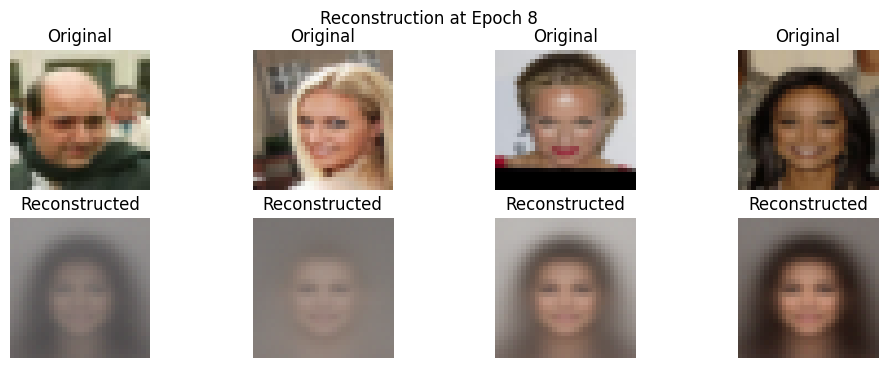

Epoch: 8/75, Avg Loss: 0.160173887504807, Avg Reconstruction Loss: 0.15918295613572567, Avg KL Loss: 10265.00884159909, Beta: 9.65348864441625e-08


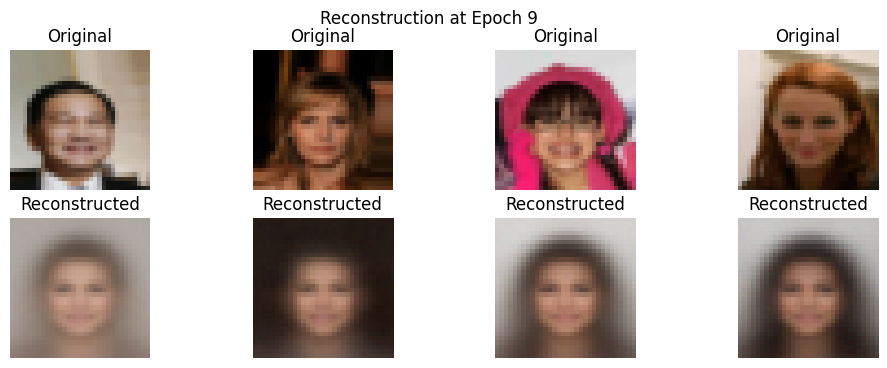

Epoch: 9/75, Avg Loss: 0.15842608881147602, Avg Reconstruction Loss: 0.15724153099935265, Avg KL Loss: 11170.060682852058, Beta: 1.060475443960095e-07


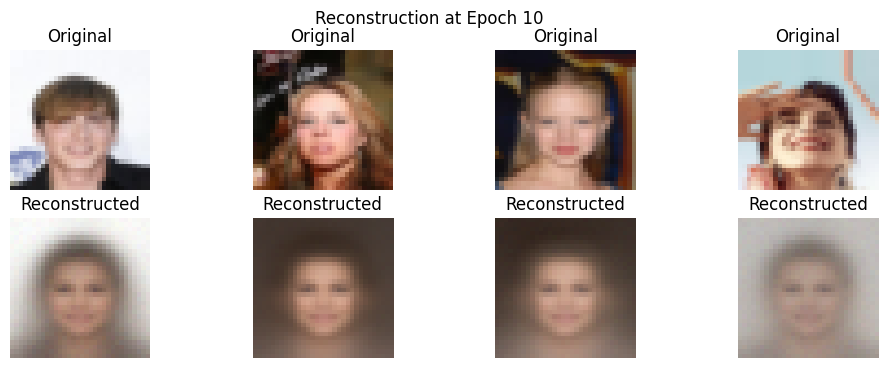

Epoch: 10/75, Avg Loss: 0.1577915790714795, Avg Reconstruction Loss: 0.15644374640682077, Avg KL Loss: 11569.6176881428, Beta: 1.1649759052576877e-07


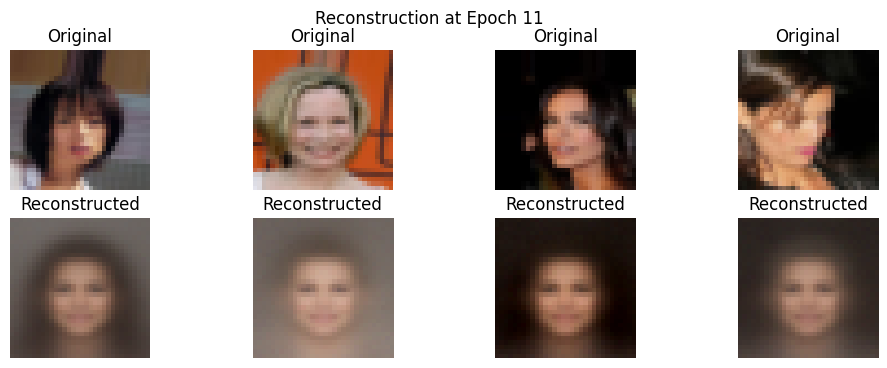

Epoch: 11/75, Avg Loss: 0.15574836900717096, Avg Reconstruction Loss: 0.15424787375745894, Avg KL Loss: 11724.68639055083, Beta: 1.279773961349769e-07


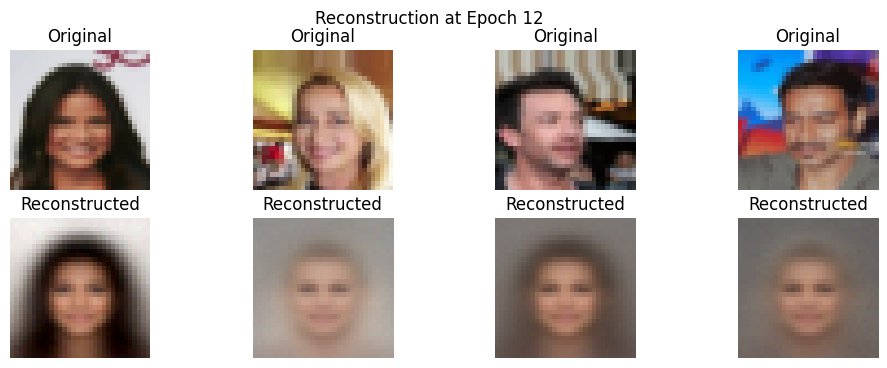

Epoch: 12/75, Avg Loss: 0.1539482342291482, Avg Reconstruction Loss: 0.1522794616750524, Avg KL Loss: 11869.913609758209, Beta: 1.4058843489871165e-07


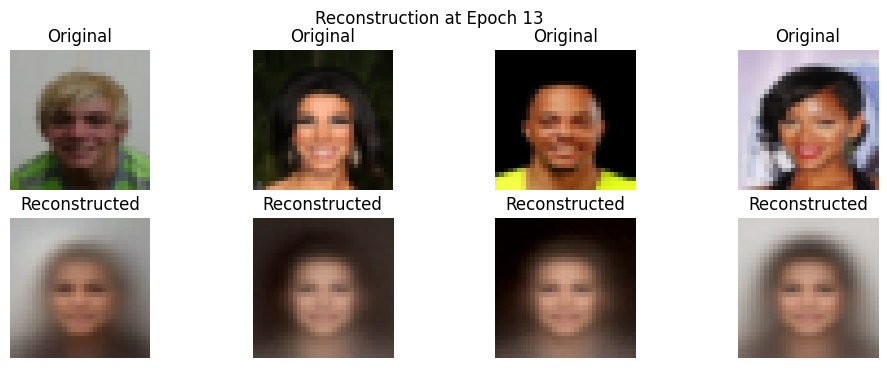

Epoch: 13/75, Avg Loss: 0.1503181525423557, Avg Reconstruction Loss: 0.1485467579545854, Avg KL Loss: 11469.630398907238, Beta: 1.5444217982387415e-07


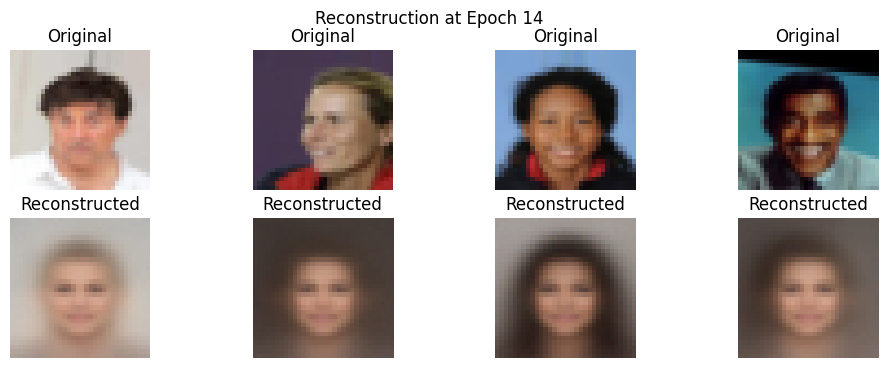

Epoch: 14/75, Avg Loss: 0.14733661315109156, Avg Reconstruction Loss: 0.14542045415956764, Avg KL Loss: 11294.041599708267, Beta: 1.6966108859476655e-07


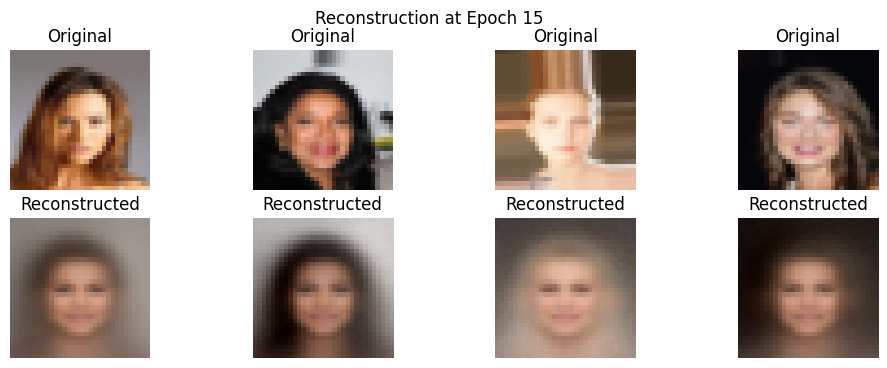

Epoch: 15/75, Avg Loss: 0.1425490417057955, Avg Reconstruction Loss: 0.14066500188429146, Avg KL Loss: 10108.613211716278, Beta: 1.863796860157471e-07


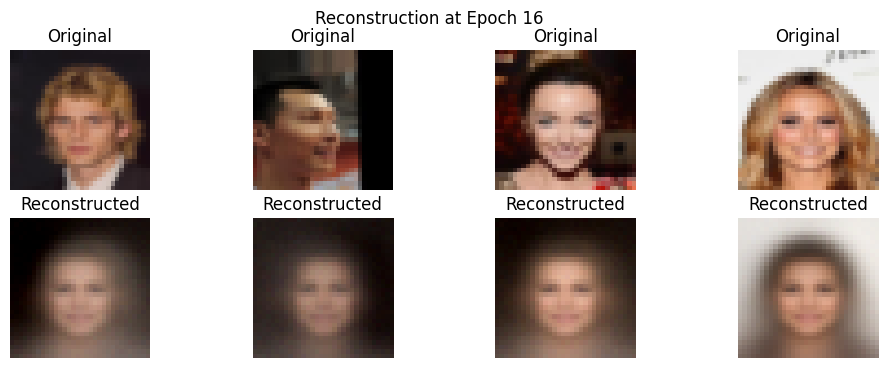

Epoch: 16/75, Avg Loss: 0.14051698223699496, Avg Reconstruction Loss: 0.13822450734014752, Avg KL Loss: 11196.693217217167, Beta: 2.0474575311902131e-07


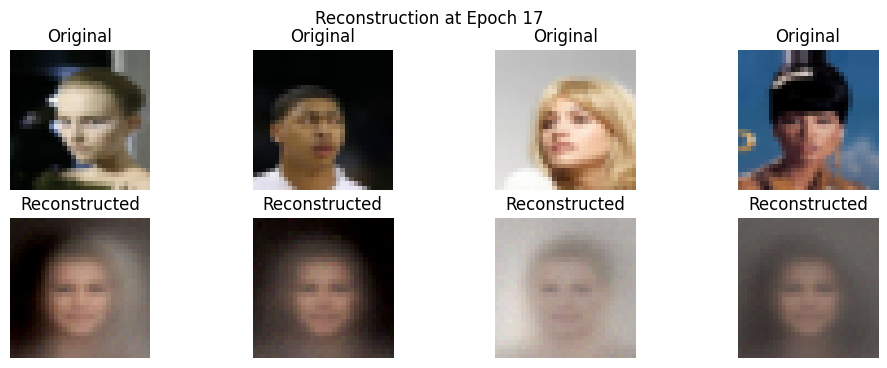

Epoch: 17/75, Avg Loss: 0.1386977246479143, Avg Reconstruction Loss: 0.13621197518291353, Avg KL Loss: 11051.625948749012, Beta: 2.249216334484723e-07


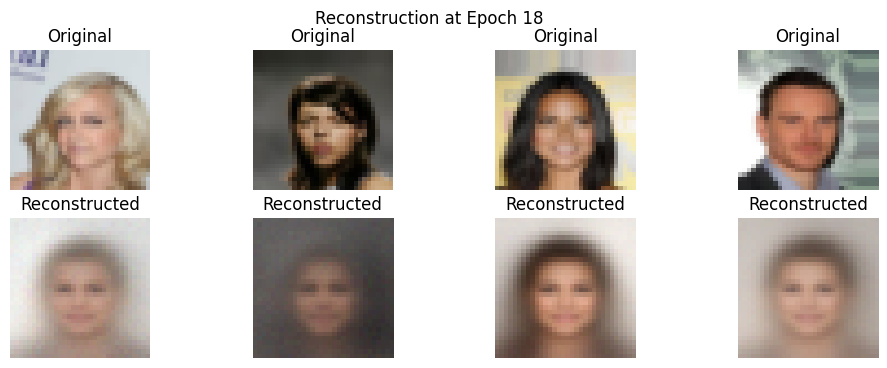

Epoch: 18/75, Avg Loss: 0.13698982173883462, Avg Reconstruction Loss: 0.1343175327476067, Avg KL Loss: 10815.23407214201, Beta: 2.470856680661917e-07


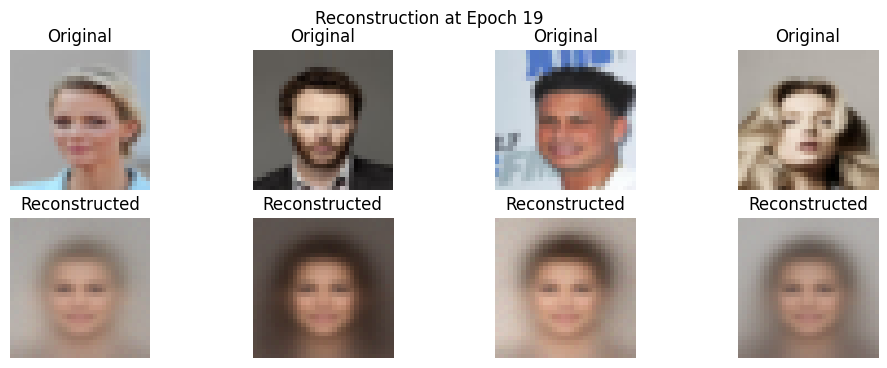

Epoch: 19/75, Avg Loss: 0.1322113190647922, Avg Reconstruction Loss: 0.129545262437078, Avg KL Loss: 9822.126875865308, Beta: 2.7143377196619345e-07


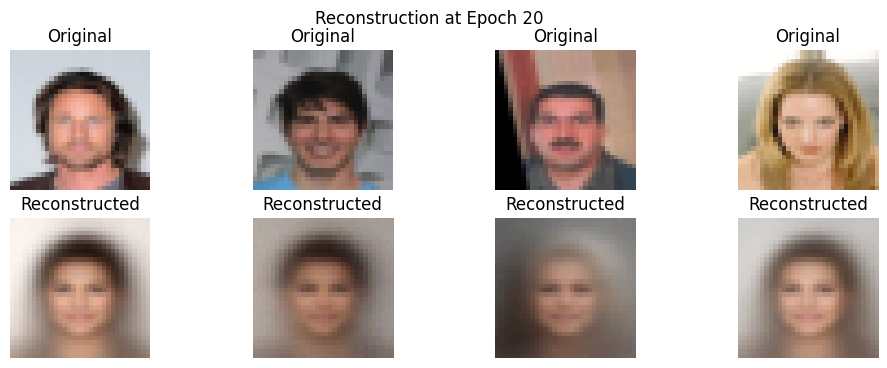

Epoch: 20/75, Avg Loss: 0.1266802433359472, Avg Reconstruction Loss: 0.12355154394348965, Avg KL Loss: 10492.614294897152, Beta: 2.9818116582973254e-07


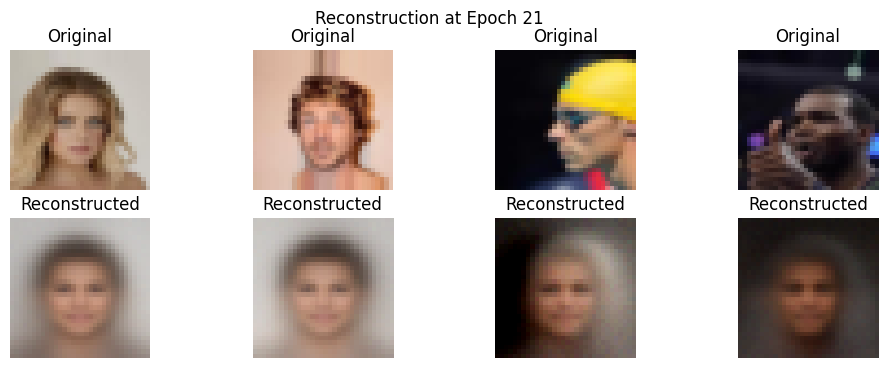

Epoch: 21/75, Avg Loss: 0.12552207755514339, Avg Reconstruction Loss: 0.12206508926575697, Avg KL Loss: 10553.61698971519, Beta: 3.275642784297758e-07


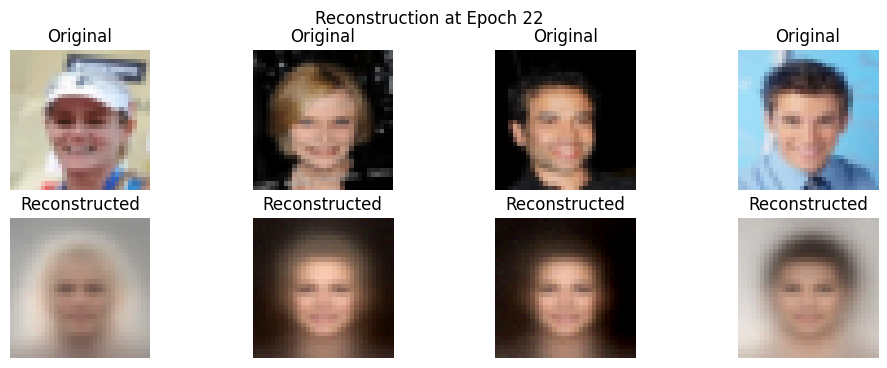

Epoch: 22/75, Avg Loss: 0.12486151002253158, Avg Reconstruction Loss: 0.12123672815063331, Avg KL Loss: 10073.237573551227, Beta: 3.598428365005764e-07


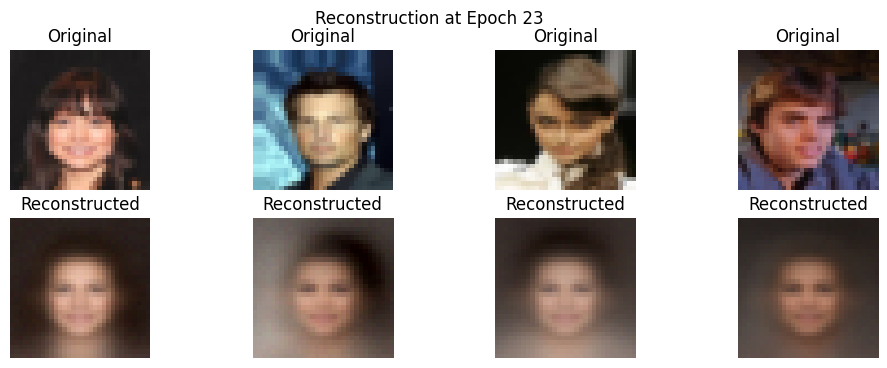

Epoch: 23/75, Avg Loss: 0.12356478211623204, Avg Reconstruction Loss: 0.11990139303328115, Avg KL Loss: 9267.312980555282, Beta: 3.953021605453853e-07


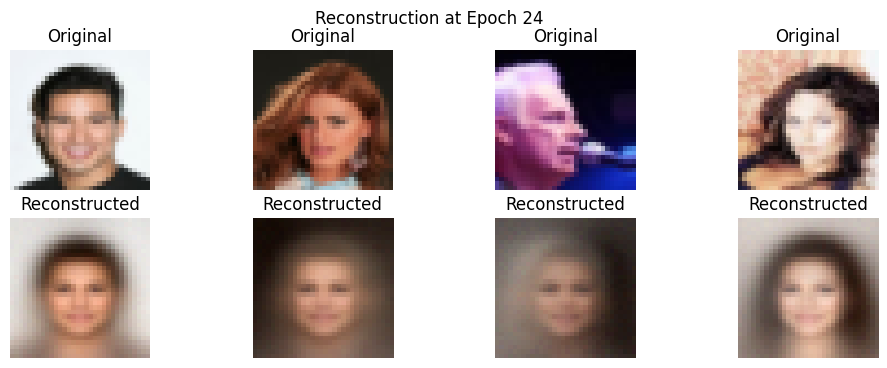

Epoch: 24/75, Avg Loss: 0.12137101835842375, Avg Reconstruction Loss: 0.11754893370067017, Avg KL Loss: 8801.461224906052, Beta: 4.342556868756766e-07


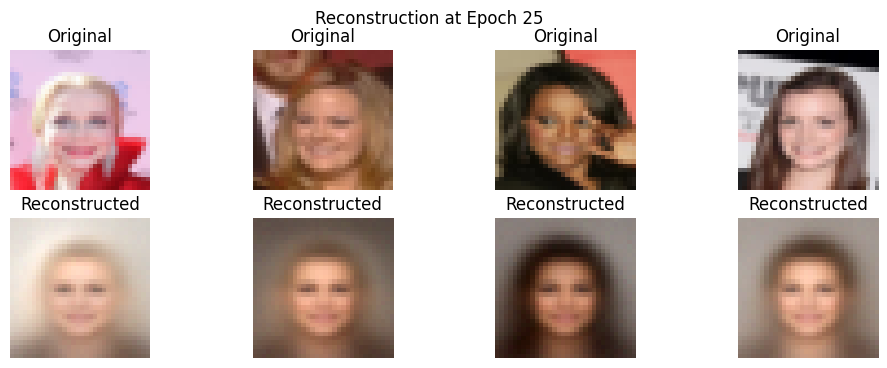

Epoch: 25/75, Avg Loss: 0.11904976724446574, Avg Reconstruction Loss: 0.1149162810437287, Avg KL Loss: 8664.722665521163, Beta: 4.770477381749972e-07


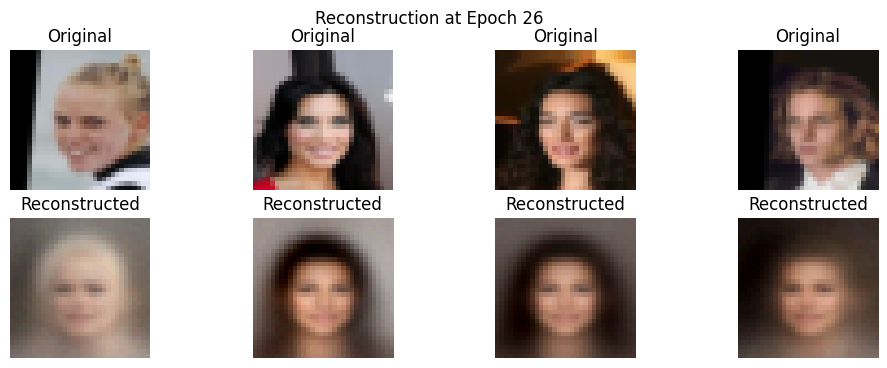

Epoch: 26/75, Avg Loss: 0.11621606067011628, Avg Reconstruction Loss: 0.11185424501382851, Avg KL Loss: 8323.177267726463, Beta: 5.240565670773431e-07


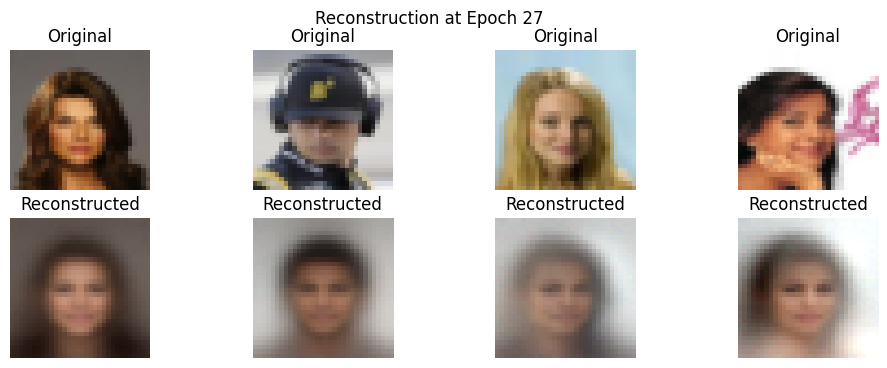

Epoch: 27/75, Avg Loss: 0.11393229408731943, Avg Reconstruction Loss: 0.10917571385072757, Avg KL Loss: 8262.288954336433, Beta: 5.756976996632237e-07


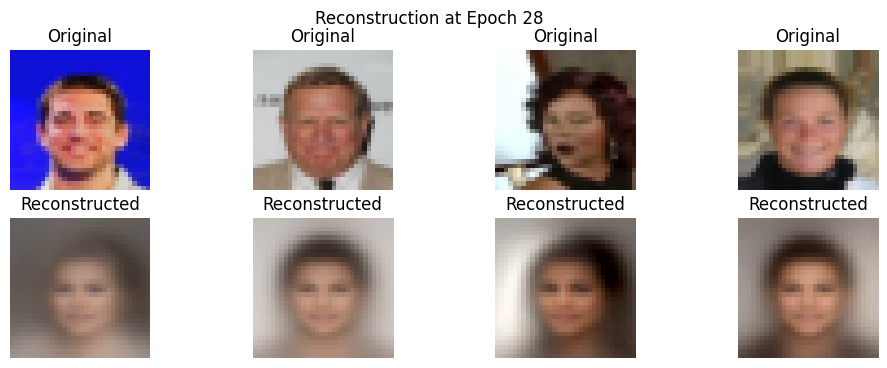

Epoch: 28/75, Avg Loss: 0.11294219567428661, Avg Reconstruction Loss: 0.10764988511800766, Avg KL Loss: 8368.247614993325, Beta: 6.32427608427648e-07


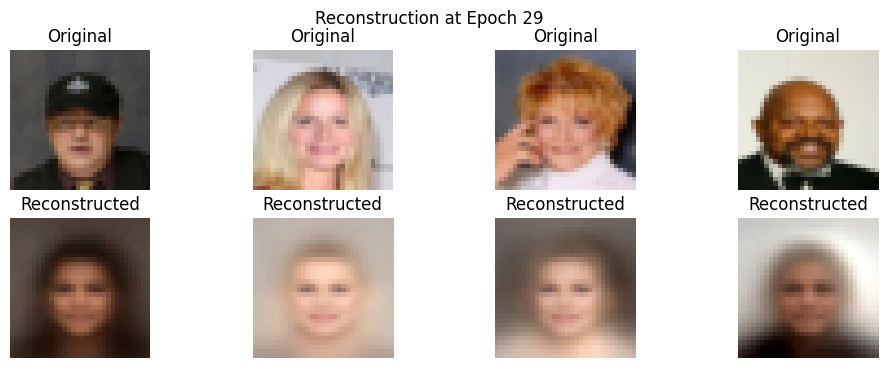

Epoch: 29/75, Avg Loss: 0.11230729001609585, Avg Reconstruction Loss: 0.10683778928050512, Avg KL Loss: 7872.642164013054, Beta: 6.947477471865687e-07


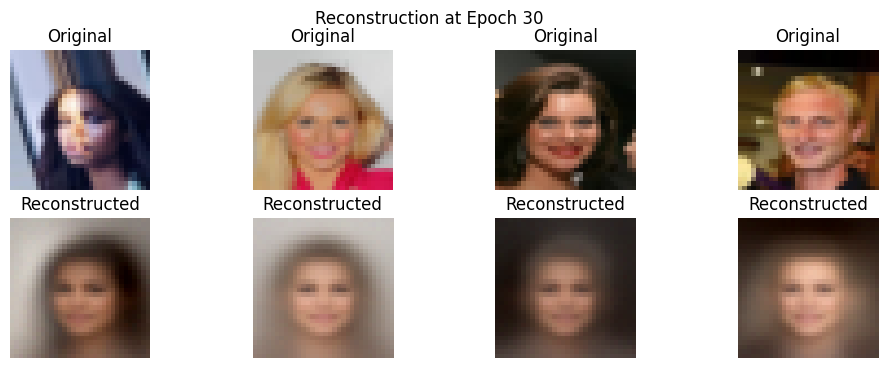

Epoch: 30/75, Avg Loss: 0.11126386958964263, Avg Reconstruction Loss: 0.10555397973784918, Avg KL Loss: 7481.423863664458, Beta: 7.632089835876164e-07


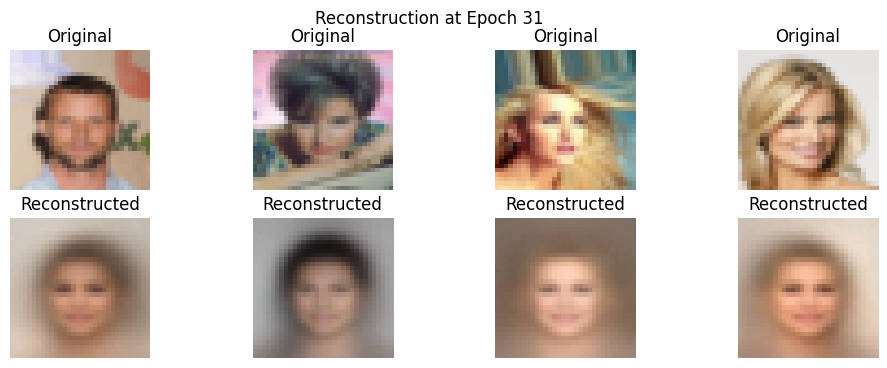

Epoch: 31/75, Avg Loss: 0.10958365002010442, Avg Reconstruction Loss: 0.10347888354636446, Avg KL Loss: 7281.3063524463505, Beta: 8.384164684055036e-07


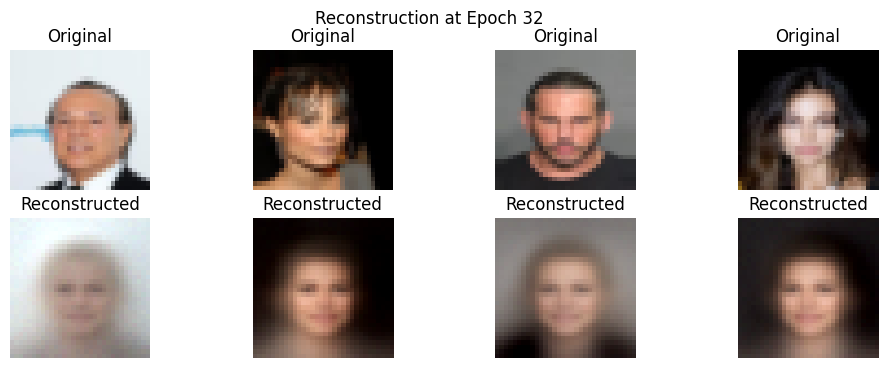

Epoch: 32/75, Avg Loss: 0.1090526635511012, Avg Reconstruction Loss: 0.10247725172887874, Avg KL Loss: 7139.155574750297, Beta: 9.210349846633574e-07


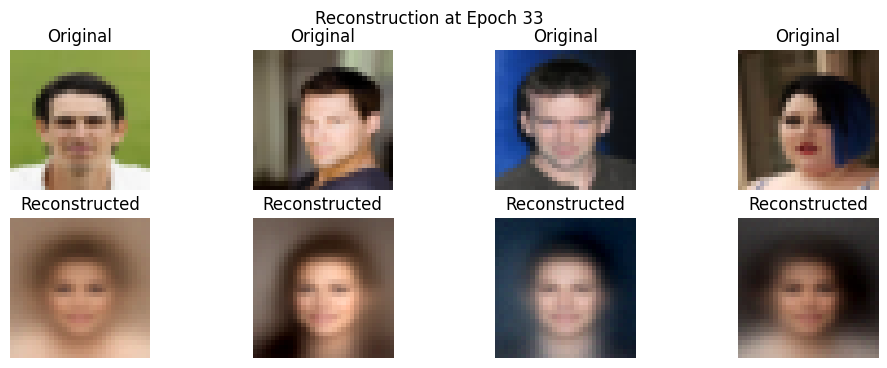

Epoch: 33/75, Avg Loss: 0.1080126547360722, Avg Reconstruction Loss: 0.10120459608262099, Avg KL Loss: 6728.695278505736, Beta: 1.0117948238625774e-06


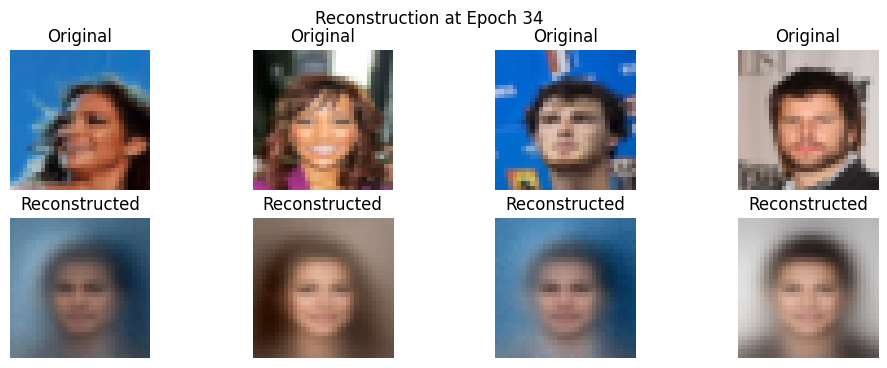

Epoch: 34/75, Avg Loss: 0.10842193955484825, Avg Reconstruction Loss: 0.10124210588916947, Avg KL Loss: 6459.59966191159, Beta: 1.1114982412630962e-06


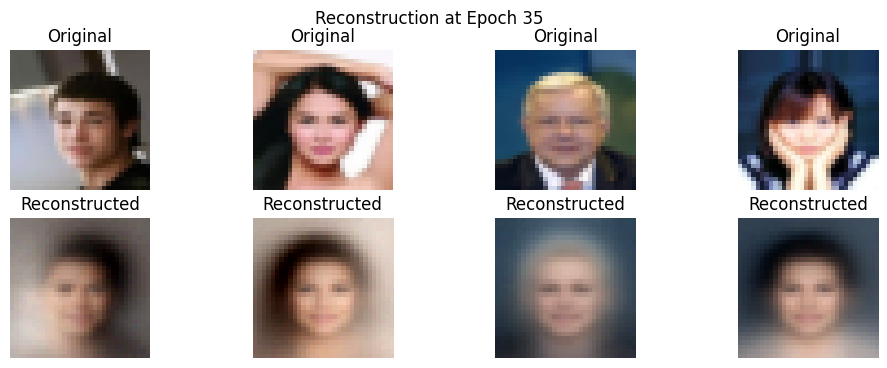

Epoch: 35/75, Avg Loss: 0.10920393929074082, Avg Reconstruction Loss: 0.10164811415008351, Avg KL Loss: 6188.092408771757, Beta: 1.2210265472743261e-06


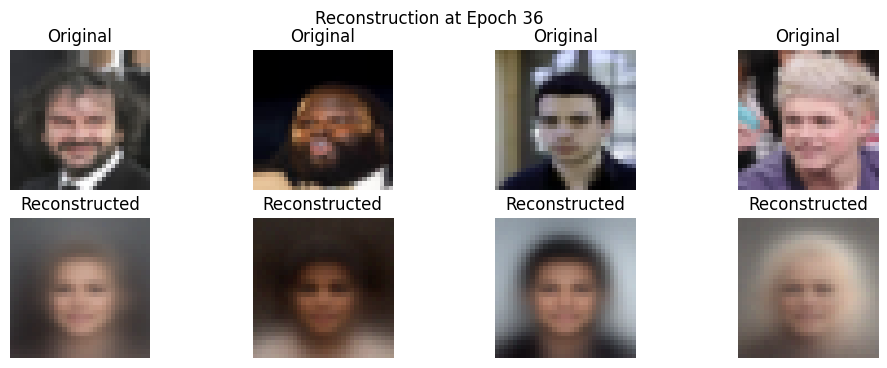

Epoch: 36/75, Avg Loss: 0.1091182398833806, Avg Reconstruction Loss: 0.10141377782897104, Avg KL Loss: 5743.82095839102, Beta: 1.3413478976398633e-06


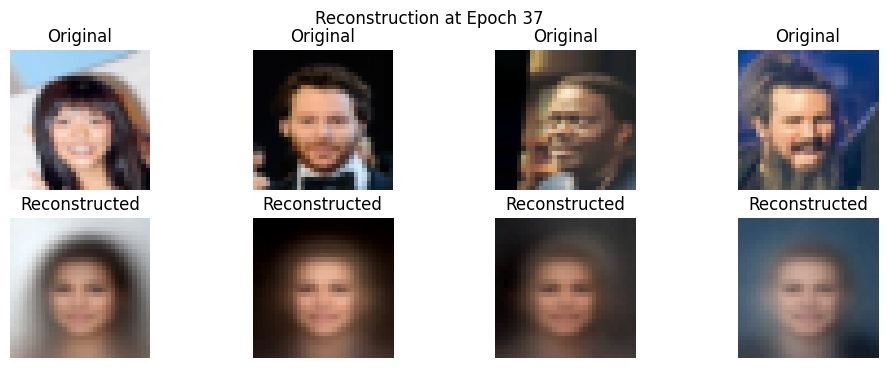

Epoch: 37/75, Avg Loss: 0.10899546148279045, Avg Reconstruction Loss: 0.1008699823972545, Avg KL Loss: 5514.31051442593, Beta: 1.4735258512759055e-06


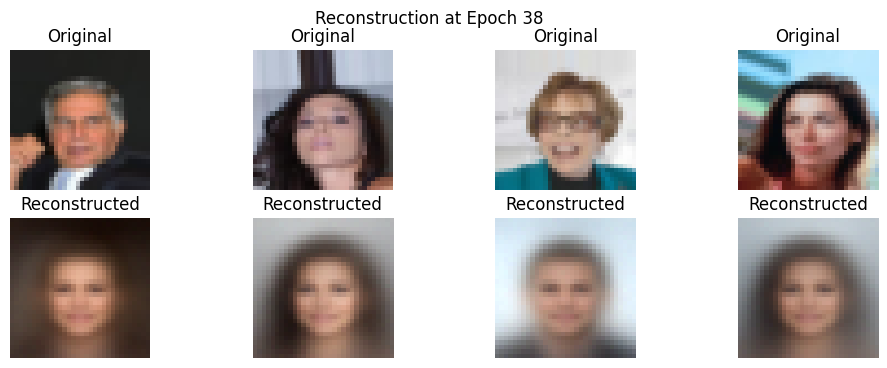

Epoch: 38/75, Avg Loss: 0.10975388277180587, Avg Reconstruction Loss: 0.10135133790818951, Avg KL Loss: 5190.829353429094, Beta: 1.6187287714088219e-06


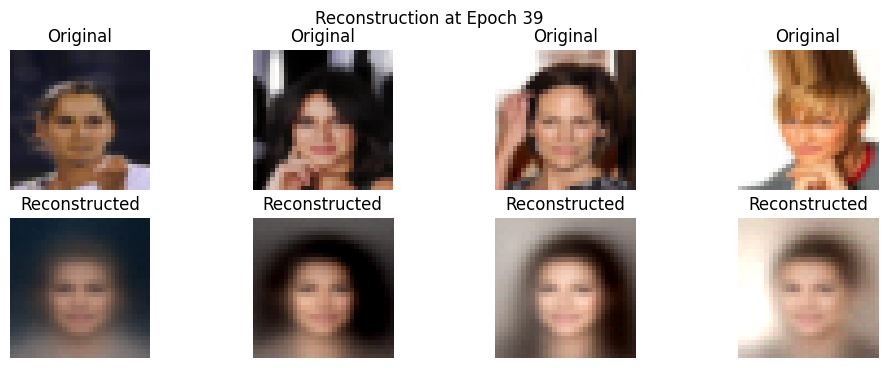

Epoch: 39/75, Avg Loss: 0.10978716696742215, Avg Reconstruction Loss: 0.1009275215336039, Avg KL Loss: 4982.254821004747, Beta: 1.7782401531115642e-06


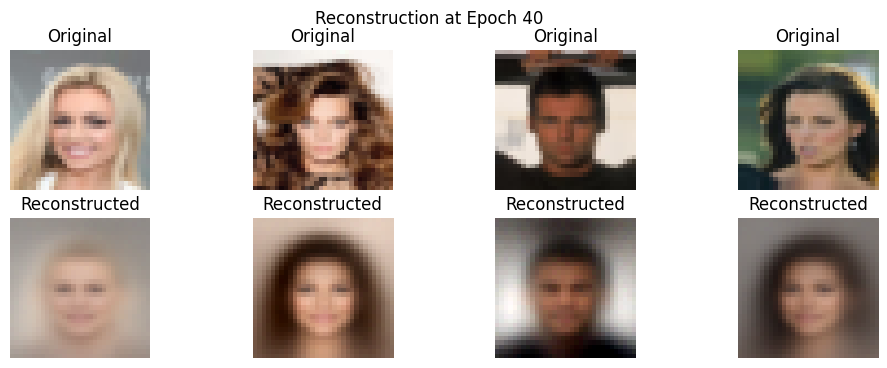

Epoch: 40/75, Avg Loss: 0.10953142371358751, Avg Reconstruction Loss: 0.10046589600888989, Avg KL Loss: 4640.730535193335, Beta: 1.953469968527308e-06


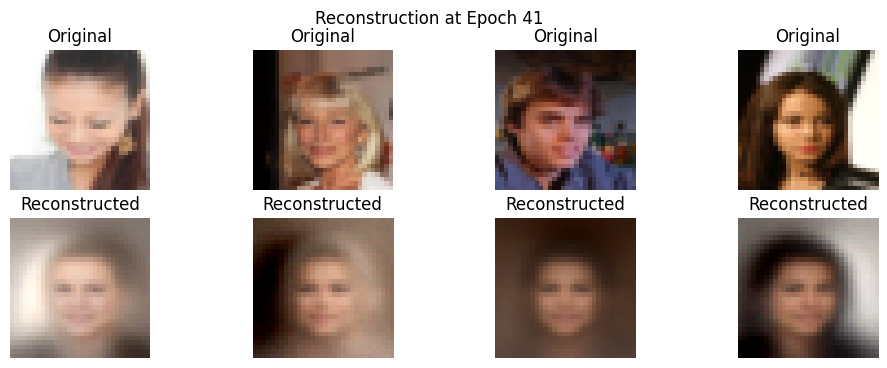

Epoch: 41/75, Avg Loss: 0.10963370999957942, Avg Reconstruction Loss: 0.10001511098463324, Avg KL Loss: 4482.174445429935, Beta: 2.145967130064388e-06


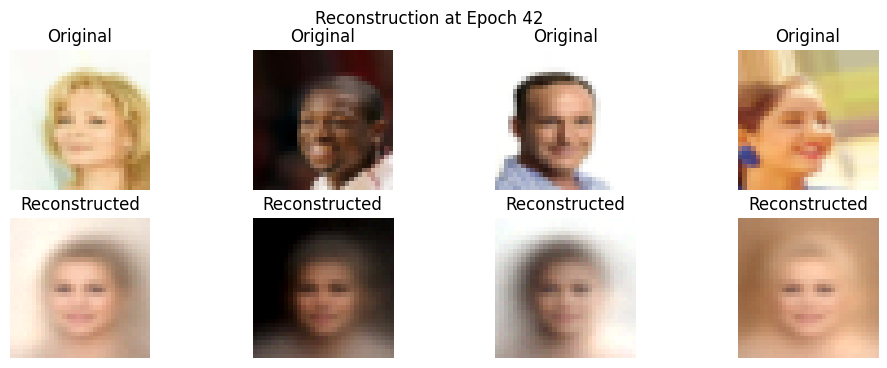

Epoch: 42/75, Avg Loss: 0.10913005622127388, Avg Reconstruction Loss: 0.09879180628664885, Avg KL Loss: 4385.383976030953, Beta: 2.3574331817286995e-06


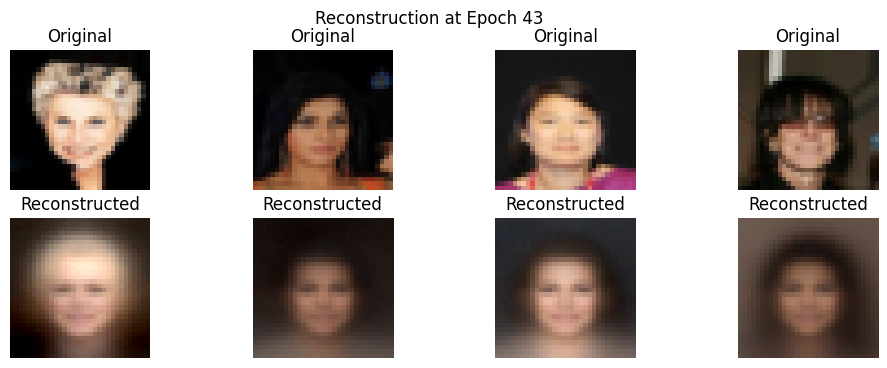

Epoch: 43/75, Avg Loss: 0.10951425427500205, Avg Reconstruction Loss: 0.09860390726524064, Avg KL Loss: 4212.91646141342, Beta: 2.589737339615603e-06


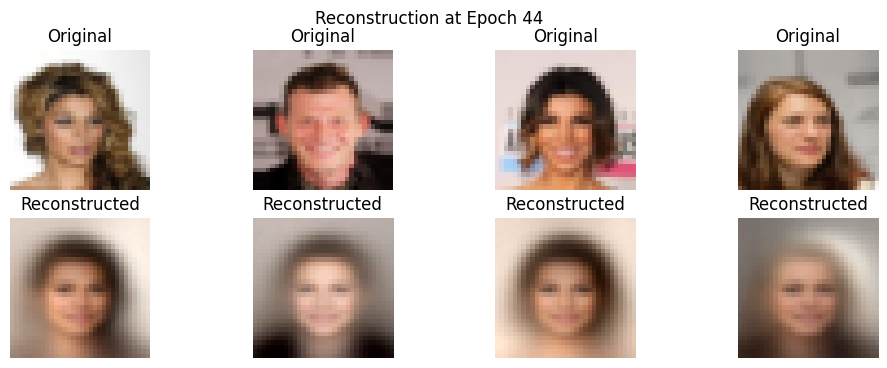

Epoch: 44/75, Avg Loss: 0.10938243869739243, Avg Reconstruction Loss: 0.09773130582857735, Avg KL Loss: 4095.3979360846024, Beta: 2.8449330145091504e-06


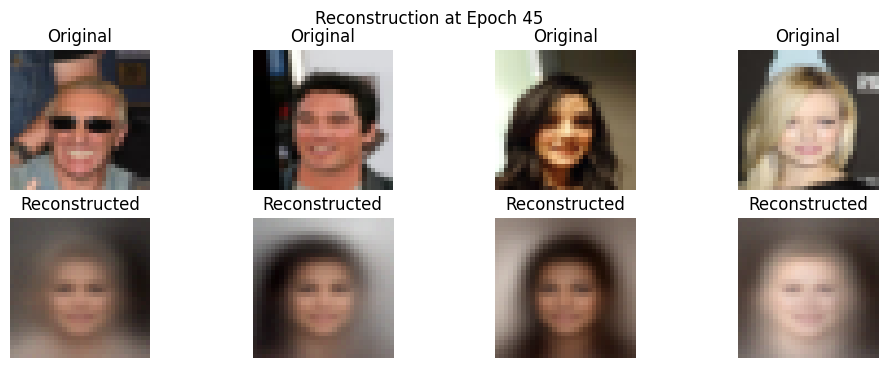

Epoch: 45/75, Avg Loss: 0.11040880483917043, Avg Reconstruction Loss: 0.09808986935811707, Avg KL Loss: 3941.711139920392, Beta: 3.1252759626369885e-06


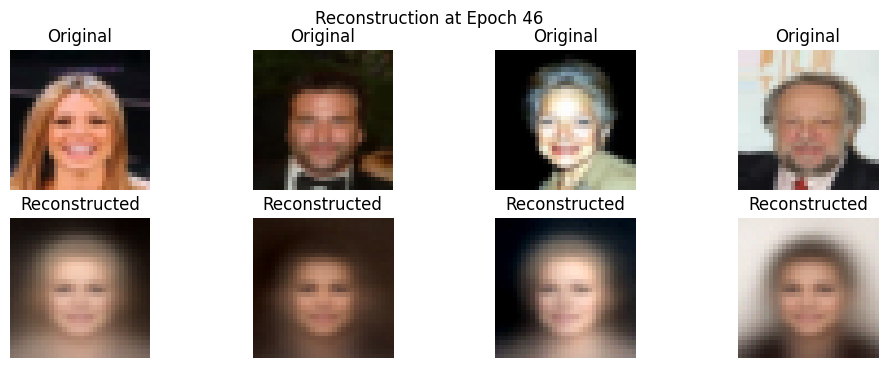

Epoch: 46/75, Avg Loss: 0.11076658502032485, Avg Reconstruction Loss: 0.09789984673261642, Avg KL Loss: 3747.691061671776, Beta: 3.433244225021502e-06


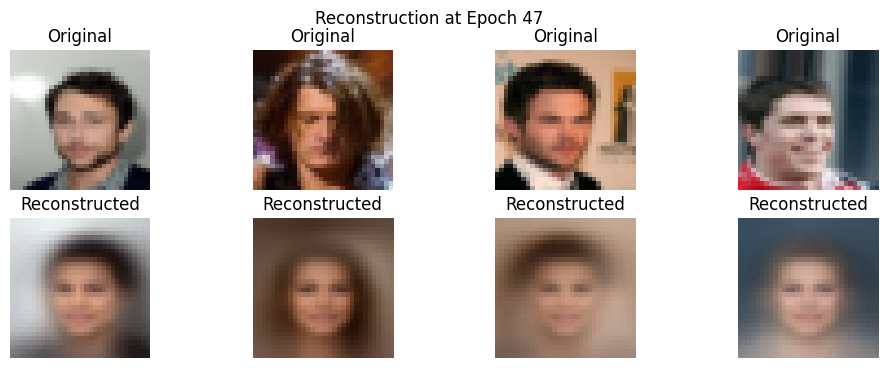

Epoch: 47/75, Avg Loss: 0.11190281242509431, Avg Reconstruction Loss: 0.0983091277789466, Avg KL Loss: 3604.2605382219144, Beta: 3.7715600316773096e-06


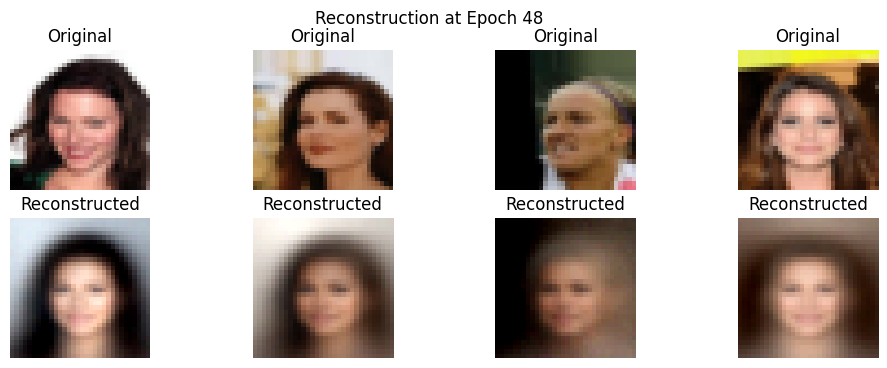

Epoch: 48/75, Avg Loss: 0.11292687954404686, Avg Reconstruction Loss: 0.09866881059317649, Avg KL Loss: 3441.3064721988726, Beta: 4.143213864273422e-06


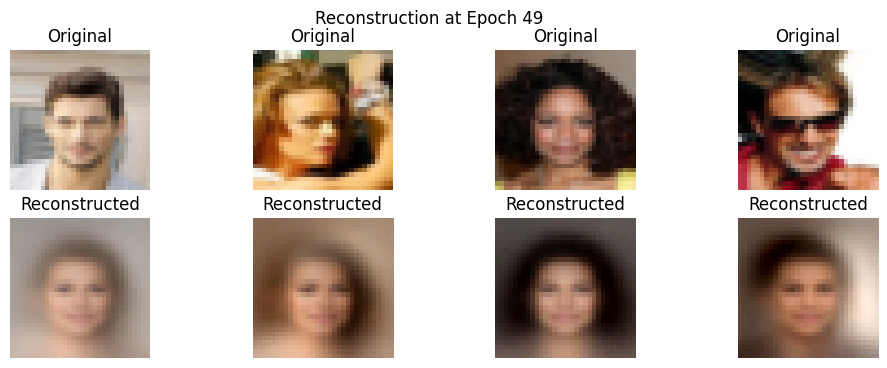

Epoch: 49/75, Avg Loss: 0.11447415934710563, Avg Reconstruction Loss: 0.09947857458757449, Avg KL Loss: 3294.653510371341, Beta: 4.551490889957609e-06


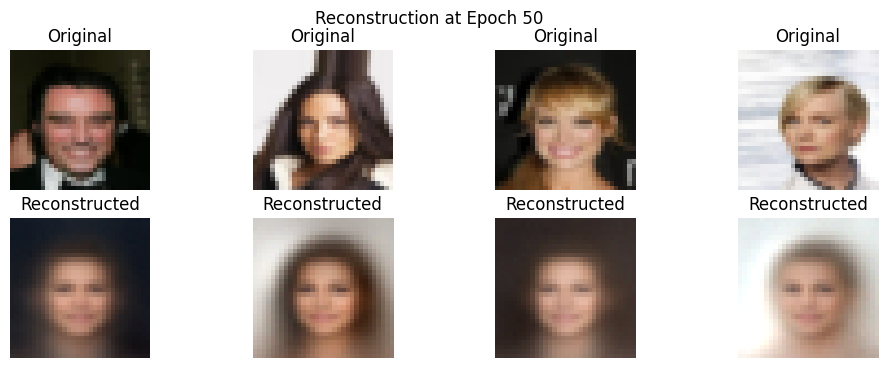

Epoch: 50/75, Avg Loss: 0.11475174355355999, Avg Reconstruction Loss: 0.09897264828787575, Avg KL Loss: 3155.819026898734, Beta: 4.999999999999999e-06


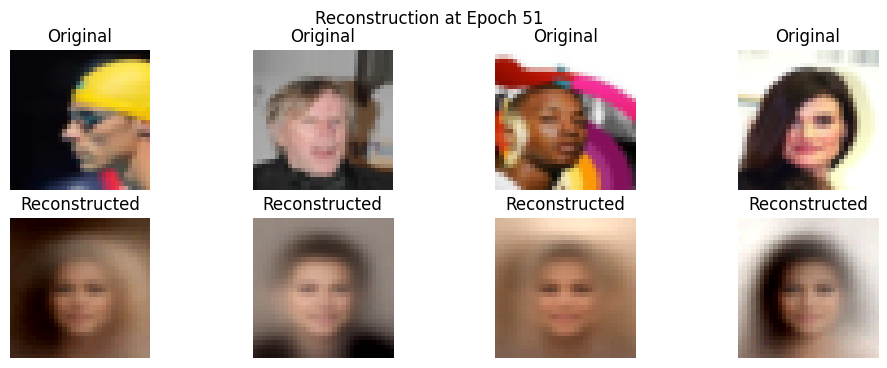

Epoch: 51/75, Avg Loss: 0.11400018472083007, Avg Reconstruction Loss: 0.09840273442147654, Avg KL Loss: 3119.4900381353837, Beta: 5e-06


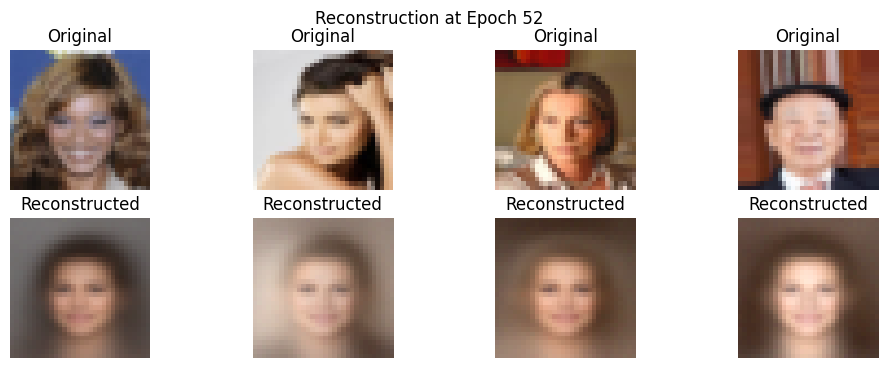

Epoch: 52/75, Avg Loss: 0.11379476165092445, Avg Reconstruction Loss: 0.09833510248344156, Avg KL Loss: 3091.931953913049, Beta: 5e-06


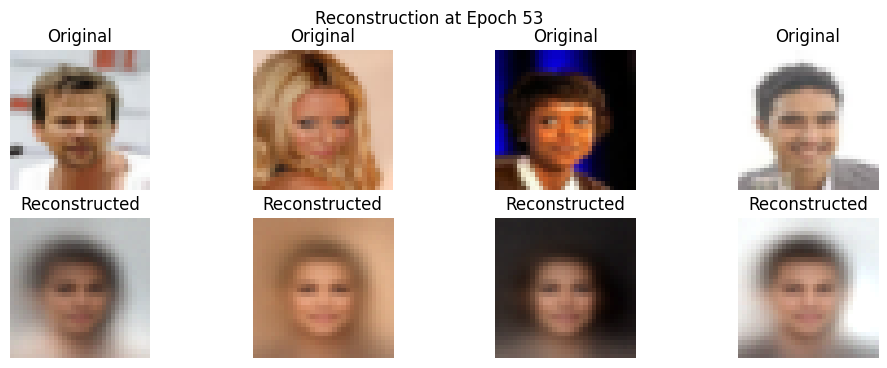

Epoch: 53/75, Avg Loss: 0.11287000681026073, Avg Reconstruction Loss: 0.0972179700679417, Avg KL Loss: 3130.4074425033377, Beta: 5e-06


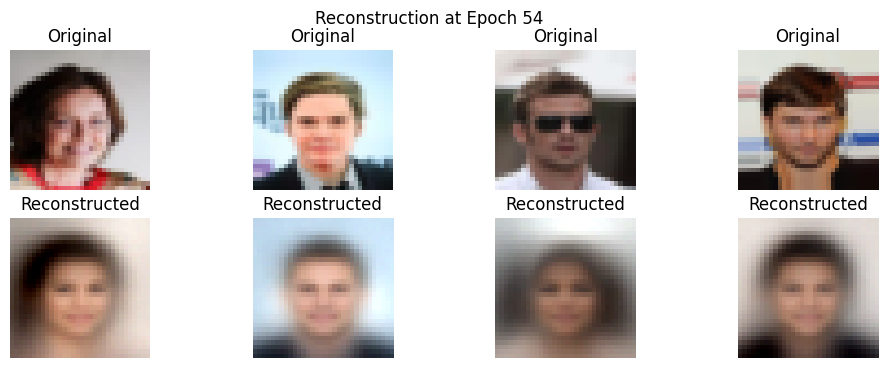

Epoch: 54/75, Avg Loss: 0.11226303677392911, Avg Reconstruction Loss: 0.09674392301070539, Avg KL Loss: 3103.8227925360957, Beta: 5e-06


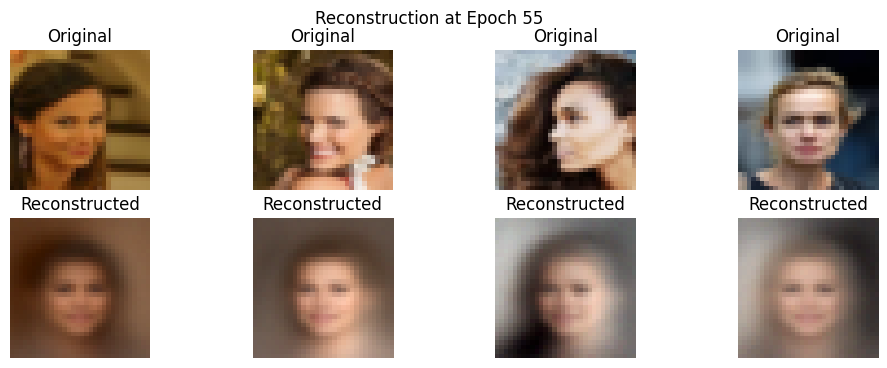

Epoch: 55/75, Avg Loss: 0.11251673885161363, Avg Reconstruction Loss: 0.09704212938682942, Avg KL Loss: 3094.9219592130635, Beta: 5e-06


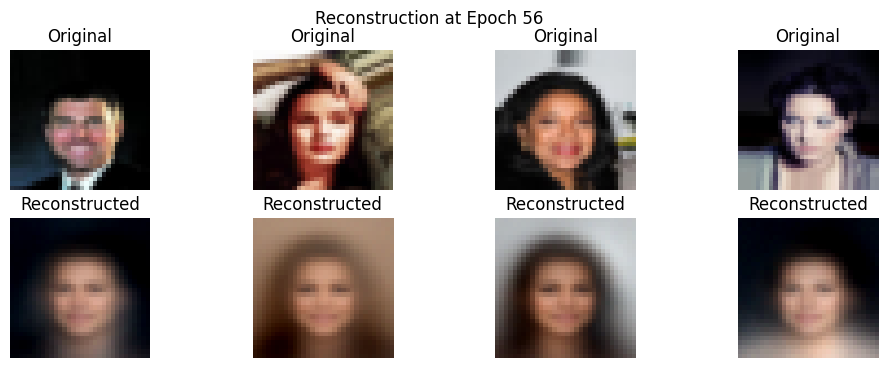

Epoch: 56/75, Avg Loss: 0.11150115992449507, Avg Reconstruction Loss: 0.09592039006043084, Avg KL Loss: 3116.154107588756, Beta: 5e-06


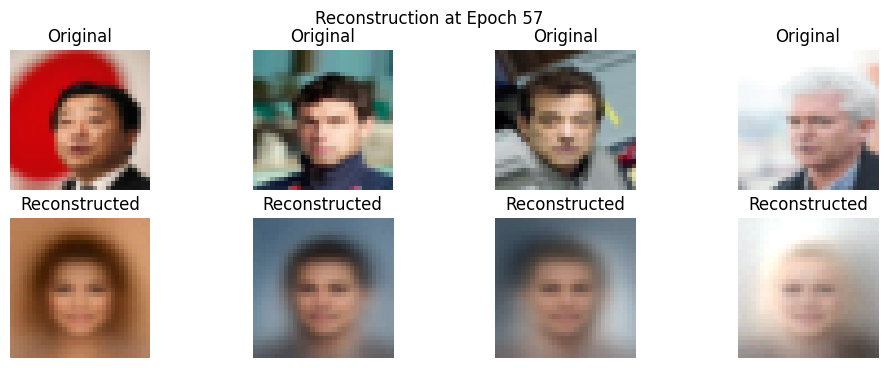

Epoch: 57/75, Avg Loss: 0.1111906751801696, Avg Reconstruction Loss: 0.09554925579813463, Avg KL Loss: 3128.283975335616, Beta: 5e-06


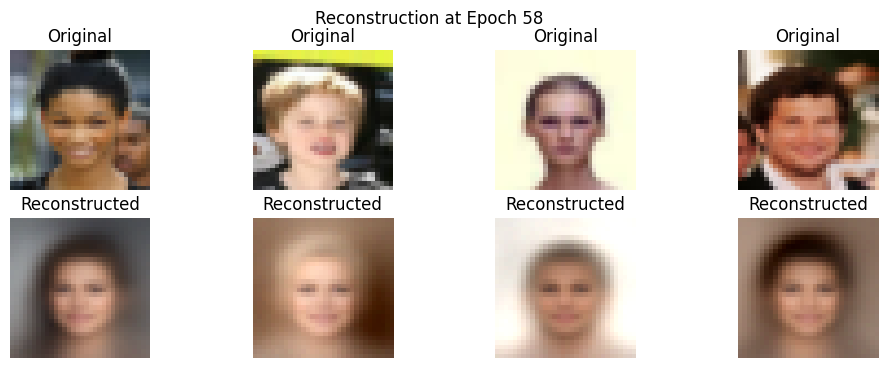

Epoch: 58/75, Avg Loss: 0.11114128499845916, Avg Reconstruction Loss: 0.0955750767754603, Avg KL Loss: 3113.2416489999505, Beta: 5e-06


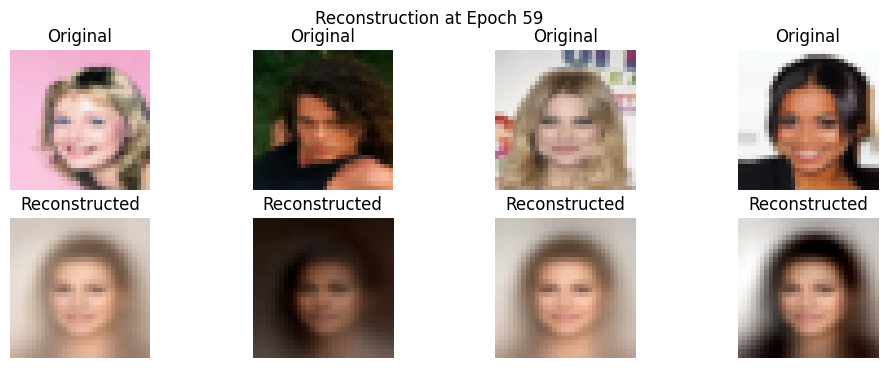

Epoch: 59/75, Avg Loss: 0.11057006935530071, Avg Reconstruction Loss: 0.09498653400547896, Avg KL Loss: 3116.7071981309336, Beta: 5e-06


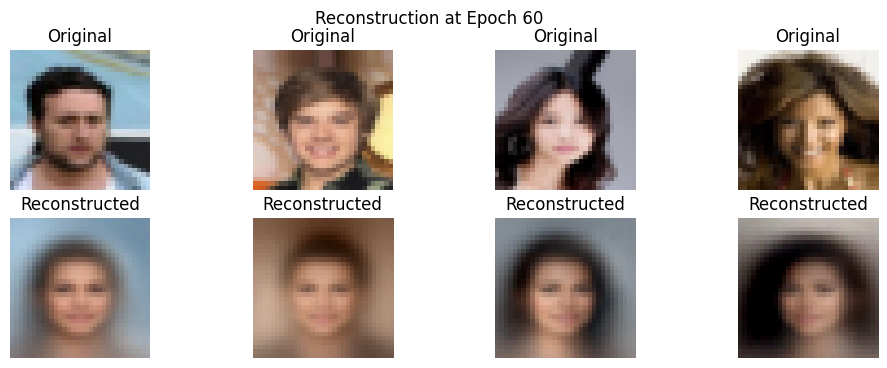

Epoch: 60/75, Avg Loss: 0.11088542008324515, Avg Reconstruction Loss: 0.09512820368326164, Avg KL Loss: 3151.44338950628, Beta: 5e-06


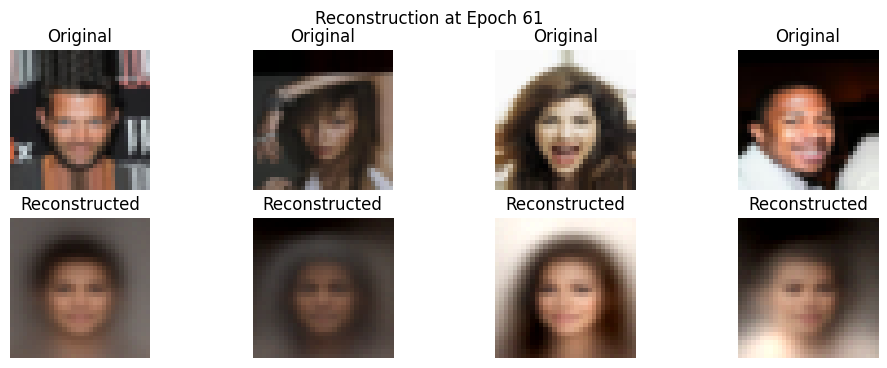

Epoch: 61/75, Avg Loss: 0.11050966683822343, Avg Reconstruction Loss: 0.09476402741444262, Avg KL Loss: 3149.127971407733, Beta: 5e-06


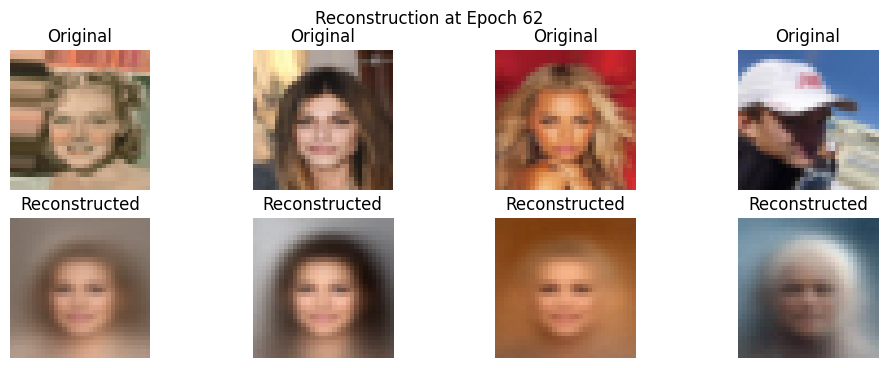

Epoch: 62/75, Avg Loss: 0.11033910494061965, Avg Reconstruction Loss: 0.09450324596483496, Avg KL Loss: 3167.1719391255438, Beta: 5e-06


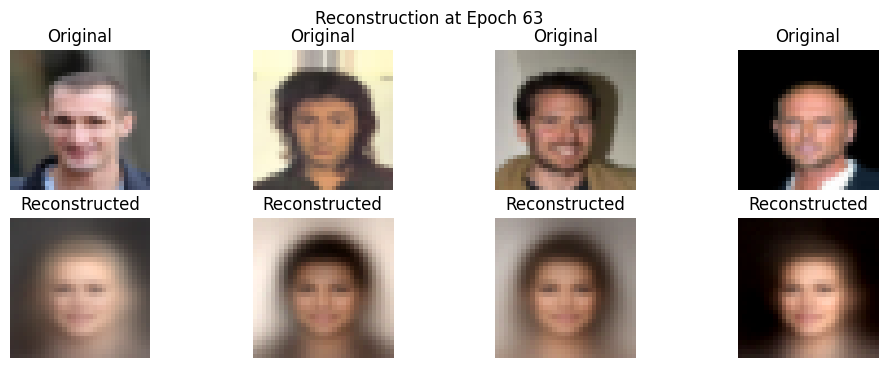

Epoch: 63/75, Avg Loss: 0.11025773526369771, Avg Reconstruction Loss: 0.09417073447493059, Avg KL Loss: 3217.4001781608486, Beta: 5e-06


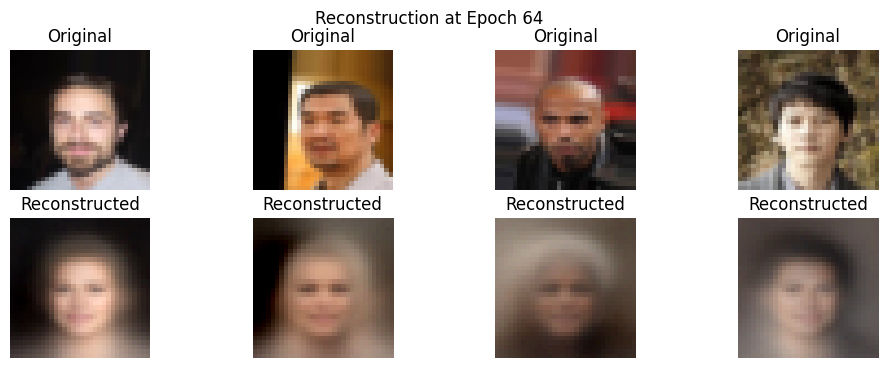

Epoch: 64/75, Avg Loss: 0.10911992918464201, Avg Reconstruction Loss: 0.09319488807946821, Avg KL Loss: 3185.0082482446596, Beta: 5e-06


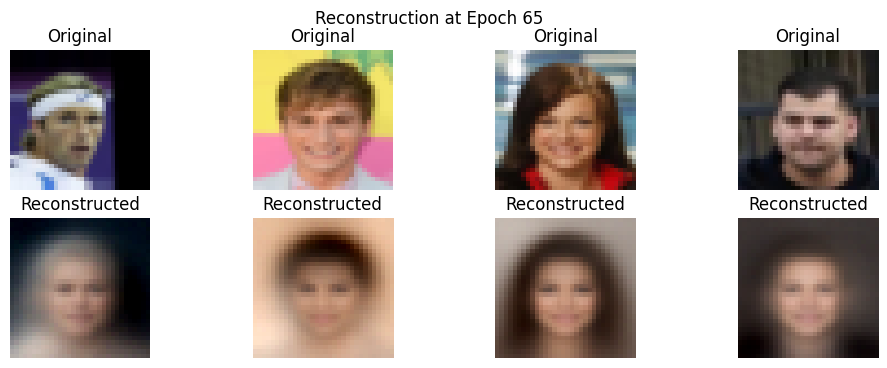

Epoch: 65/75, Avg Loss: 0.10940872255382658, Avg Reconstruction Loss: 0.0932719123703015, Avg KL Loss: 3227.3621501681173, Beta: 5e-06


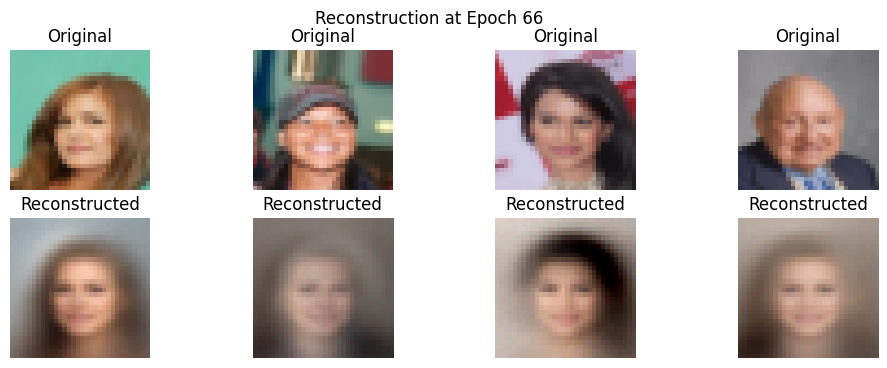

Epoch: 66/75, Avg Loss: 0.10875882462987417, Avg Reconstruction Loss: 0.09265454424710214, Avg KL Loss: 3220.8561246847803, Beta: 5e-06


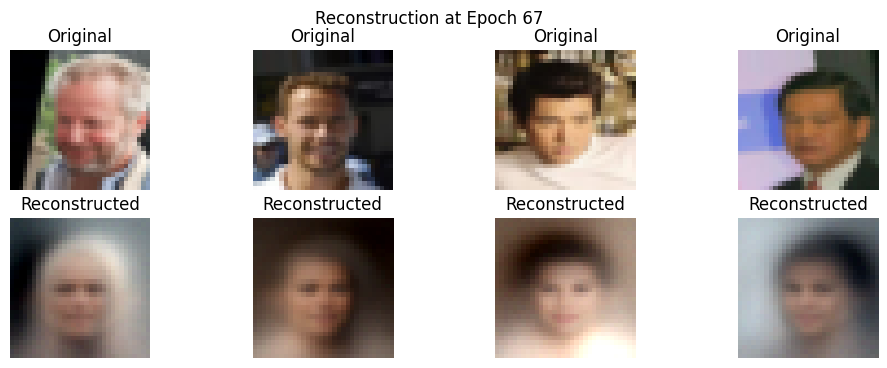

Epoch: 67/75, Avg Loss: 0.10867163340879392, Avg Reconstruction Loss: 0.09232466979117333, Avg KL Loss: 3269.3928446709356, Beta: 5e-06


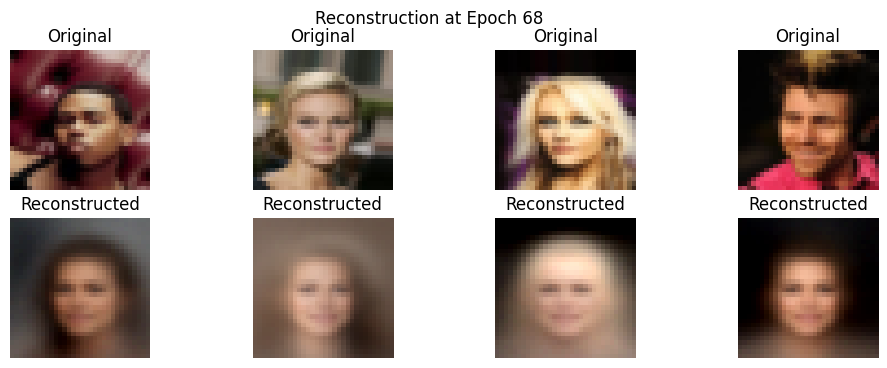

Epoch: 68/75, Avg Loss: 0.10829034711741194, Avg Reconstruction Loss: 0.09213628553891484, Avg KL Loss: 3230.8124389648438, Beta: 5e-06


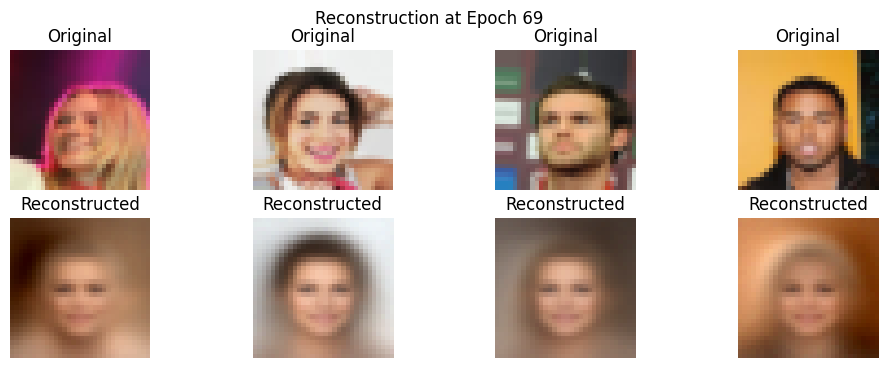

Epoch: 69/75, Avg Loss: 0.10800951700421828, Avg Reconstruction Loss: 0.09159355874680265, Avg KL Loss: 3283.1918427672567, Beta: 5e-06


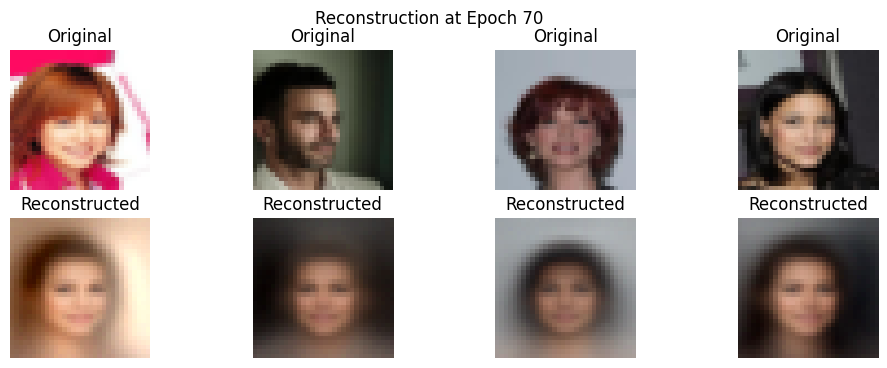

Epoch: 70/75, Avg Loss: 0.10719268740732459, Avg Reconstruction Loss: 0.09098709638737425, Avg KL Loss: 3241.118264500099, Beta: 5e-06


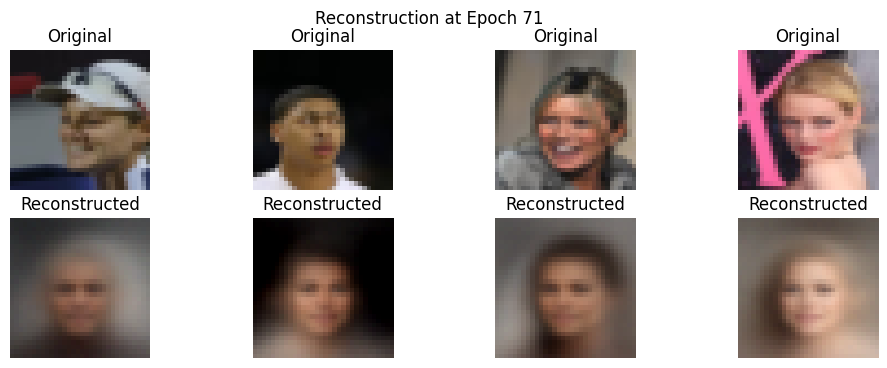

Epoch: 71/75, Avg Loss: 0.10721071215370033, Avg Reconstruction Loss: 0.09072666851025593, Avg KL Loss: 3296.808826301671, Beta: 5e-06


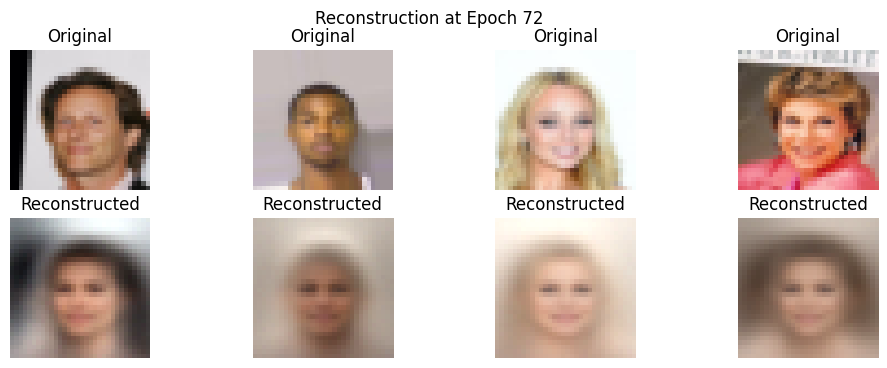

Epoch: 72/75, Avg Loss: 0.10695594718939141, Avg Reconstruction Loss: 0.09055221495749075, Avg KL Loss: 3280.7466137077236, Beta: 5e-06


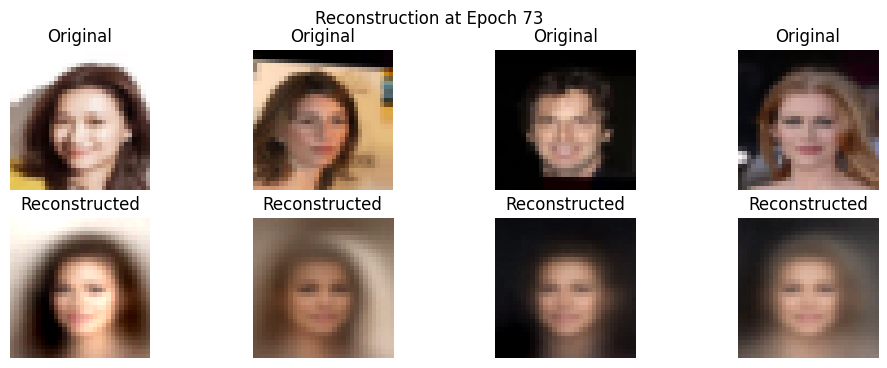

Epoch: 73/75, Avg Loss: 0.10677568378705013, Avg Reconstruction Loss: 0.09010860908635054, Avg KL Loss: 3333.414990775193, Beta: 5e-06


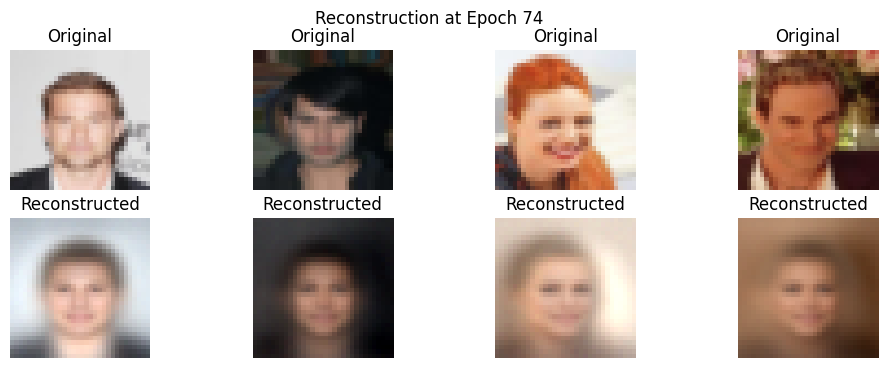

Epoch: 74/75, Avg Loss: 0.10699625784837746, Avg Reconstruction Loss: 0.09029040693105021, Avg KL Loss: 3341.1702482971964, Beta: 5e-06


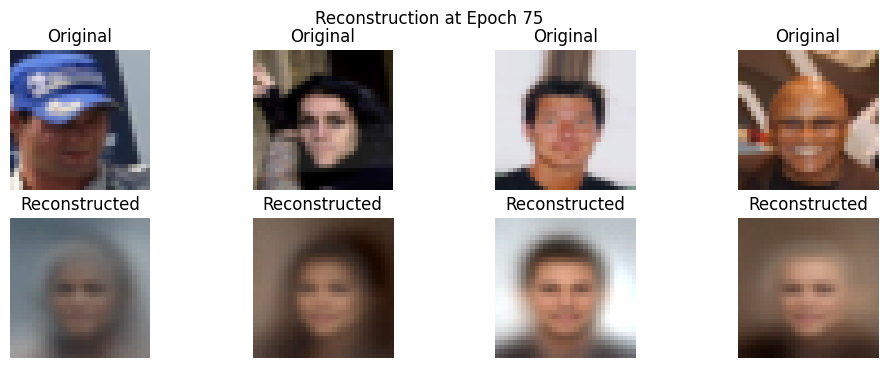

Epoch: 75/75, Avg Loss: 0.10644256823425051, Avg Reconstruction Loss: 0.0897482729788068, Avg KL Loss: 3338.8591926671284, Beta: 5e-06


In [ ]:
# Train PatchVAE with Patch Size 32
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
resume_training = False
checkpoint_path = 'best_vae_model.pth'
num_epochs = 75


vae = PatchVAE(patch_size=32, img_channels=3, img_size=32, embed_dim=64, latent_dim=128).to(device)
optimizer = optim.Adam(vae.parameters(), lr=1e-4)

if resume_training:
    vae.load_state_dict(torch.load(checkpoint_path))

losses, recon_losses, kl_losses = train_patchvae(vae, dataloader, optimizer, device, epochs=num_epochs, checkpoint_path='best_vae_model.pth')

samples min: -0.70517325
samples max: 0.6029085


<ipython-input-11-fcee18eaa334>:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  vae.load_state_dict(torch.load('/content/' + checkpoint_path))


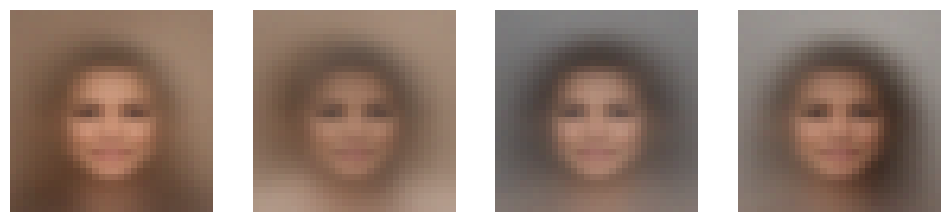

In [ ]:
# Generate images by sampling from latent space for patch size 32
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
checkpoint_path = 'best_vae_model.pth'
vae = PatchVAE(patch_size=32, img_channels=3, img_size=32, embed_dim=64, latent_dim=128).to(device)
vae.load_state_dict(torch.load('/content/' + checkpoint_path))
vae.eval()

samples = vae.sample(4)
samples = samples.permute(0, 2, 3, 1).detach().cpu().numpy()
print("samples min:", np.min(samples))
print("samples max:", np.max(samples))

samples = (samples + 1) / 2
samples = np.clip(samples, 0, 1)
fig, axes = plt.subplots(1, 4, figsize=(12, 4))
for i in range(4):
    axes[i].imshow(samples[i])
    axes[i].axis('off')

### Implement Noise Scheduler


You will implement parts of the [DDPM scheduler](https://huggingface.co/docs/diffusers/en/api/schedulers/ddpm) using the following steps.

1. Define $\beta$ as a tensor of $N$ linearly spaced values between $\beta_{start}$ and $\beta_{end}$.

$$\beta = \left[\beta_{\text{start}}, \beta_{\text{start}} + \frac{\beta_{\text{end}} - \beta_{\text{start}}}{N - 1}, \ldots, \beta_{\text{end}}\right]$$

2. Calculate $\sigma$ using the cumulative product of $1 - \beta$.

$$\sigma = \sqrt{\frac{1}{\prod_{i=0}^{N-1}(1 - \beta_i)} - 1}$$

In [13]:
class DDPMScheduler:
    def __init__(self, N: int=1000, beta_start: float=0.0001, beta_end: float=0.02):
        ######## BEGIN TODO ########
        self.betas = torch.linspace(beta_start, beta_end, N)
        self.sigmas = torch.sqrt((1/torch.cumprod((1-self.betas), dim=0)) - 1)
        ######## END TODO ########

    def __getitem__(self, i) -> torch.FloatTensor:
        return self.sigmas[i]

    def __len__(self) -> int:
        return len(self.sigmas)

    def sample_sigmas(self, steps: int) -> torch.FloatTensor:
        indices = list((len(self) * (1 - np.arange(0, steps)/steps)).round().astype(np.int64) - 1)
        return self[indices + [0]]

    def sample_batch(self, x0: torch.FloatTensor) -> torch.FloatTensor:
        batchsize = x0.shape[0]
        return self[torch.randint(len(self), (batchsize,))].to(x0)

### Implement DiT Block

You will implement the DiT Block with adaLN-Zero, as illustrated in Figure 3 of the Diffusion Transformer paper. Specifically, you will need to implement Multi-Head Self-Attention, Modulation, and Adaptive Layer Norm for the DiT Block, and we will provide you with the code structure.

In [14]:
class Attention(nn.Module):
    def __init__(self, head_dim, num_heads=8, qkv_bias=False):
        super().__init__()
        """
        Inputs:
            head_dim (int): Dimensionality of each attention head
            num_heads (int): Number of attention heads
            qkv_bias (bool): Whether to include bias in the QKV layer
        """
        self.num_heads = num_heads
        self.head_dim = head_dim

        ######## BEGIN TODO ########
        self.embed_size = head_dim * num_heads

        self.q = nn.Linear(self.embed_size, self.embed_size, bias=qkv_bias)
        self.k = nn.Linear(self.embed_size, self.embed_size, bias=qkv_bias)
        self.v = nn.Linear(self.embed_size, self.embed_size, bias=qkv_bias)

        self.proj = nn.Linear(self.embed_size, self.embed_size)
        ######## END TODO #######


    def forward(self, x):
        """
        Inputs:
            x (Tensor): Input tensor of shape (B, N, D), where:
                - B: Batch size
                - N: Number of tokens
                - D: Dimensionality (D = num_heads * head_dim)

        Returns:
            Output tensor of shape (B, N, D) after applying attention and projection

        You may use F.scaled_dot_product_attention
        """
        # (B, N, D) -> (B, N, D)
        # N = H * W / patch_size**2, D = num_heads * head_dim

        ######## BEGIN TODO ########
        B, N, D = x.shape

        Q = self.q(x)
        K = self.k(x)
        V = self.v(x)

        Q = Q.view(B, N, self.num_heads, self.head_dim).transpose(1, 2)
        K = K.view(B, N, self.num_heads, self.head_dim).transpose(1, 2)
        V = V.view(B, N, self.num_heads, self.head_dim).transpose(1, 2)

        attention_output = F.scaled_dot_product_attention(Q, K, V)

        attention_output = attention_output.transpose(1, 2).contiguous().view(B, N, self.embed_size)

        output = self.proj(attention_output)

        return output
        ######## END TODO #######

In [15]:
class Modulation(nn.Module):
    def __init__(self, dim, n):
        super().__init__()
        """
        1. self.proj is constructed as a sequence of operations:
            - A SiLU (Sigmoid-Weighted Linear Unit) activation is applied to the input
            - A linear layer transforms the input from dim to n * dim
        2. The last layer's weights and biases are initialized to zero
        """
        ######## BEGIN TODO ########
        self.n = n
        self.proj = nn.Sequential(
            nn.SiLU(),
            nn.Linear(dim, n * dim)
        )
        nn.init.zeros_(self.proj[1].weight)
        nn.init.zeros_(self.proj[1].bias)
        ######## END TODO #######


    def forward(self, y):
        """
        1. self.proj(y) applies the defined projection, resulting in n * dim
        2. Split the output tensor into n equal parts along dimension 1
        3. Each chunk `m` has the shape dim and represents a separate modulation component
        4. m.unsqueeze(1) adds a new dimension at index 1, necessary for future computations
        """
        ######## BEGIN TODO ########
        proj_output = self.proj(y)
        chunks = torch.chunk(proj_output, chunks=self.n, dim=1)
        return [m.unsqueeze(1) for m in chunks]
        ######## END TODO #######


class AdaptiveLayerNorm(nn.LayerNorm):
    def __init__(self, dim, **kwargs):
        super().__init__(dim, **kwargs)
        """
        Initialize an instance of Modulation with dim and n = 2
        """
        ######## BEGIN TODO ########
        self.modulation = Modulation(dim=dim, n=2)
        self.layer_norm = nn.LayerNorm(dim)
        ######## END TODO #######


    def forward(self, x, y):
        """
        1. Obtain (scale, shift) tensors from applying modulation on input y
        2. Apply LayerNorm on input x, which we will denote as LayerNorm(x)
        3. Compute AdaptiveLayerNorm as `LayerNorm(x) * (1 + scale) + shift`
        """
        ######## BEGIN TODO ########
        scale, shift = self.modulation.forward(y)
        return self.layer_norm(x) * (1 + scale) + shift
        ######## END TODO #######

In [16]:
class DiTBlock(nn.Module):
    def __init__(self, head_dim, num_heads, mlp_ratio=4.0):
        super().__init__()
        dim = head_dim * num_heads
        mlp_hidden_dim = int(dim * mlp_ratio)

        self.norm1 = AdaptiveLayerNorm(dim, elementwise_affine=False, eps=1e-6)
        self.attn = Attention(head_dim, num_heads=num_heads, qkv_bias=True)
        self.norm2 = AdaptiveLayerNorm(dim, elementwise_affine=False, eps=1e-6)
        self.mlp = nn.Sequential(
            nn.Linear(dim, mlp_hidden_dim, bias=True),
            nn.GELU(approximate="tanh"),
            nn.Linear(mlp_hidden_dim, dim, bias=True),
        )
        self.scale_modulation = Modulation(dim, 2)

    def forward(self, x, y):
        # (B, N, D), (B, D) -> (B, N, D)
        # N = H * W / patch_size**2, D = num_heads * head_dim
        gate_msa, gate_mlp = self.scale_modulation(y)
        x = x + gate_msa * self.attn(self.norm1(x, y))
        x = x + gate_mlp * self.mlp(self.norm2(x, y))
        return x

In [17]:
def sigma_log_scale(batches, sigma, scaling_factor):
    #print("sigma shape = " + str(sigma.shape))
    if sigma.shape == torch.Size([]):
        sigma = sigma.unsqueeze(0).repeat(batches)
    else:
        assert sigma.shape == (batches,), 'sigma.shape == [] or [batches]!'
    return torch.log(sigma)*scaling_factor


def get_sigma_embeds(batches, sigma, scaling_factor=0.5):
    s = sigma_log_scale(batches, sigma, scaling_factor).unsqueeze(1)
    return torch.cat([torch.sin(s), torch.cos(s)], dim=1)


class SigmaEmbedderSinCos(nn.Module):
    def __init__(self, hidden_size, scaling_factor=0.5):
        super().__init__()
        ######## BEGIN TODO ########
        self.hidden_size = hidden_size
        self.scaling_factor = scaling_factor
        self.mlp = nn.Sequential(
            nn.Linear(2, hidden_size, bias=True),
            nn.GELU(approximate="tanh"),
            nn.Linear(hidden_size, hidden_size, bias=True),
        )
        ######## END TODO #######


    def forward(self, batches, sigma):
        """

        """
        ######## BEGIN TODO ########
        sigma_embeds = get_sigma_embeds(batches, sigma.squeeze(), self.scaling_factor)
        return self.mlp(sigma_embeds)
        ######## END TODO #######

### Helper Functions

We provide you with the following helper functions for training DiT. No implementation needed.

In [18]:
def get_pos_embed(in_dim, patch_size, dim, N=10000):
    n = in_dim // patch_size                                          # Number of patches per side
    assert dim % 4 == 0, 'Embedding dimension must be multiple of 4!'
    omega = 1/N**np.linspace(0, 1, dim // 4, endpoint=False)          # [dim/4]
    freqs = np.outer(np.arange(n), omega)                             # [n, dim/4]
    embeds = repeat(np.stack([np.sin(freqs), np.cos(freqs)]),
                       ' b n d -> b n k d', k=n)                      # [2, n, n, dim/4]
    embeds_2d = np.concatenate([
        rearrange(embeds, 'b n k d -> (k n) (b d)'),                  # [n*n, dim/2]
        rearrange(embeds, 'b n k d -> (n k) (b d)'),                  # [n*n, dim/2]
    ], axis=1)                                                        # [n*n, dim]
    return nn.Parameter(torch.tensor(embeds_2d).float().unsqueeze(0), # [1, n*n, dim]
                        requires_grad=False)

In [19]:
class ModelMixin:
    def rand_input(self, batchsize):
        assert hasattr(self, 'input_dims'), 'Model must have "input_dims" attribute!'
        return torch.randn((batchsize,) + self.input_dims)

    # Currently predicts eps, override following methods to predict, for example, x0
    def get_loss(eps, x_out):
        return nn.MSELoss()(eps, x_out)

    def predict_eps(self, x, sigma):
        return self(x, sigma)

### Implement Entire DiT Model

In [20]:
class DiT(nn.Module, ModelMixin):
    def __init__(self, in_dim=32, channels=3, patch_size=2, depth=12,
                 head_dim=64, num_heads=6, mlp_ratio=4.0, sig_embed_factor=0.5,
                 sig_embed_class=None):
        super().__init__()

        self.in_dim = in_dim
        self.channels = channels
        self.patch_size = patch_size
        self.input_dims = (channels, in_dim, in_dim)

        dim = head_dim * num_heads

        self.pos_embed = get_pos_embed(in_dim, patch_size, dim)
        self.x_embed = PatchEmbed(img_size=in_dim, patch_size=patch_size, stride=patch_size,
                                      channels=channels, embed_dim=dim, bias=True)
        self.sig_embed = (sig_embed_class or SigmaEmbedderSinCos)(
            dim, scaling_factor=sig_embed_factor
        )

        self.blocks = nn.ModuleList([
            DiTBlock(head_dim, num_heads, mlp_ratio=mlp_ratio) for _ in range(depth)
        ])

        self.final_norm = AdaptiveLayerNorm(dim, elementwise_affine=False, eps=1e-6)
        self.final_linear = nn.Linear(dim, 768)
        self.init()


    def init(self):
        # Initialize transformer layers
        def _basic_init(module):
            if isinstance(module, nn.Linear):
                torch.nn.init.xavier_uniform_(module.weight)
                if module.bias is not None:
                    nn.init.constant_(module.bias, 0)
        self.apply(_basic_init)

        # Initialize sigma embedding MLP
        nn.init.normal_(self.sig_embed.mlp[0].weight, std=0.02)
        nn.init.normal_(self.sig_embed.mlp[2].weight, std=0.02)

        # Zero-out output layers
        nn.init.constant_(self.final_linear.weight, 0)
        nn.init.constant_(self.final_linear.bias, 0)


    def unpatchify(self, x):
        """
        Input x has size [B, N, (patch_size)**2 * C] where N is number of patches

        Return image with size [B, C, H, W]
        """
        # (B, N, patchsize**2 * channels) -> (B, channels, H, W)
        patches = self.in_dim // self.patch_size

        ######## BEGIN TODO ########
        B, N, D = x.shape
        x = self.x_embed.reconstruct(x, img_size=32)
        return x
        ######## END TODO ########


    def forward(self, x, sigma):

        ######## BEGIN TODO ########
        batch_size = x.shape[0]
        x = self.x_embed(x)
        x = x + self.pos_embed
        sigma = self.sig_embed(x.shape[0], sigma)
        for block in self.blocks:
            x = block(x, sigma)
        x = self.final_norm(x, sigma)
        x = self.final_linear(x)
        x = self.unpatchify(x)
        return x
        ######## END TODO ########

### Train DiT

Here, we provide the pl LightningModule class for you. You only need to implement the `sample_image` function to generate new images and `training_step` function. You should use PatchVAE to generate latent encodings and train diffusion model on the latent encodings. In `sample_image` function, you should use DiT to generate latent encoding and use PatchVAE decoder to decode. The PatchVAE model should be fixed during training.

Hint: use `get_loss` and `generate_train_sample` functions !

<ipython-input-18-0e29024655fc>:134: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.patch_vae.load_state_dict(torch.load("/content/best_vae_model.pth"))
INFO:pytorch_li

Training: |          | 0/? [00:00<?, ?it/s]

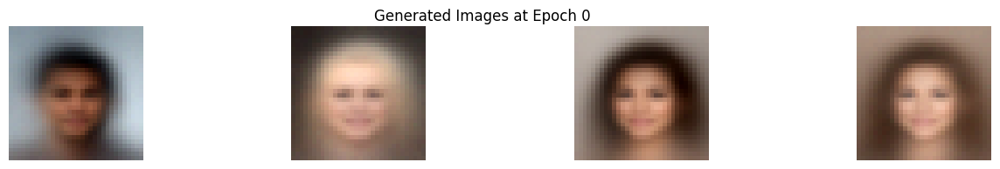

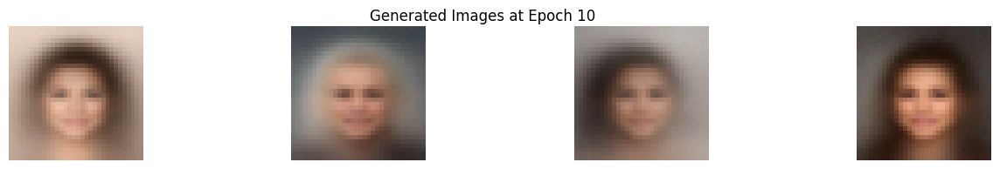

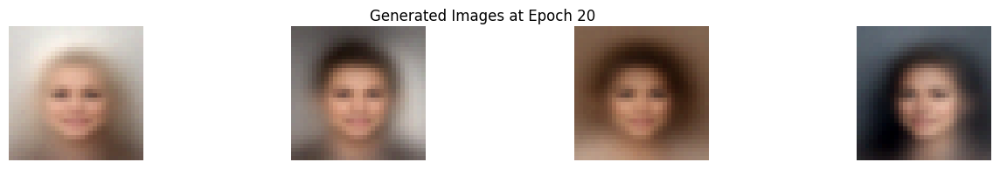

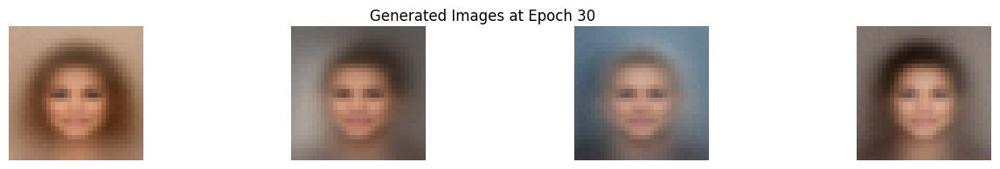

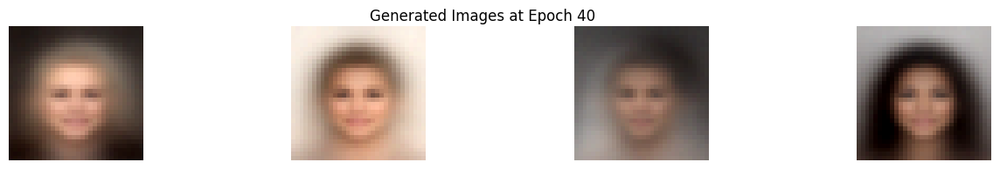

...

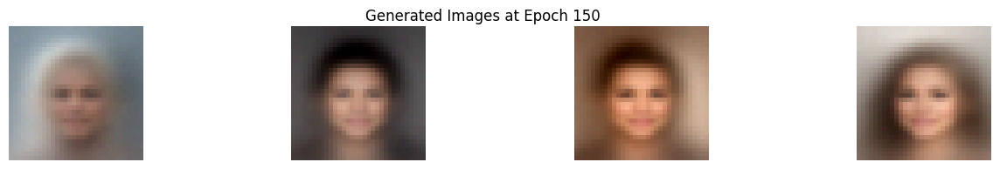

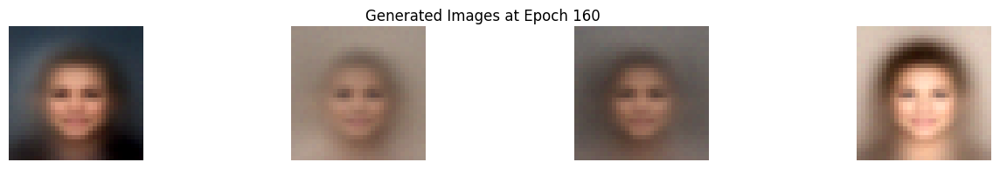

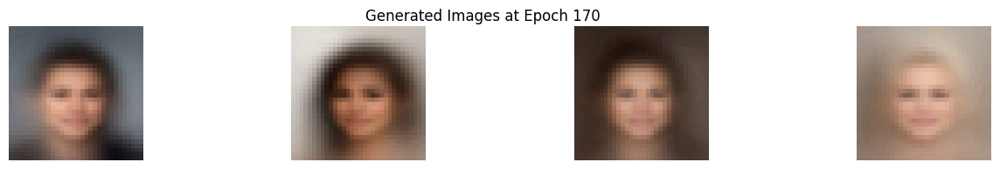

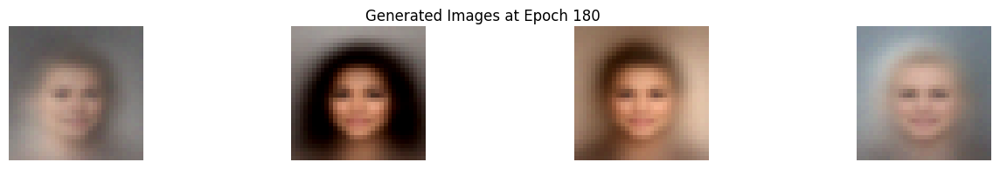

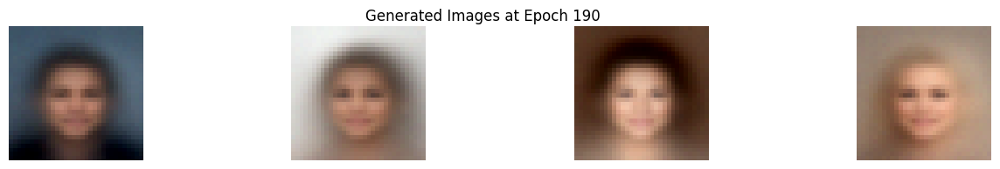

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=200` reached.


In [ ]:
from re import X

class DiffusionModel(pl.LightningModule):
    def __init__(self):
        super().__init__()
        # patch_size=8, img_channels=3, img_size=32, embed_dim=64, latent_dim=128

        self.img_shape = 32
        self.vae_patch_size = 32 # 8
        self.vae_stride = 32 # 8
        self.latent_dim = 128 # 128

        # VAE Encoder for latent space
        self.patch_vae = PatchVAE(patch_size=self.vae_patch_size, img_channels=3, stride=self.vae_stride,
                                      img_size=self.img_shape, embed_dim=64, latent_dim=self.latent_dim)

        self.in_dim = (self.img_shape - self.vae_patch_size) // self.vae_stride + 1

        # for VAE latent
        self.model = DiT(in_dim=self.in_dim, channels=self.latent_dim,
                          patch_size=1, depth=6,
                          head_dim=self.latent_dim, num_heads=6, mlp_ratio=4.0)

        self.schedule = DDPMScheduler(beta_start=0.0001, beta_end=0.02, N=1000)

        self.losses = []

    def on_training_epoch_start(self):
        """ Fix patch vae """
        for param in self.patch_vae.parameters():
            param.requires_grad = False

    def generate_train_sample(self, x0: torch.FloatTensor):
        """ Generate train samples

        Args:
            x0: torch.Tensor in shape ()
        """
        sigma = self.schedule.sample_batch(x0)
        while len(sigma.shape) < len(x0.shape):
            sigma = sigma.unsqueeze(-1)
        eps = torch.randn_like(x0)
        return sigma, eps

    # provide here
    def training_step(self, batch, batch_idx):
        """ Training Step """
        x0 = batch

        ### YOUR CODE BEGINS ###
        self.model.train()
        sigma, eps = self.generate_train_sample(x0)
        with torch.no_grad():
            x0_patch = self.patch_vae.patch_embed.forward(x0 + sigma * eps)
            x0_latent = self.patch_vae.encode(x0_patch)[0]
        x_out = self.model(x0_latent, sigma)
        predicted_eps_patches = self.patch_vae.decode(x_out)
        predicted_eps = self.patch_vae.patch_embed.reconstruct(predicted_eps_patches, self.img_shape)
        predicted_eps = torch.nan_to_num(predicted_eps, nan=0.0)
        loss = ModelMixin.get_loss(eps, predicted_eps)
        ## YOUR CODE ENDS ###

        self.log('train_loss', loss, on_step=False, on_epoch=True, prog_bar=True)
        return loss

    def sample_image(self, gam = 1.6, mu = 0., xt = None, batchsize = 4):
        """ Function to generate image samples

        Args:
            gam: float, suggested to use gam >= 1
            mu: float, requires mu in [0, 1)
            xt: torch.Tensor, optional, default None
            batchsize: int, optional, default 4
        Return:
            torch.Tensor in shape (batchsize, 1, 28, 28)
        """
        sigmas = self.schedule.sample_sigmas(20)

        if xt is None:
            xt = self.model.rand_input(batchsize).to(self.device) * sigmas[0]
        else:
            batchsize = xt.shape[0]

        ######### BEGIN TODO ########
        xt = xt.cuda()
        sigmas = sigmas.cuda()
        self.model.eval()
        for i in range(1, len(sigmas)):
            eps = self.model(xt, sigmas[i])
            if i == 1:
                eps_avg = eps
            else:
                eps_avg = eps * gam + eps_previous * (1-gam)
            sigma_previous = (sigmas[i-1]/sigmas[i]**mu)**(1/(1-mu))
            eta = torch.sqrt(sigmas[i-1]**2 - sigma_previous**2)
            xt = xt - (sigmas[i] - sigma_previous) * eps_avg + eta * self.model.rand_input(batchsize).cuda()
            eps_previous = eps
        recon_image_patches = self.patch_vae.decode(xt)
        recon_image = self.patch_vae.patch_embed.reconstruct(recon_image_patches, self.img_shape)
        ######## END TODO ########

        return recon_image

    def on_train_epoch_end(self) -> None:

        epoch_loss = trainer.callback_metrics.get('train_loss')
        if epoch_loss is not None:
            self.losses.append(epoch_loss.cpu().item())

        if self.current_epoch % 10 == 0:
            batchsize = 4
            imgs = self.sample_image(batchsize=batchsize)

            # Convert from [-1, 1] to [0, 1]
            imgs = (imgs + 1) / 2

            fig, axes = plt.subplots(1, batchsize, figsize=(batchsize*4, 2))
            for i in range(batchsize):
                axes[i].imshow(imgs[i].permute(1, 2, 0).detach().cpu().numpy())
                axes[i].axis('off')

            # add title
            fig.suptitle(f'Generated Images at Epoch {self.current_epoch}')
            fig.savefig(f"epoch_{self.current_epoch}.png")
            plt.show()
            plt.close()

    def configure_optimizers(self):
        return torch.optim.Adam(self.model.parameters(), lr=1e-3)

%matplotlib inline
model = DiffusionModel()
# load patch vae
model.patch_vae.load_state_dict(torch.load("/content/best_vae_model.pth"))
trainer = pl.Trainer(max_epochs=200)
trainer.fit(model, dataloader)
torch.save(model.state_dict(), "model.pt")

### Sample and Evaluate DiT

In addition to implementing the code above, please complete the following:
1. Plot loss over epochs. Show that loss decreases over epochs.
2. Generate new samples using your DiT checkpoint. Show that samples look reasonable.

_The plot of the loss over the epochs is shown below. The loss initially decreases quickly during the first 25 epochs and then flattens out and decreases slowly over the remaining 175 epochs. Note that due to the nature of the Pytorch Lightning code, the loss is recorded at the end of each epoch. Therefore, the loss reported for epoch 0 is actually the loss after the model has been training for one full epoch, and thus is significantly lower than it was at the beginning of the first epoch when the model was initialized. If the loss was reported at the beginning of each epoch, it would be much higher at epoch 0._

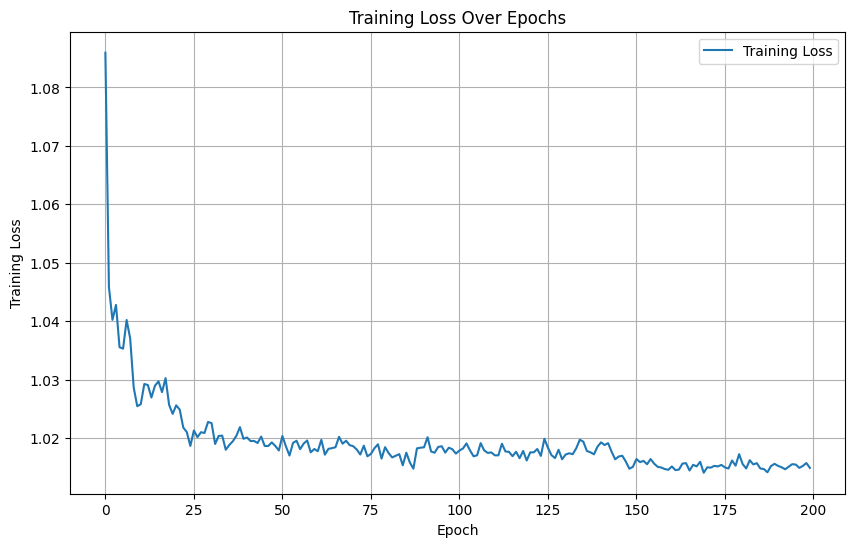

In [ ]:
import matplotlib.pyplot as plt

# Plot training loss
plt.figure(figsize=(10, 6))
plt.plot(model.losses, label='Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Training Loss')
plt.title('Training Loss Over Epochs')
plt.legend()
plt.grid()
plt.show()

_Images generated by the Diffusion Transformer model can be seen in the example images below, as well as the samples generated during the training process, as seen above. In both sets of generated images, we can see that the Diffusion Transformer improves greatly on the purely VAE based model, as the images generated by the Diffusion Transformer not only display realistic human faces, but also exhibit variety in characteristics such as the hair color, skin color, and gender of the depicted person, which the VAE based model failed to do (as its generated images all looked very similar). While there are still more images of female faces than male faces, the gender balance is a substantial improvement over that of the VAE based model, in which all of the generated faces appear feminine. The generated images also exhibit variety in the color of their backgrounds. Moreover, the structure of the images has also improved, as the features of the faces are sharp and well-defined, while they were blurry for the VAE based model. Overall, not only has the Diffusion Transformer learned to generate high quality images of human faces, exceeding the quality of those generated using the VAE based model, but strong degree of variety in the images generated by the Diffusion Transformer is indicative of its lesser tendency towards mode collapse._

<ipython-input-62-e331ccca3ccf>:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("/content/model.pt"))
  0%|          | 0/501 [00:00<?, ?it

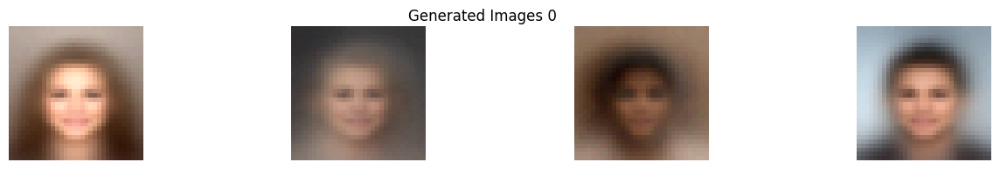

  0%|          | 1/501 [00:00<02:24,  3.46it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


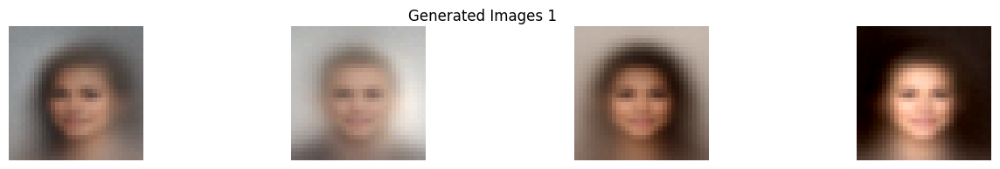

  0%|          | 2/501 [00:01<05:47,  1.44it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


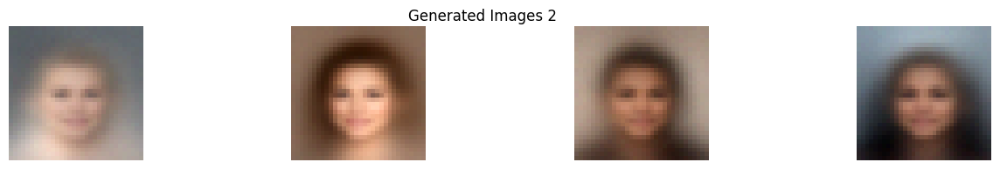

  1%|          | 3/501 [00:01<04:23,  1.89it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


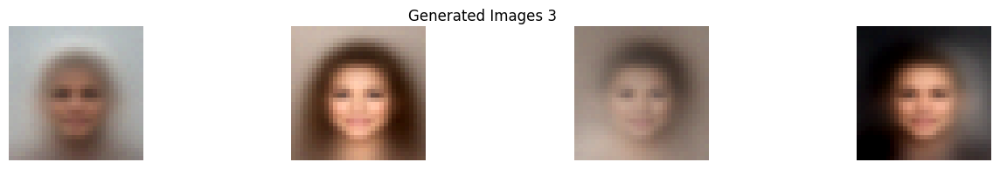

  1%|          | 4/501 [00:02<05:00,  1.65it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


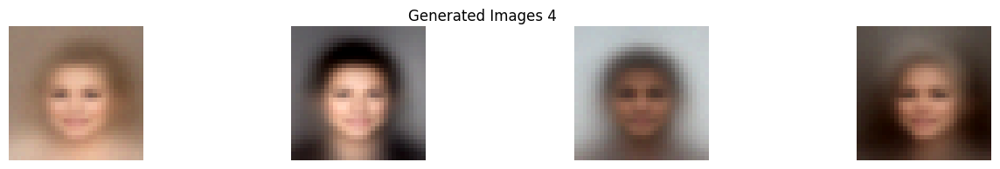

  1%|          | 5/501 [00:02<04:46,  1.73it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


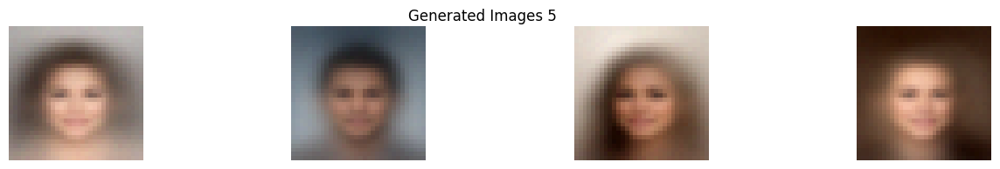

  1%|          | 6/501 [00:03<04:02,  2.04it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


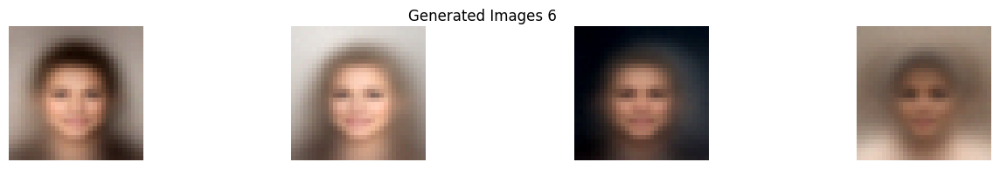

  1%|▏         | 7/501 [00:03<03:33,  2.31it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


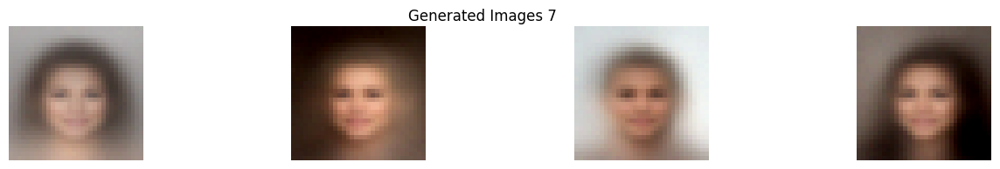

  2%|▏         | 8/501 [00:03<03:11,  2.57it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


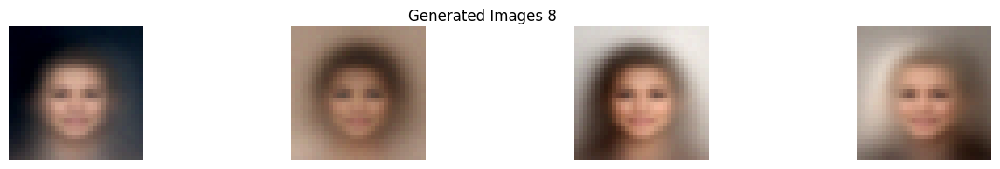

  2%|▏         | 9/501 [00:04<02:56,  2.78it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


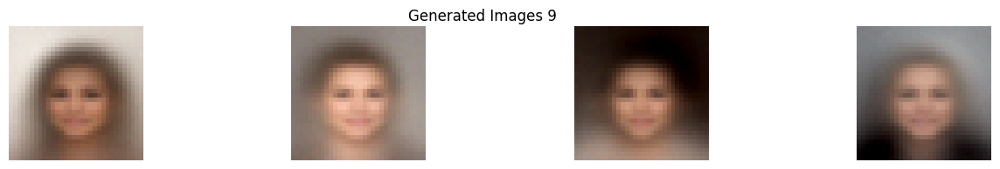

  2%|▏         | 10/501 [00:04<02:48,  2.91it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


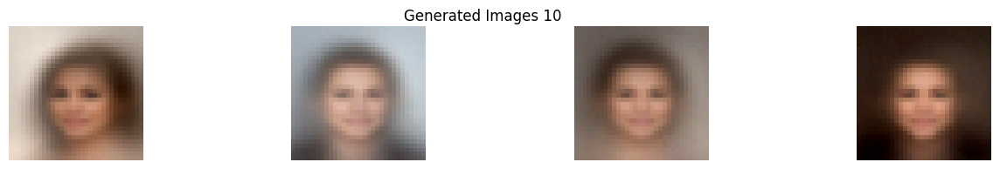

  2%|▏         | 11/501 [00:04<02:41,  3.04it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


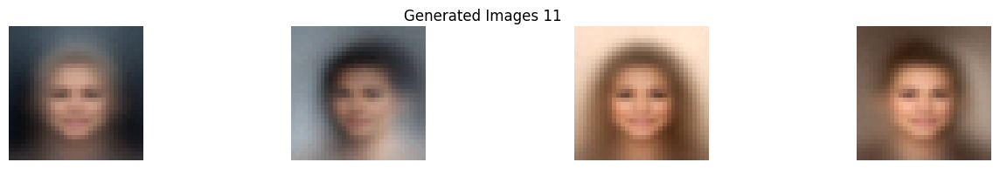

  2%|▏         | 12/501 [00:04<02:33,  3.18it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


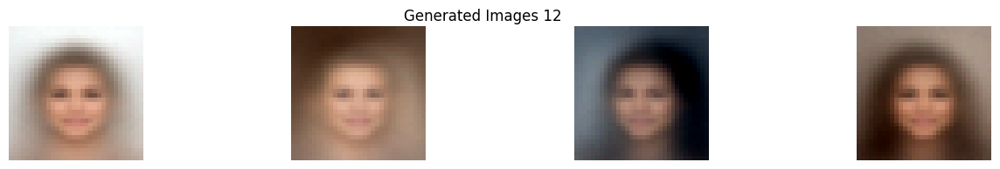

  3%|▎         | 13/501 [00:05<02:31,  3.23it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


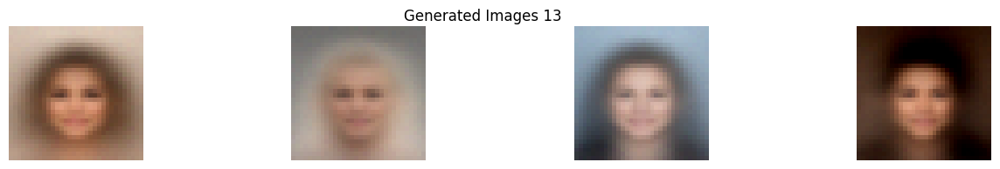

  3%|▎         | 14/501 [00:05<02:32,  3.20it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


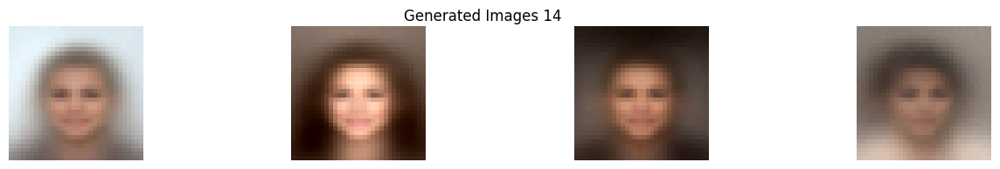

  3%|▎         | 15/501 [00:05<02:28,  3.27it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


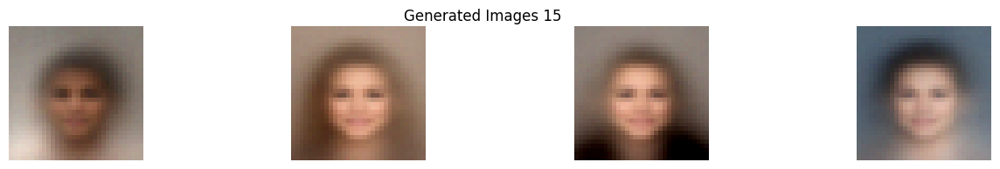

  3%|▎         | 16/501 [00:06<02:29,  3.24it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


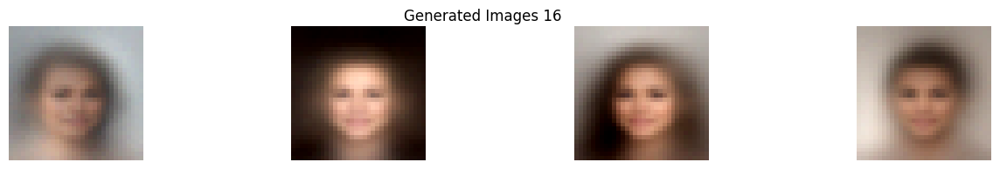

  3%|▎         | 17/501 [00:06<02:28,  3.25it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


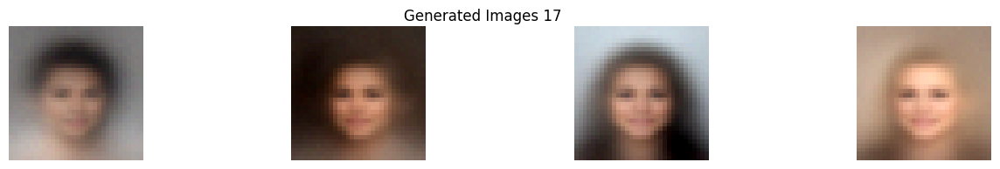

  4%|▎         | 18/501 [00:06<02:25,  3.33it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


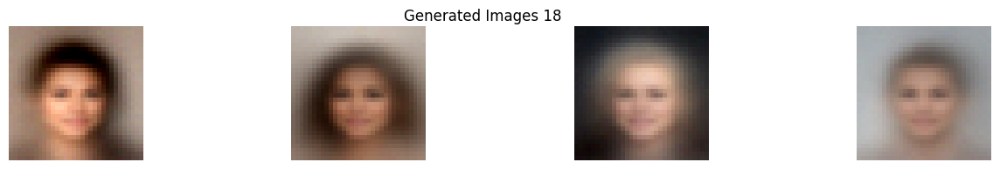

  4%|▍         | 19/501 [00:07<02:29,  3.23it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


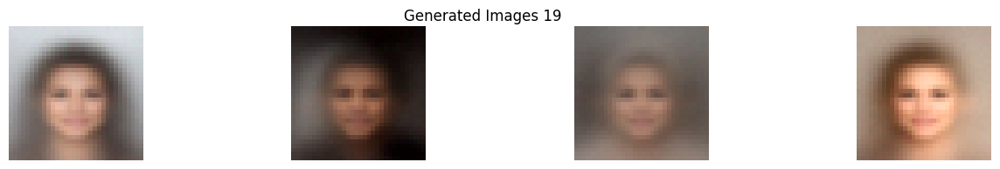

  4%|▍         | 20/501 [00:07<02:29,  3.21it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


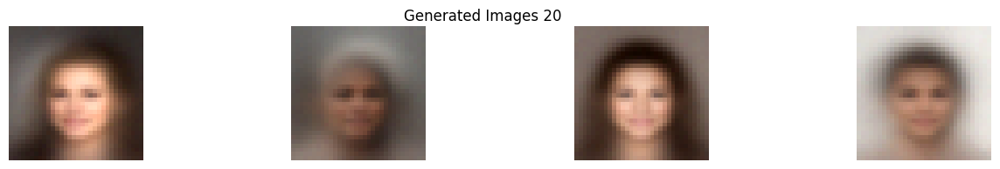

  4%|▍         | 21/501 [00:07<02:27,  3.26it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


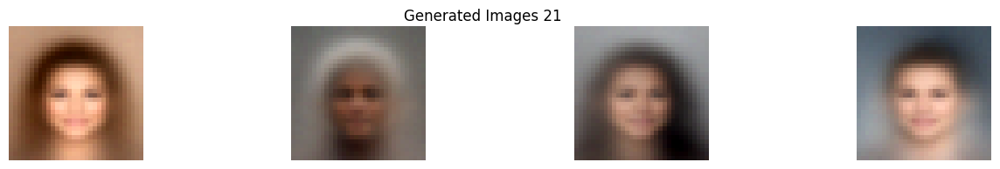

  4%|▍         | 22/501 [00:08<02:30,  3.18it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


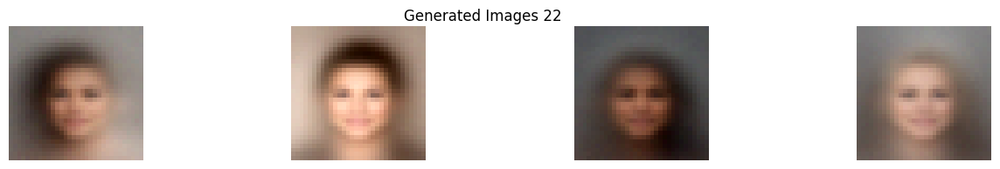

  5%|▍         | 23/501 [00:08<03:59,  2.00it/s]WARNING:matplotlib.image:Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


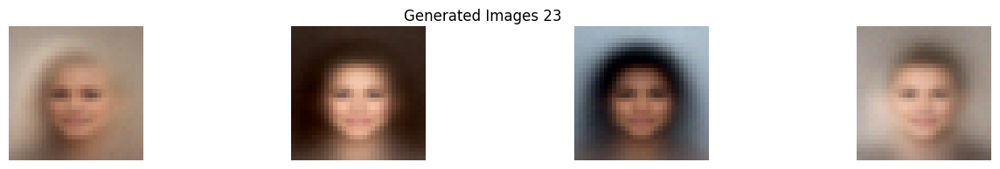

  5%|▍         | 24/501 [00:09<03:27,  2.30it/s]

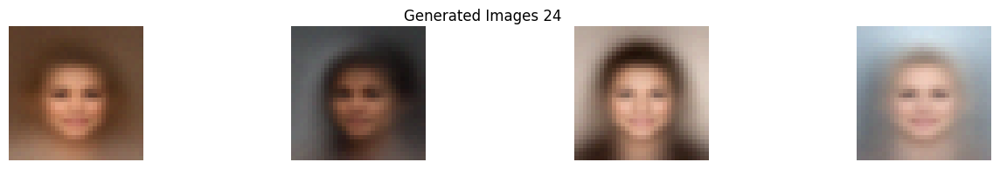

100%|██████████| 501/501 [00:00<00:00, 948.30it/s]


In [ ]:
import numpy as np
from tqdm import tqdm

# Discard labels and only output data
class MyDataset(Dataset):
    def __init__(self, dataset, fn):
        self.dataset = dataset
        self.fn = fn
    def __len__(self):
        return len(self.dataset)
    def __getitem__(self, i):
        return self.fn(self.dataset[i])

# generate 2k images and score in the tensor
total_image = 2000
batch_size = 4
iterations = 2000 // batch_size + 1
model.load_state_dict(torch.load("/content/model.pt"))
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.cuda()

sampled_images = np.zeros((batch_size * iterations, 3, 32, 32), dtype=np.float32)
for i in tqdm(range(iterations)):
  imgs = model.sample_image(batchsize=batch_size)

  imgs_clone = (imgs.clone() + 1) / 2
  if i < 25:
    fig, axes = plt.subplots(1, batch_size, figsize=(batch_size*4, 2))
    for j in range(batch_size):
      axes[j].imshow(imgs_clone[j].permute(1, 2, 0).detach().cpu().numpy())
      axes[j].axis('off')

    # add title
    fig.suptitle(f'Generated Images ' + str(i))
    fig.savefig(f"generation_{i}.png")
    plt.show()
    plt.close()

    sampled_images[i*batch_size:(i+1)*batch_size] = imgs.detach().cpu().numpy()
sampled_images = sampled_images[:total_image]
mydataset = MyDataset(sampled_images, lambda x: x)

model.patch_vae.eval()
patch_vae_images = np.zeros((batch_size * iterations, 3, 32, 32), dtype=np.float32)
for i in tqdm(range(iterations)):
  imgs = model.patch_vae.sample(batch_size)
  patch_vae_images[i*batch_size:(i+1)*batch_size] = imgs.detach().cpu().numpy()
patch_vae_images = patch_vae_images[:total_image]
patch_vae_dataset = MyDataset(patch_vae_images, lambda x: x)

celebdataset = dataset = Subset(dataloader.dataset, torch.arange(2000))  # Limit dataset size

3. Compute FID between images in CelebA dataset and:
    i. Images generated from PatchVAE.
    ii. Images generated from Diffusion

_As seen below, the FID score between the CelebA dataset and the images generated by the Diffusion Transformer is roughly 334, while the FID score between the CelebA dataset and the images generated by the PatchVAE model is roughly 423, indicating that the Diffusion Transformer has learned a distribution of images which is closer to the distribution of images in the CelebA dataset than the distribution learned by the PatchVAE model. Also notice that the computed FID score between the CelebA dataset and itself is approximately -6e-7. The FID score between any distribution and itself is 0, so our computation of the FID score is likely correct, and the small difference is due to numerical error._

In [24]:
! pip install pytorch-fid scipy==1.11.1

In [26]:
from pytorch_fid.inception import InceptionV3
import scipy.linalg as linalg

def build_feature_table(dataset, model, batch_size, dim, device):
    '''
    Argms:
    Input:
        dataset: pytorch dataset, you want to evaluate IS score on
        model: Inception network v3
        batch_size: int number
        dim: for IS computation, dim should be 1000 as the final softmax out put dimension
        device: device type torch.device("cuda:0") or torch.device("cpu")
    Output:
        feature_table: (n,dim) numpy matrix
    '''
    # model enter eval mode
    model.eval()
    # initalize the dataloader
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size)
    n = len(dataset)
    idx_counter = 0
    # feature table
    feature_table = np.zeros((n, dim))

    for i, data in tqdm(enumerate(dataloader, 0)):
        image = data.to(device)

        with torch.no_grad():
            pred = model(image)[0]
            pred = pred.squeeze(3).squeeze(2).cpu().numpy()
            feature_table[idx_counter:idx_counter+pred.shape[0]] = pred
            idx_counter += len(pred)

    return feature_table

def compute_stat(feature_table):
    '''
    Argms:
    Input:
        feature_table: (n,dim) numpy matrix
    Output:
        mu: mean along row dimension
        sigma: covarance matrix of dataset
    '''
    # compute mean and sigma based on activation table
    mu = np.mean(feature_table, axis=0)
    sigma = np.cov(feature_table, rowvar=False)

    return mu, sigma

def compute_FID(mu_1, sigma_1, mu_2, sigma_2, eps=1e-6):
    '''
    Argms:
    Input:
        mu_1: mean vector we get for dataset1
        sigma_1: covariance matrix for dataset1
        mu_2: mean vector we get for dataset2
        sigma_2: covariance matrix for dataset1
    Output:
        FID score: float
    '''

    # compute mu difference

    # compute square root of Sigma1*Sigma2 using "linalg.sqrtm" from scipy
    # please name the resulting matrix as covmean

    ######### BEGIN TODO ########
    covmean, _ = linalg.sqrtm(np.dot(sigma_1, sigma_2), disp=False)
    ######## END TODO ########

    # The following block take care of imagionary part of covmean
    #################################################################
    if not np.isfinite(covmean).all():
        msg = ('fid calculation produces singular product; '
               'adding %s to diagonal of cov estimates') % eps
        print(msg)
        offset = np.eye(sigma_1.shape[0]) * eps
        covmean = linalg.sqrtm((sigma_1 + offset).dot(sigma_2 + offset))

    # Numerical error might give slight imaginary component
    if np.iscomplexobj(covmean):
        if not np.allclose(np.diagonal(covmean).imag, 0, atol=1e-3):
            m = np.max(np.abs(covmean.imag))
            raise ValueError('Imaginary component {}'.format(m))
        covmean = covmean.real
    #################################################################

    ######### BEGIN TODO ########
    diff = mu_1 - mu_2
    mean_diff_term = np.dot(diff, diff)

    cov_sum = sigma_1 + sigma_2
    trace_cov_product = np.trace(covmean)

    FID = mean_diff_term + np.trace(cov_sum) - 2 * trace_cov_product
    ######## END TODO ########

    return FID

def FID(dataset_1, dataset_2, device, batch_size=64, dim=2048, block_idx = 3):
    '''
    Argms:
    Input:
        dataset_1: pytorch dataset
        dataset_2: pytorch dataset
        device: device type torch.device("cuda:0") or torch.device("cpu")
        batch_size: int number
        dim: for IS computation, dim should be 1000 as the final softmax out put dimension
        block_idx: the block stage index we want to use in inception module
    Output:
        FID_score: float
    '''
    # load InveptionV3 model
    model = InceptionV3([block_idx]).to(device)

    ## build up the feature table
    feature_table_1 = build_feature_table(dataset_1, model, batch_size, dim, device)
    feature_table_2 = build_feature_table(dataset_2, model, batch_size, dim, device)


    ## compute mu, sigma for dataset 1&2
    mu_1, sigma_1 = compute_stat(feature_table_1)
    mu_2, sigma_2 = compute_stat(feature_table_2)

    ## FID score computation
    FID_score = compute_FID(mu_1, sigma_1, mu_2, sigma_2, eps=1e-6)

    return FID_score

device = torch.device("cuda:0")
FID_score = FID(celebdataset, celebdataset, device)
print('FID_score between CelebA and itself:', FID_score)

FID_score = FID(celebdataset, mydataset, device)
print('FID_score between CelebA and images sampled from Diffusion Model:', FID_score)

FID_score = FID(celebdataset, patch_vae_dataset, device)
print('FID_score between CelebA and images sampled from PatchVAE:', FID_score)

32it [00:09,  3.30it/s]
32it [00:09,  3.25it/s]


FID_score between CelebA and itself: -6.050079832675692e-07


32it [00:09,  3.36it/s]
32it [00:07,  4.36it/s]


FID_score between CelebA and images sampled from Diffusion Model: 334.1351704503877


32it [00:09,  3.41it/s]
32it [00:07,  4.25it/s]


FID_score between CelebA and images sampled from PatchVAE: 422.879226870435
